<img src="res/logo/coolpi.png" width="200">

# Notebook

# Calculation of the RGB to XYZ transformation matrix: Preparation of data for adjustment

# Nikon D5600

## `ND-ODS`

CIE XYZ ---> Computed from spectral reflectance data

X/100 Y/100 Z/100

RAW RGB ---> 16 bits; black level correction; demosaiced (undo Bayer Pattern); without normalization (illuminant-dependent)

## `ND-WPPDS`

CIE XYZ ---> X, Y, Z Computed from spectral reflectance data. WPP --> WhitePatch Xwpp, Ywpp, Zwpp. 

X/Xwpp Y/Ywpp Z/Zwpp 

RAW RGB ---> 16 bits; black level correction; demosaiced (undo Bayer Pattern). WPP ---> WhitePatch Rwpp, Gwpp, Bwpp

R/Rwpp, G/Gwpp, B/Bwpp

In [1]:
def find_patch_max_value(data):
    max_x = data[data['X'] == data['X'].max()]
    max_y = data[data['Y'] == data['Y'].max()]
    max_z = data[data['Z'] == data['Z'].max()]
    max_r = data[data['R'] == data['R'].max()]
    max_g = data[data['G'] == data['G'].max()]
    max_b = data[data['B'] == data['B'].max()]
    patch_max = {"XYZ": {"patch_id": [max_x.patch_id.values[0], max_y.patch_id.values[0], max_z.patch_id.values[0]]}, 
                 "RGB": {"patch_id": [max_r.patch_id.values[0], max_g.patch_id.values[0], max_b.patch_id.values[0]]}}
    return patch_max

In [2]:
def apply_wpp(data, white_patch):
    res = data[data.patch_id==white_patch].iloc[-1]
    iloc = data.index.get_loc(res.name)
    wpp_data = data.copy()

    Xmax, Ymax, Zmax = float(data.X.iloc[iloc]),float(data.Y.iloc[iloc]) ,float(data.Z.iloc[iloc]) 
    wpp_data["X"] = wpp_data.X/Xmax
    wpp_data["Y"] = wpp_data.Y/Ymax
    wpp_data["Z"] = wpp_data.Z/Zmax

    Rmax, Gmax, Bmax = float(data.R.iloc[iloc]),float(data.G.iloc[iloc]) ,float(data.B.iloc[iloc]) 
    wpp_data["R"] = wpp_data.R/Rmax
    wpp_data["G"] = wpp_data.G/Gmax
    wpp_data["B"] = wpp_data.B/Bmax

    return wpp_data

## Import packages 

In [3]:
import sys
sys.version

'3.9.16 (main, May 15 2023, 23:46:34) \n[GCC 11.2.0]'

In [4]:
import os
import numpy as np
import pandas as pd

%matplotlib inline

## ColourChecker

In [5]:
from coolpi.image.colourchecker import ColourCheckerSpectral

Spectral data measured using a Konica Minolta CM600-d

### CCDSG

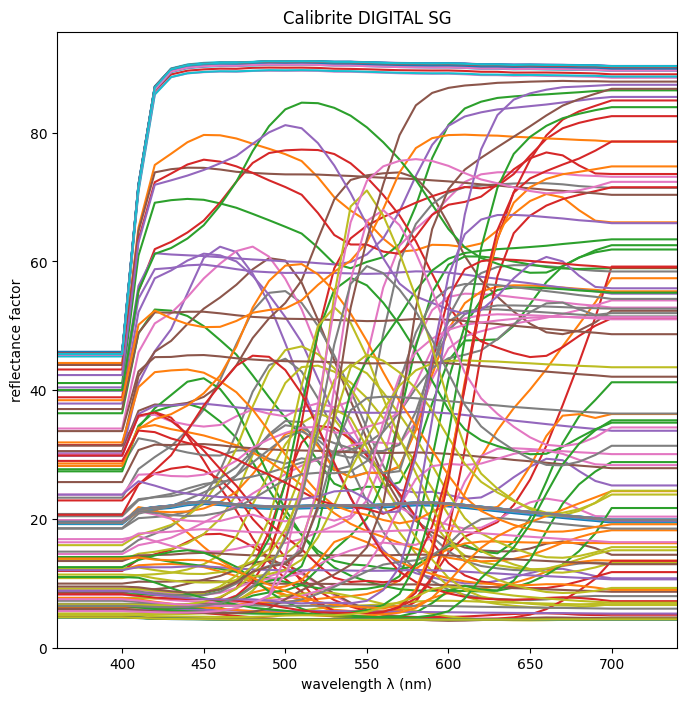

In [6]:
CCDSG = ColourCheckerSpectral("CCDSG")
CCDSG.plot_colourchecker()

### CCC

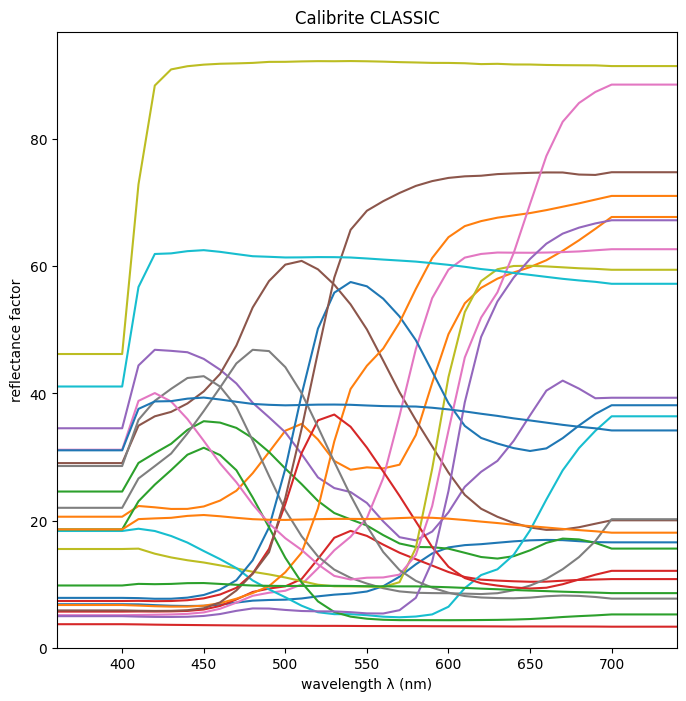

In [7]:
CCC = ColourCheckerSpectral("CCC")
CCC.plot_colourchecker()

### XRCCPP

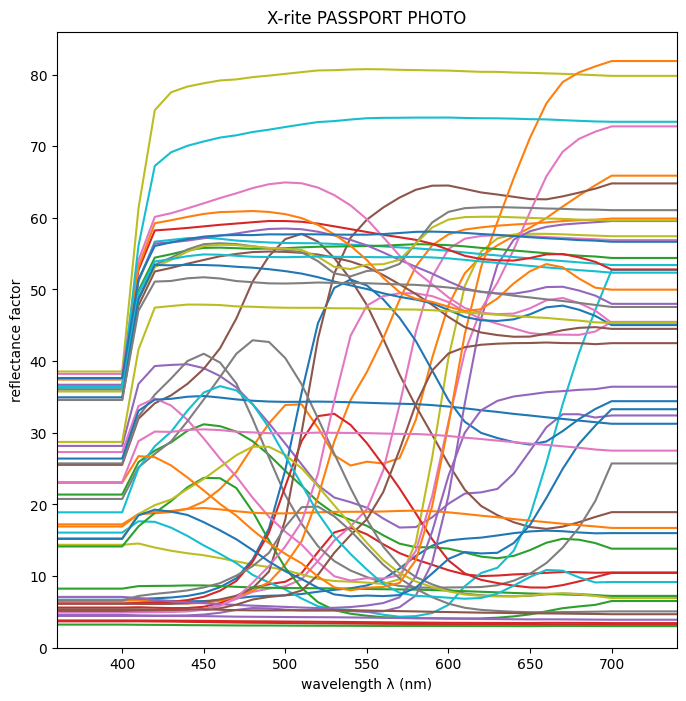

In [8]:
XRCCPP = ColourCheckerSpectral("XRCCPP")
XRCCPP.plot_colourchecker()

### SCK100

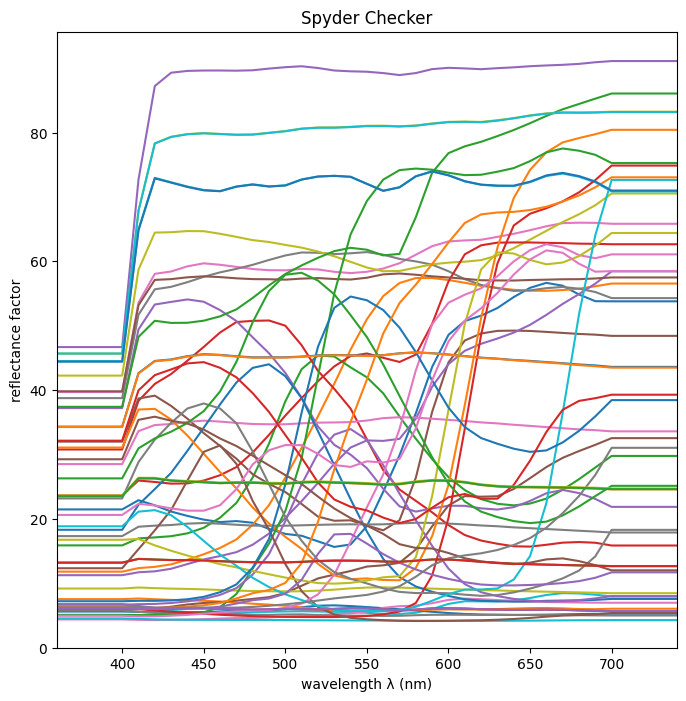

In [9]:
SCK100 = ColourCheckerSpectral("SCK100")
SCK100.plot_colourchecker()

## JN-D65

In [10]:
data_jnd65 = []
data_wpp_jnd65 = []

[Color Viewing Light PRO (EN)](https://www.just-normlicht.com/en/articlelist.html?id=36&name=Color%20Viewing%20Light%20PRO)

| Image                                 |  Illuminant  | ColourChecker                        | Patches |
|---------------------------------------|--------------|--------------------------------------|---------|
| INDIGO_2022-06-19_NikonD5600_0001.NEF | JN-D65-6658ºK | CCDSG  - Calibrite DIGITAL SG        | 96   |
| INDIGO_2022-06-19_NikonD5600_0002.NEF | JN-D65-6658ºK | CCC - Calibrite Classic              | 24      |
| INDIGO_2022-06-19_NikonD5600_0005.NEF | JN-D65-6658ºK | XRCCPP - X-rite PASSPORT PHOTO       | 24      |
| INDIGO_2022-06-19_NikonD5600_0006.NEF | JN-D65-6658ºK | SCK100 - SpyderCHECKR                | 48      |

<img src="res/screenshot/NikonD5600/JND65/INDIGO_2022-06-19_NikonD5600_0001.jpg" width="500">
<img src="res/screenshot/NikonD5600/JND65/INDIGO_2022-06-19_NikonD5600_0002.jpg" width="500">
<img src="res/screenshot/NikonD5600/JND65/INDIGO_2022-06-19_NikonD5600_0005.jpg" width="500">
<img src="res/screenshot/NikonD5600/JND65/INDIGO_2022-06-19_NikonD5600_0006.jpg" width="500">

## SPD Illuminant

In [11]:
from coolpi.colour.cie_colour_spectral import MeasuredIlluminant

JN-D65

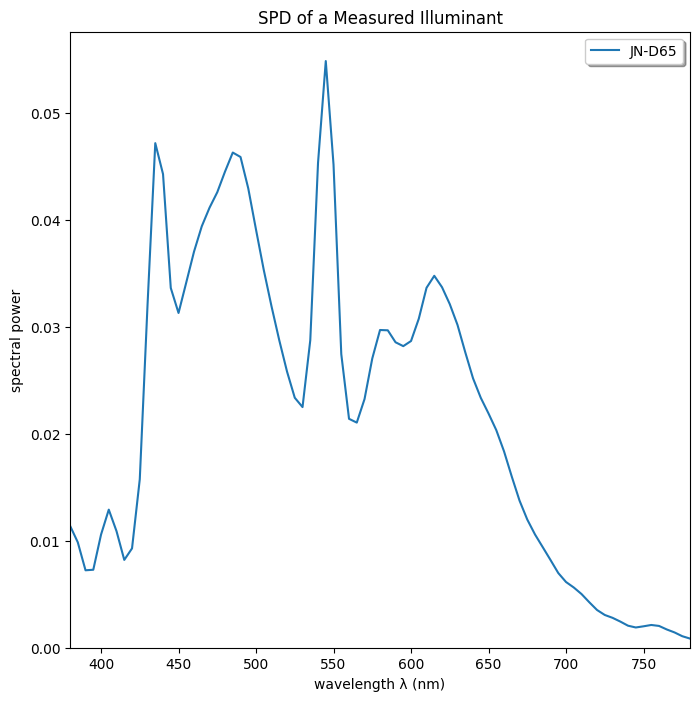

In [12]:
file_spd = ["res", "spd", "SPD_JND65_014_02°_6658K.csv"]
path_spd = os.path.join(*file_spd)

JND65 = MeasuredIlluminant(illuminant_name="JN-D65", path_file=path_spd)

JND65.plot()

### XYZ data (under JND65)

In [13]:
CCDSG_XYZ_JND65 = CCDSG.to_ColourCheckerXYZ(illuminant=JND65, observer=2).as_pandas_dataframe()

In [14]:
CCC_XYZ_JND65 = CCC.to_ColourCheckerXYZ(illuminant=JND65, observer=2).as_pandas_dataframe()

In [15]:
XRCCPP_XYZ_JND65 = XRCCPP.to_ColourCheckerXYZ(illuminant=JND65, observer=2).as_pandas_dataframe()

In [16]:
SCK100_XYZ_JND65 = SCK100.to_ColourCheckerXYZ(illuminant=JND65, observer=2).as_pandas_dataframe()

## RawImage

In [17]:
from coolpi.image.image_objects import RawImage

### CCDSG

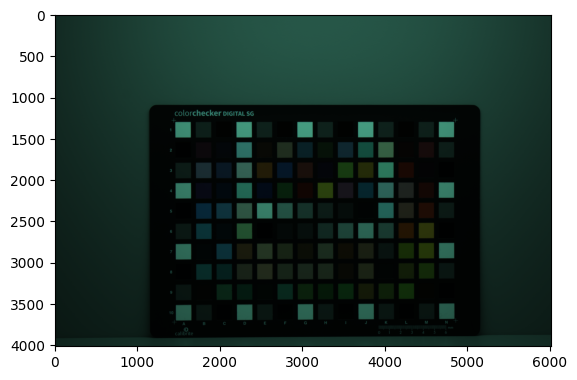

In [18]:
file_raw_0001 = ["data", "NikonD5600", "JN", "D65", "INDIGO_2022-06-19_NikonD5600_0001.NEF"]
path_raw_0001 = os.path.join(*file_raw_0001)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCDSG", "Illuminant": JND65, "Observer":2}
image_0001 = RawImage(path_raw_0001, metadata, method="postprocess")

image_0001.show(method="matplotlib")

RAW RGB data extraction

In [19]:
has_colourchecker, corners, size_rect = image_0001.automatic_colourchecker_extraction(checker_name="CCDSG", opencv_descriptor="SIFT")

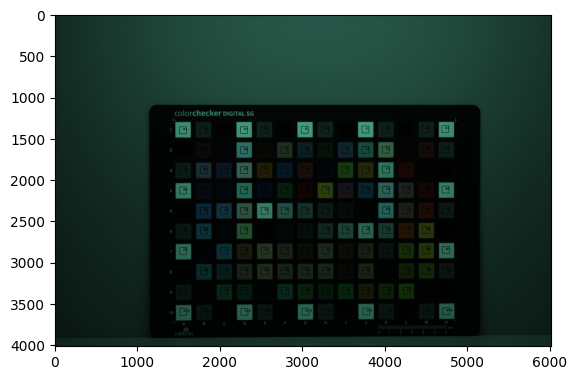

In [20]:
image_0001.show_colourchecker(checker_name="CCDSG", show_image=True, method="matplotlib")

In [21]:
CCDSG_RGB_JND65 = image_0001.get_ColourCheckerRGB("CCDSG").as_pandas_dataframe()

In [22]:
data_ccdsg_jnd65 = pd.merge(CCDSG_XYZ_JND65, CCDSG_RGB_JND65, on="patch_id")
data_ccdsg_jnd65.insert(0, "ColourChecker", "CCDSG")
data_ccdsg_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCDSG,A1,MeasuredIlluminant object: Illuminant JN-D65.,87.452653,90.869673,102.854704,MeasuredIlluminant object: Illuminant JN-D65.,3920.560658,8807.062358,7254.638889
1,CCDSG,A2,MeasuredIlluminant object: Illuminant JN-D65.,4.258184,4.393643,5.082676,MeasuredIlluminant object: Illuminant JN-D65.,55.993481,113.431122,91.934807
2,CCDSG,A3,MeasuredIlluminant object: Illuminant JN-D65.,21.315808,22.087316,25.338945,MeasuredIlluminant object: Illuminant JN-D65.,775.963719,1740.050454,1430.439909
3,CCDSG,A4,MeasuredIlluminant object: Illuminant JN-D65.,86.444293,89.813564,101.846715,MeasuredIlluminant object: Illuminant JN-D65.,3434.776927,7709.100907,6353.670351
4,CCDSG,A5,MeasuredIlluminant object: Illuminant JN-D65.,4.243028,4.379019,5.070155,MeasuredIlluminant object: Illuminant JN-D65.,43.755102,87.405045,70.721939
...,...,...,...,...,...,...,...,...,...,...
135,CCDSG,N6,MeasuredIlluminant object: Illuminant JN-D65.,4.239371,4.375919,5.066419,MeasuredIlluminant object: Illuminant JN-D65.,45.910998,89.049320,70.323129
136,CCDSG,N7,MeasuredIlluminant object: Illuminant JN-D65.,86.909252,90.297089,102.353847,MeasuredIlluminant object: Illuminant JN-D65.,3019.007370,6754.394700,5578.693878
137,CCDSG,N8,MeasuredIlluminant object: Illuminant JN-D65.,21.372877,22.146008,25.370541,MeasuredIlluminant object: Illuminant JN-D65.,623.467971,1390.771542,1149.715420
138,CCDSG,N9,MeasuredIlluminant object: Illuminant JN-D65.,4.213016,4.348211,5.021967,MeasuredIlluminant object: Illuminant JN-D65.,51.474206,104.409297,85.370181


Remove achromatic patches

In [23]:
data_ccdsg_jnd65 = data_ccdsg_jnd65[(data_ccdsg_jnd65["patch_id"].str.contains("1")==False) & (data_ccdsg_jnd65["patch_id"].str.contains("0")==False) & (data_ccdsg_jnd65["patch_id"].str.contains("0")==False) & (data_ccdsg_jnd65["patch_id"].str.contains("A")==False) & (data_ccdsg_jnd65["patch_id"].str.contains("N")==False)]
data_ccdsg_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant JN-D65.,16.812716,10.802438,16.618562,MeasuredIlluminant object: Illuminant JN-D65.,766.883220,548.374150,747.145125
12,CCDSG,B3,MeasuredIlluminant object: Illuminant JN-D65.,39.434604,32.914519,53.850763,MeasuredIlluminant object: Illuminant JN-D65.,1688.922052,2822.260771,3161.057823
13,CCDSG,B4,MeasuredIlluminant object: Illuminant JN-D65.,15.498810,9.813851,29.505199,MeasuredIlluminant object: Illuminant JN-D65.,496.482993,632.854308,1272.656463
14,CCDSG,B5,MeasuredIlluminant object: Illuminant JN-D65.,20.450650,22.372941,64.255072,MeasuredIlluminant object: Illuminant JN-D65.,469.232993,2478.514456,3538.521684
15,CCDSG,B6,MeasuredIlluminant object: Illuminant JN-D65.,25.598898,32.801228,60.716527,MeasuredIlluminant object: Illuminant JN-D65.,680.161565,3181.776644,3444.287415
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant JN-D65.,36.955109,22.551751,8.651562,MeasuredIlluminant object: Illuminant JN-D65.,1918.676871,809.584467,375.446712
125,CCDSG,M6,MeasuredIlluminant object: Illuminant JN-D65.,64.824913,59.510112,11.419430,MeasuredIlluminant object: Illuminant JN-D65.,2794.613946,3307.452381,759.541808
126,CCDSG,M7,MeasuredIlluminant object: Illuminant JN-D65.,58.147465,60.341957,8.783859,MeasuredIlluminant object: Illuminant JN-D65.,2309.598073,3431.549320,617.507370
127,CCDSG,M8,MeasuredIlluminant object: Illuminant JN-D65.,35.900445,43.914358,9.389177,MeasuredIlluminant object: Illuminant JN-D65.,1185.172336,2570.886338,590.011054


In [24]:
data_jnd65.append(data_ccdsg_jnd65)

### WPP

White - E5

In [25]:
patch_max = find_patch_max_value(data_ccdsg_jnd65)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E5', 'E5', 'E5']
['E5', 'E5', 'E5']


In [26]:
data_ccdsg_jnd65 = apply_wpp(data_ccdsg_jnd65, "E5")
data_ccdsg_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant JN-D65.,0.192153,0.118824,0.161651,MeasuredIlluminant object: Illuminant JN-D65.,0.215988,0.069184,0.114175
12,CCDSG,B3,MeasuredIlluminant object: Illuminant JN-D65.,0.450698,0.362052,0.523813,MeasuredIlluminant object: Illuminant JN-D65.,0.475675,0.356060,0.483055
13,CCDSG,B4,MeasuredIlluminant object: Illuminant JN-D65.,0.177136,0.107950,0.287000,MeasuredIlluminant object: Illuminant JN-D65.,0.139831,0.079842,0.194480
14,CCDSG,B5,MeasuredIlluminant object: Illuminant JN-D65.,0.233731,0.246097,0.625016,MeasuredIlluminant object: Illuminant JN-D65.,0.132157,0.312693,0.540737
15,CCDSG,B6,MeasuredIlluminant object: Illuminant JN-D65.,0.292570,0.360806,0.590597,MeasuredIlluminant object: Illuminant JN-D65.,0.191563,0.401417,0.526337
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant JN-D65.,0.422360,0.248064,0.084155,MeasuredIlluminant object: Illuminant JN-D65.,0.540384,0.102138,0.057374
125,CCDSG,M6,MeasuredIlluminant object: Illuminant JN-D65.,0.740884,0.654598,0.111078,MeasuredIlluminant object: Illuminant JN-D65.,0.787086,0.417273,0.116069
126,CCDSG,M7,MeasuredIlluminant object: Illuminant JN-D65.,0.664568,0.663748,0.085442,MeasuredIlluminant object: Illuminant JN-D65.,0.650485,0.432929,0.094364
127,CCDSG,M8,MeasuredIlluminant object: Illuminant JN-D65.,0.410306,0.483048,0.091330,MeasuredIlluminant object: Illuminant JN-D65.,0.333797,0.324347,0.090162


In [27]:
data_ccdsg_jnd65.describe()

,X,Y,Z,R,G,B
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000
mean,0.354949,0.342551,0.285754,0.347575,0.294525,0.266504
std,0.221834,0.220650,0.235935,0.253883,0.233340,0.248964
min,0.048370,0.048045,0.049173,0.013246,0.011769,0.011356
25%,0.168901,0.158515,0.096903,0.131903,0.101700,0.085416
50%,0.325819,0.350650,0.211067,0.310096,0.262920,0.177289
75%,0.460701,0.463334,0.413305,0.527635,0.367411,0.379152
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [28]:
data_wpp_jnd65.append(data_ccdsg_jnd65)

### CCC

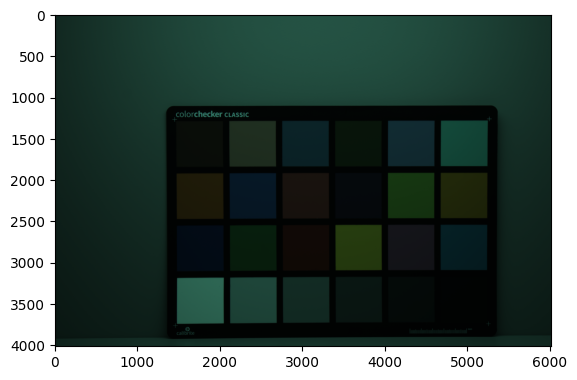

In [29]:
file_raw_0002 = ["data", "NikonD5600", "JN", "D65", "INDIGO_2022-06-19_NikonD5600_0002.NEF"]
path_raw_0002 = os.path.join(*file_raw_0002)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCC", "Illuminant": JND65, "Observer":2}
image_0002 = RawImage(path_raw_0002, metadata, method="postprocess")

image_0002.show(method="matplotlib")

RAW RGB data extraction

In [30]:
corners = {"TopLeft":[1440.11,1267.52], "TopRight":[5249.18,1260.21], "BottomRight":[5239.42,3738.93], "BottomLeft":[1448.59,3761.85]}
image_0002.extract_colourchecker_rgb_patches(checker_name="CCC", corners=corners, size_rect=100)

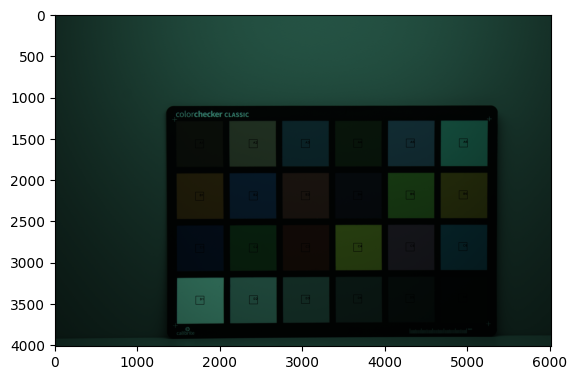

In [31]:
image_0002.show_colourchecker(checker_name="CCC", show_image=True, method="matplotlib")

In [32]:
CCC_RGB_JND65 = image_0002.get_ColourCheckerRGB("CCC").as_pandas_dataframe()

In [33]:
data_ccc_jnd65 = pd.merge(CCC_XYZ_JND65, CCC_RGB_JND65, on="patch_id")
data_ccc_jnd65.insert(0, "ColourChecker", "CCC")
data_ccc_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant JN-D65.,12.161338,10.867907,7.836733,MeasuredIlluminant object: Illuminant JN-D65.,592.2460,838.3808,549.6772
1,CCC,A2,MeasuredIlluminant object: Illuminant JN-D65.,38.866468,35.441211,27.514149,MeasuredIlluminant object: Illuminant JN-D65.,1974.5360,2913.0460,2021.2586
2,CCC,A3,MeasuredIlluminant object: Illuminant JN-D65.,18.832207,19.715033,38.196663,MeasuredIlluminant object: Illuminant JN-D65.,698.7996,2193.5728,2482.1554
3,CCC,A4,MeasuredIlluminant object: Illuminant JN-D65.,11.358989,14.067252,7.930188,MeasuredIlluminant object: Illuminant JN-D65.,512.3904,1307.9115,669.4297
4,CCC,A5,MeasuredIlluminant object: Illuminant JN-D65.,26.606501,24.792184,48.958277,MeasuredIlluminant object: Illuminant JN-D65.,1098.6435,2681.2013,3093.1416
5,CCC,A6,MeasuredIlluminant object: Illuminant JN-D65.,32.692931,44.142315,50.241153,MeasuredIlluminant object: Illuminant JN-D65.,1164.6678,4371.3391,3463.5920
6,CCC,B1,MeasuredIlluminant object: Illuminant JN-D65.,39.675712,31.089729,7.372127,MeasuredIlluminant object: Illuminant JN-D65.,1893.6140,1667.1332,566.9576
7,CCC,B2,MeasuredIlluminant object: Illuminant JN-D65.,14.502884,12.437697,43.477573,MeasuredIlluminant object: Illuminant JN-D65.,425.4212,1488.1216,2339.9944
8,CCC,B3,MeasuredIlluminant object: Illuminant JN-D65.,29.984574,19.975677,14.818104,MeasuredIlluminant object: Illuminant JN-D65.,1540.1636,1176.3255,901.2795
9,CCC,B4,MeasuredIlluminant object: Illuminant JN-D65.,9.136924,6.793883,15.973172,MeasuredIlluminant object: Illuminant JN-D65.,341.8180,578.8716,785.6380


In [34]:
data_jnd65.append(data_ccc_jnd65)

### WPP

White - D1

In [35]:
patch_max = find_patch_max_value(data_ccc_jnd65)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [36]:
data_ccc_jnd65 = apply_wpp(data_ccc_jnd65, "D1")
data_ccc_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant JN-D65.,0.137178,0.117951,0.075320,MeasuredIlluminant object: Illuminant JN-D65.,0.215617,0.135873,0.109140
1,CCC,A2,MeasuredIlluminant object: Illuminant JN-D65.,0.438407,0.384648,0.264442,MeasuredIlluminant object: Illuminant JN-D65.,0.718863,0.472106,0.401327
2,CCC,A3,MeasuredIlluminant object: Illuminant JN-D65.,0.212424,0.213970,0.367113,MeasuredIlluminant object: Illuminant JN-D65.,0.254410,0.355504,0.492840
3,CCC,A4,MeasuredIlluminant object: Illuminant JN-D65.,0.128127,0.152674,0.076218,MeasuredIlluminant object: Illuminant JN-D65.,0.186544,0.211968,0.132917
4,CCC,A5,MeasuredIlluminant object: Illuminant JN-D65.,0.300116,0.269073,0.470544,MeasuredIlluminant object: Illuminant JN-D65.,0.399979,0.434532,0.614153
5,CCC,A6,MeasuredIlluminant object: Illuminant JN-D65.,0.368770,0.479083,0.482874,MeasuredIlluminant object: Illuminant JN-D65.,0.424017,0.708446,0.687707
6,CCC,B1,MeasuredIlluminant object: Illuminant JN-D65.,0.447535,0.337421,0.070854,MeasuredIlluminant object: Illuminant JN-D65.,0.689402,0.270186,0.112571
7,CCC,B2,MeasuredIlluminant object: Illuminant JN-D65.,0.163590,0.134988,0.417868,MeasuredIlluminant object: Illuminant JN-D65.,0.154882,0.241174,0.464613
8,CCC,B3,MeasuredIlluminant object: Illuminant JN-D65.,0.338221,0.216799,0.142419,MeasuredIlluminant object: Illuminant JN-D65.,0.560722,0.190642,0.178952
9,CCC,B4,MeasuredIlluminant object: Illuminant JN-D65.,0.103063,0.073735,0.153520,MeasuredIlluminant object: Illuminant JN-D65.,0.124445,0.093815,0.155991


In [37]:
data_ccc_jnd65.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.320495,0.307067,0.271739,0.394863,0.340498,0.318604
std,0.225423,0.230327,0.233207,0.271552,0.236990,0.244629
min,0.037175,0.037063,0.038716,0.036502,0.036098,0.037318
25%,0.156987,0.141961,0.095770,0.171297,0.176950,0.130741
50%,0.271813,0.225533,0.189085,0.389410,0.286772,0.222234
75%,0.417245,0.426839,0.419261,0.592480,0.445396,0.448201
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [38]:
data_wpp_jnd65.append(data_ccc_jnd65)

### XRCCPP

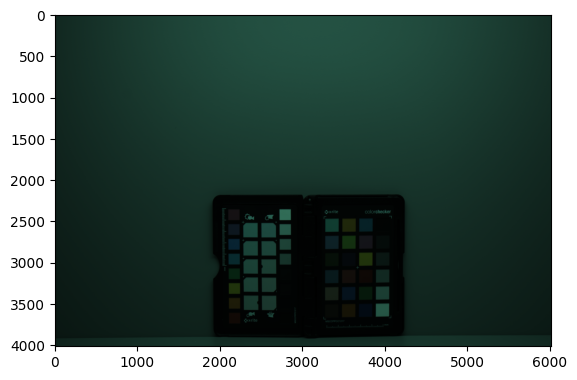

In [39]:
file_raw_0005 = ["data", "NikonD5600", "JN", "D65", "INDIGO_2022-06-19_NikonD5600_0005.NEF"]
path_raw_0005 = os.path.join(*file_raw_0005)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "XRCCPP", "Illuminant": JND65, "Observer":2}
image_0005 = RawImage(path_raw_0005, metadata, method="postprocess")

image_0005.show(method="matplotlib")

RAW RGB data extraction

In [40]:
has_colourchecker, corners, size_rect = image_0005.automatic_colourchecker_extraction(checker_name="XRCCPP_24", opencv_descriptor="SIFT")

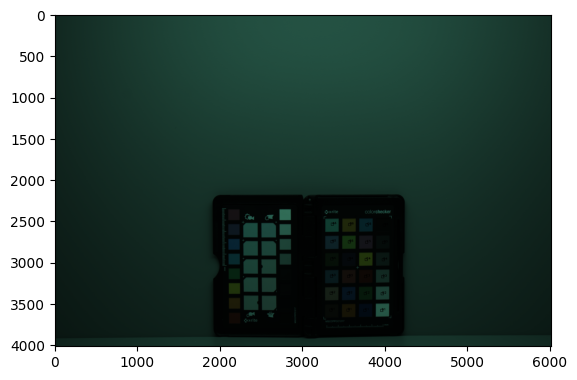

In [41]:
image_0005.show_colourchecker(checker_name="XRCCPP", show_image=True, method="matplotlib")

In [42]:
XRCCPP_RGB_JND65 = image_0005.get_ColourCheckerRGB("XRCCPP").as_pandas_dataframe()

In [43]:
data_xrccpp_jnd65 = pd.merge(XRCCPP_XYZ_JND65, XRCCPP_RGB_JND65, on="patch_id")
data_xrccpp_jnd65.insert(0, "ColourChecker", "XRCCPP")
data_xrccpp_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant JN-D65.,11.682147,10.505585,7.674905,MeasuredIlluminant object: Illuminant JN-D65.,413.713333,598.942222,397.766667
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant JN-D65.,37.116775,33.598211,25.988819,MeasuredIlluminant object: Illuminant JN-D65.,1376.560000,2018.382222,1427.680000
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant JN-D65.,16.659447,17.410562,33.552894,MeasuredIlluminant object: Illuminant JN-D65.,532.400000,1614.717778,1786.513333
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant JN-D65.,10.422630,12.863322,7.560603,MeasuredIlluminant object: Illuminant JN-D65.,391.431111,985.033333,517.051111
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant JN-D65.,22.887567,21.483147,42.083465,MeasuredIlluminant object: Illuminant JN-D65.,875.968889,2144.177778,2455.853333
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant JN-D65.,30.755596,41.804348,48.179511,MeasuredIlluminant object: Illuminant JN-D65.,1043.024444,3907.877778,3105.395556
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant JN-D65.,37.059534,29.218095,7.138344,MeasuredIlluminant object: Illuminant JN-D65.,1414.711111,1273.977778,439.262222
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant JN-D65.,14.098856,12.210472,41.591808,MeasuredIlluminant object: Illuminant JN-D65.,348.988889,1190.688889,1832.440000
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant JN-D65.,28.614627,19.048351,14.262669,MeasuredIlluminant object: Illuminant JN-D65.,1205.128889,902.768889,693.022222
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant JN-D65.,8.626413,6.552984,15.146518,MeasuredIlluminant object: Illuminant JN-D65.,315.857778,564.717778,733.702222


In [44]:
data_jnd65.append(data_xrccpp_jnd65)

### WPP

White - D1

In [45]:
patch_max = find_patch_max_value(data_xrccpp_jnd65)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [46]:
data_xrccpp_jnd65 = apply_wpp(data_xrccpp_jnd65, "D1")
data_xrccpp_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant JN-D65.,0.151118,0.130503,0.085781,MeasuredIlluminant object: Illuminant JN-D65.,0.166225,0.108115,0.088570
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant JN-D65.,0.480136,0.417365,0.290474,MeasuredIlluminant object: Illuminant JN-D65.,0.553086,0.364339,0.317898
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant JN-D65.,0.215504,0.216278,0.375017,MeasuredIlluminant object: Illuminant JN-D65.,0.213912,0.291473,0.397799
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant JN-D65.,0.134825,0.159791,0.084504,MeasuredIlluminant object: Illuminant JN-D65.,0.157273,0.177809,0.115131
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant JN-D65.,0.296069,0.266869,0.470362,MeasuredIlluminant object: Illuminant JN-D65.,0.351954,0.387046,0.546839
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant JN-D65.,0.397849,0.519303,0.538497,MeasuredIlluminant object: Illuminant JN-D65.,0.419075,0.705412,0.691471
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant JN-D65.,0.479396,0.362954,0.079784,MeasuredIlluminant object: Illuminant JN-D65.,0.568415,0.229966,0.097809
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant JN-D65.,0.182380,0.151681,0.464867,MeasuredIlluminant object: Illuminant JN-D65.,0.140220,0.214931,0.408025
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant JN-D65.,0.370154,0.236623,0.159412,MeasuredIlluminant object: Illuminant JN-D65.,0.484207,0.162959,0.154314
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant JN-D65.,0.111590,0.081403,0.169291,MeasuredIlluminant object: Illuminant JN-D65.,0.126908,0.101937,0.163372


In [47]:
data_xrccpp_jnd65.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.333597,0.319170,0.285568,0.383852,0.337733,0.317328
std,0.228244,0.232671,0.238927,0.266276,0.238963,0.242523
min,0.041754,0.041626,0.045276,0.051272,0.052517,0.055386
25%,0.173476,0.151689,0.100220,0.160286,0.155142,0.149866
50%,0.277177,0.238427,0.206532,0.356328,0.272601,0.247681
75%,0.436617,0.438645,0.445660,0.520565,0.457924,0.426125
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [48]:
data_wpp_jnd65.append(data_xrccpp_jnd65)

### SCK100

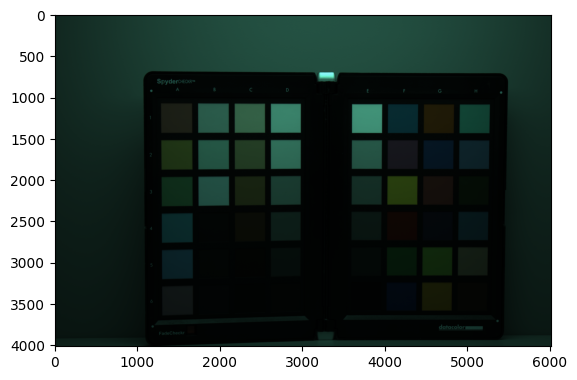

In [49]:
file_raw_0006 = ["data", "NikonD5600", "JN", "D65", "INDIGO_2022-06-19_NikonD5600_0006.NEF"]
path_raw_0006 = os.path.join(*file_raw_0006)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "SCK100", "Illuminant": JND65, "Observer":2}
image_0006 = RawImage(path_raw_0006, metadata, method="postprocess")

image_0006.show(method="matplotlib")

RAW RGB data extraction

In [50]:
has_colourchecker, corners, size_rect = image_0006.automatic_colourchecker_extraction(checker_name="SCK100_48", opencv_descriptor="SIFT")

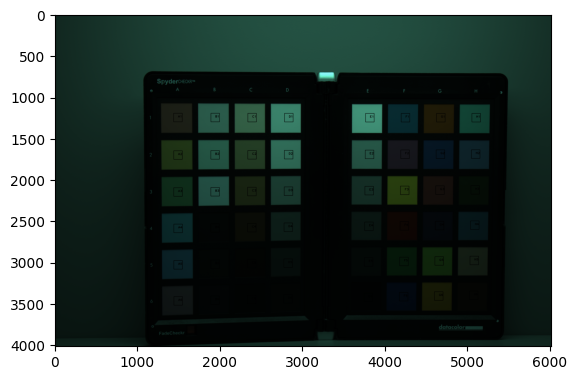

In [51]:
image_0006.show_colourchecker(checker_name="SCK100", show_image=True, method="matplotlib")

In [52]:
SCK100_RGB_JND65 = image_0006.get_ColourCheckerRGB("SCK100").as_pandas_dataframe()

In [53]:
data_sck100_jnd65 = pd.merge(SCK100_XYZ_JND65, SCK100_RGB_JND65, on="patch_id")
data_sck100_jnd65.insert(0, "ColourChecker", "SCK100")
data_sck100_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant JN-D65.,35.874225,28.368947,22.605637,MeasuredIlluminant object: Illuminant JN-D65.,1768.109467,1970.932322,1422.105769
1,SCK100,A2,MeasuredIlluminant object: Illuminant JN-D65.,45.853731,47.327781,18.582463,MeasuredIlluminant object: Illuminant JN-D65.,1938.553254,3232.115015,1353.241494
2,SCK100,A3,MeasuredIlluminant object: Illuminant JN-D65.,26.942344,35.791162,24.707532,MeasuredIlluminant object: Illuminant JN-D65.,917.908746,2763.327848,1616.797060
3,SCK100,A4,MeasuredIlluminant object: Illuminant JN-D65.,25.687339,31.474444,53.628007,MeasuredIlluminant object: Illuminant JN-D65.,655.679919,2573.228180,2612.713203
4,SCK100,A5,MeasuredIlluminant object: Illuminant JN-D65.,27.692130,28.648195,58.413829,MeasuredIlluminant object: Illuminant JN-D65.,656.633506,2070.821006,2387.840237
5,SCK100,A6,MeasuredIlluminant object: Illuminant JN-D65.,34.759433,27.434498,36.299202,MeasuredIlluminant object: Illuminant JN-D65.,971.113720,1306.562685,1284.610207
6,SCK100,B1,MeasuredIlluminant object: Illuminant JN-D65.,59.205677,60.016335,67.157318,MeasuredIlluminant object: Illuminant JN-D65.,2683.532729,5757.398669,4723.803070
7,SCK100,B2,MeasuredIlluminant object: Illuminant JN-D65.,56.316642,60.017468,65.913078,MeasuredIlluminant object: Illuminant JN-D65.,2267.275148,5329.065459,4265.757766
8,SCK100,B3,MeasuredIlluminant object: Illuminant JN-D65.,58.641979,60.245612,72.835623,MeasuredIlluminant object: Illuminant JN-D65.,2142.680843,4879.344675,4177.823225
9,SCK100,B4,MeasuredIlluminant object: Illuminant JN-D65.,6.017710,5.838285,6.322340,MeasuredIlluminant object: Illuminant JN-D65.,177.257396,325.254068,266.758876


In [54]:
data_jnd65.append(data_sck100_jnd65)

### WPP

White - E1

In [55]:
patch_max = find_patch_max_value(data_sck100_jnd65)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E1', 'E1', 'E1']
['E1', 'E1', 'E1']


In [56]:
data_sck100_jnd65 = apply_wpp(data_sck100_jnd65, "E1")
data_sck100_jnd65

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant JN-D65.,0.414756,0.316406,0.222303,MeasuredIlluminant object: Illuminant JN-D65.,0.428011,0.212683,0.187007
1,SCK100,A2,MeasuredIlluminant object: Illuminant JN-D65.,0.530133,0.527859,0.182739,MeasuredIlluminant object: Illuminant JN-D65.,0.469271,0.348777,0.177952
2,SCK100,A3,MeasuredIlluminant object: Illuminant JN-D65.,0.311491,0.399188,0.242973,MeasuredIlluminant object: Illuminant JN-D65.,0.222201,0.298191,0.212609
3,SCK100,A4,MeasuredIlluminant object: Illuminant JN-D65.,0.296982,0.351042,0.527375,MeasuredIlluminant object: Illuminant JN-D65.,0.158722,0.277677,0.343573
4,SCK100,A5,MeasuredIlluminant object: Illuminant JN-D65.,0.320160,0.319521,0.574439,MeasuredIlluminant object: Illuminant JN-D65.,0.158953,0.223462,0.314002
5,SCK100,A6,MeasuredIlluminant object: Illuminant JN-D65.,0.401868,0.305984,0.356965,MeasuredIlluminant object: Illuminant JN-D65.,0.235080,0.140991,0.168927
6,SCK100,B1,MeasuredIlluminant object: Illuminant JN-D65.,0.684500,0.669377,0.660422,MeasuredIlluminant object: Illuminant JN-D65.,0.649610,0.621281,0.621182
7,SCK100,B2,MeasuredIlluminant object: Illuminant JN-D65.,0.651099,0.669390,0.648186,MeasuredIlluminant object: Illuminant JN-D65.,0.548845,0.575059,0.560949
8,SCK100,B3,MeasuredIlluminant object: Illuminant JN-D65.,0.677983,0.671935,0.716262,MeasuredIlluminant object: Illuminant JN-D65.,0.518684,0.526530,0.549385
9,SCK100,B4,MeasuredIlluminant object: Illuminant JN-D65.,0.069573,0.065116,0.062174,MeasuredIlluminant object: Illuminant JN-D65.,0.042909,0.035098,0.035079


In [57]:
data_sck100_jnd65.describe()

,X,Y,Z,R,G,B
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,0.350192,0.339869,0.304172,0.285349,0.256741,0.242018
std,0.246506,0.247714,0.250236,0.249436,0.237248,0.238007
min,0.047086,0.047152,0.048495,0.019187,0.018977,0.019271
25%,0.144442,0.137064,0.082608,0.083118,0.073900,0.055414
50%,0.315825,0.295484,0.232638,0.218398,0.182922,0.163018
75%,0.511791,0.486081,0.460440,0.438326,0.359509,0.330793
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [58]:
data_wpp_jnd65.append(data_sck100_jnd65)

## Merge data

In [59]:
data_pd_jnd65 = pd.concat(data_jnd65, ignore_index=True)

data_pd_jnd65 = data_pd_jnd65.drop(columns="illuminant_y")
data_pd_jnd65 = data_pd_jnd65.rename(columns={"illuminant_x":"illuminant"})
data_pd_jnd65["illuminant"] = "JN-D65" # as str to avoid error
data_pd_jnd65

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JN-D65,16.812716,10.802438,16.618562,766.883220,548.374150,747.145125
1,CCDSG,B3,JN-D65,39.434604,32.914519,53.850763,1688.922052,2822.260771,3161.057823
2,CCDSG,B4,JN-D65,15.498810,9.813851,29.505199,496.482993,632.854308,1272.656463
3,CCDSG,B5,JN-D65,20.450650,22.372941,64.255072,469.232993,2478.514456,3538.521684
4,CCDSG,B6,JN-D65,25.598898,32.801228,60.716527,680.161565,3181.776644,3444.287415
...,...,...,...,...,...,...,...,...,...
187,SCK100,H2,JN-D65,25.633882,24.165697,47.735452,841.154586,2111.554364,2483.136464
188,SCK100,H3,JN-D65,10.410667,13.042793,7.622017,299.510355,791.230030,367.171413
189,SCK100,H4,JN-D65,18.154503,19.182975,36.995415,429.433617,1378.995192,1544.819342
190,SCK100,H5,JN-D65,37.817679,34.640957,26.945944,1167.381657,1737.573225,1194.742049


In [60]:
data_pd_wpp_jnd65 = pd.concat(data_wpp_jnd65, ignore_index=True)

data_pd_wpp_jnd65 = data_pd_wpp_jnd65.drop(columns="illuminant_y")
data_pd_wpp_jnd65 = data_pd_wpp_jnd65.rename(columns={"illuminant_x":"illuminant"})
data_pd_wpp_jnd65["illuminant"] = "JN-D65" # as str to avoid error
data_pd_wpp_jnd65

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JN-D65,0.192153,0.118824,0.161651,0.215988,0.069184,0.114175
1,CCDSG,B3,JN-D65,0.450698,0.362052,0.523813,0.475675,0.356060,0.483055
2,CCDSG,B4,JN-D65,0.177136,0.107950,0.287000,0.139831,0.079842,0.194480
3,CCDSG,B5,JN-D65,0.233731,0.246097,0.625016,0.132157,0.312693,0.540737
4,CCDSG,B6,JN-D65,0.292570,0.360806,0.590597,0.191563,0.401417,0.526337
...,...,...,...,...,...,...,...,...,...
187,SCK100,H2,JN-D65,0.296364,0.269526,0.469428,0.203621,0.227858,0.326533
188,SCK100,H3,JN-D65,0.120362,0.145470,0.074955,0.072503,0.085382,0.048283
189,SCK100,H4,JN-D65,0.209891,0.213953,0.363811,0.103954,0.148807,0.203144
190,SCK100,H5,JN-D65,0.437225,0.386359,0.264985,0.282591,0.187501,0.157109


## JN-A

In [61]:
data_jna = []
data_wpp_jna = []

| Image                                 |  Illuminant  | ColourChecker                        | Patches |
|---------------------------------------|--------------|--------------------------------------|---------|
| INDIGO_2022-06-19_NikonD5600_0013.NEF | JN-A-2681ºK   | CCDSG  - Calibrite DIGITAL SG        | 96     |
| INDIGO_2022-06-19_NikonD5600_0014.NEF | JN-A-2681ºK   | CCC - Calibrite Classic              | 24      |
| INDIGO_2022-06-19_NikonD5600_0017.NEF | JN-A-2681ºK   | XRCCPP - X-rite PASSPORT PHOTO       | 24      |
| INDIGO_2022-06-19_NikonD5600_0018.NEF | JN-A-2681ºK   | SCK100 - SpyderCHECKR                | 48      |

<img src="res/screenshot/NikonD5600/JNA/INDIGO_2022-06-19_NikonD5600_0013.jpg" width="500">
<img src="res/screenshot/NikonD5600/JNA/INDIGO_2022-06-19_NikonD5600_0014.jpg" width="500">
<img src="res/screenshot/NikonD5600/JNA/INDIGO_2022-06-19_NikonD5600_0017.jpg" width="500">
<img src="res/screenshot/NikonD5600/JNA/INDIGO_2022-06-19_NikonD5600_0018.jpg" width="500">

## SPD Illuminant

JNA

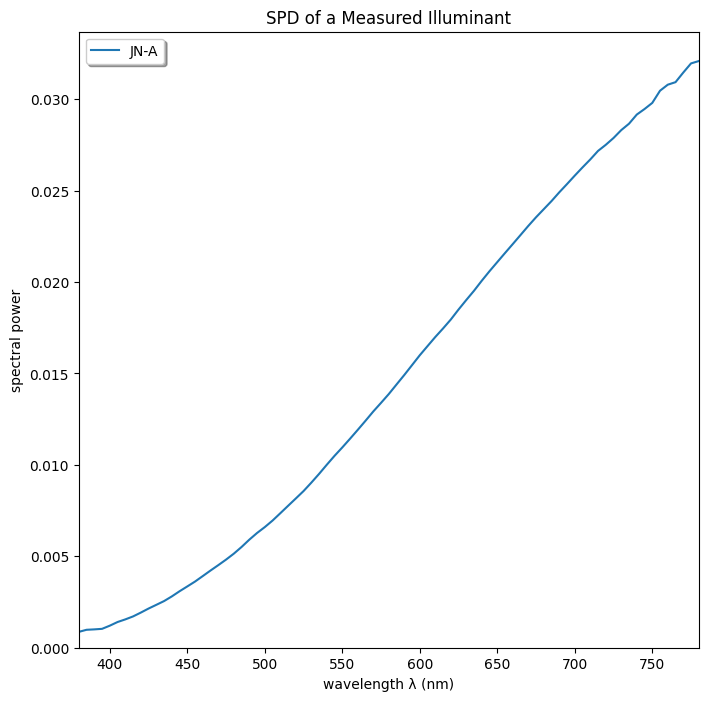

In [62]:
file_spd = ["res", "spd", "SPD_JNA_015_02°_2681K.csv"]
path_spd = os.path.join(*file_spd)

JNA = MeasuredIlluminant(illuminant_name="JN-A", path_file=path_spd)

JNA.plot()

XYZ data (under JNA)

In [63]:
CCDSG_XYZ_JNA = CCDSG.to_ColourCheckerXYZ(illuminant=JNA, observer=2).as_pandas_dataframe()

In [64]:
CCC_XYZ_JNA = CCC.to_ColourCheckerXYZ(illuminant=JNA, observer=2).as_pandas_dataframe()

In [65]:
XRCCPP_XYZ_JNA = XRCCPP.to_ColourCheckerXYZ(illuminant=JNA, observer=2).as_pandas_dataframe()

In [66]:
SCK100_XYZ_JNA = SCK100.to_ColourCheckerXYZ(illuminant=JNA, observer=2).as_pandas_dataframe()

## RawImage

### CCDSG

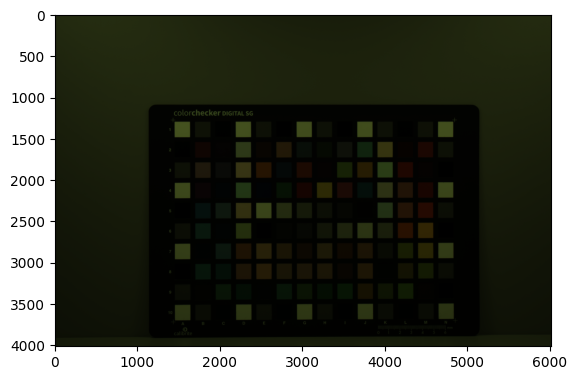

In [67]:
file_raw_0013 = ["data", "NikonD5600", "JN", "A", "INDIGO_2022-06-19_NikonD5600_0013.NEF"]
path_raw_0013 = os.path.join(*file_raw_0013)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCDSG", "Illuminant": JNA, "Observer":2}
image_0013 = RawImage(path_raw_0013, metadata, method="postprocess")

image_0013.show(method="matplotlib")

RAW RGB data extraction

In [68]:
has_colourchecker, corners, size_rect = image_0013.automatic_colourchecker_extraction(checker_name="CCDSG", opencv_descriptor="SIFT")

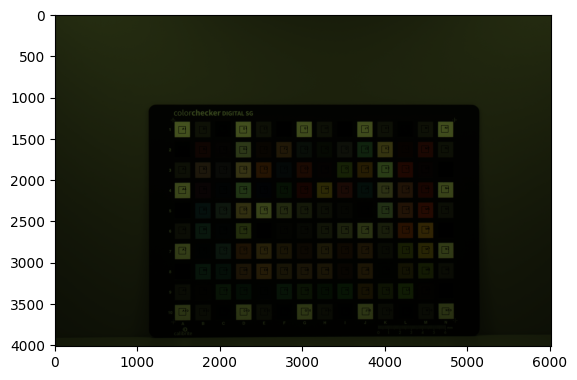

In [69]:
image_0013.show_colourchecker(checker_name="CCDSG", show_image=True, method="matplotlib")

In [70]:
CCDSG_RGB_JNA = image_0013.get_ColourCheckerRGB("CCDSG").as_pandas_dataframe()

In [71]:
data_ccdsg_jna = pd.merge(CCDSG_XYZ_JNA, CCDSG_RGB_JNA, on="patch_id")
data_ccdsg_jna.insert(0, "ColourChecker", "CCDSG")
data_ccdsg_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCDSG,A1,MeasuredIlluminant object: Illuminant JN-A.,101.634450,90.808205,27.586741,MeasuredIlluminant object: Illuminant JN-A.,4393.171910,5232.182823,2008.277636
1,CCDSG,A2,MeasuredIlluminant object: Illuminant JN-A.,4.937454,4.394577,1.361311,MeasuredIlluminant object: Illuminant JN-A.,58.716553,63.895692,24.995465
2,CCDSG,A3,MeasuredIlluminant object: Illuminant JN-A.,24.599087,22.062397,6.786872,MeasuredIlluminant object: Illuminant JN-A.,863.306689,1035.579649,395.176871
3,CCDSG,A4,MeasuredIlluminant object: Illuminant JN-A.,100.420298,89.736407,27.313159,MeasuredIlluminant object: Illuminant JN-A.,3850.053855,4580.650227,1756.119615
4,CCDSG,A5,MeasuredIlluminant object: Illuminant JN-A.,4.918034,4.378945,1.357804,MeasuredIlluminant object: Illuminant JN-A.,47.087585,51.509070,20.794501
...,...,...,...,...,...,...,...,...,...,...
135,CCDSG,N6,MeasuredIlluminant object: Illuminant JN-A.,4.913907,4.375571,1.356933,MeasuredIlluminant object: Illuminant JN-A.,48.397959,51.066893,20.195011
136,CCDSG,N7,MeasuredIlluminant object: Illuminant JN-A.,100.974118,90.224520,27.448508,MeasuredIlluminant object: Illuminant JN-A.,3197.934240,3791.062925,1442.467120
137,CCDSG,N8,MeasuredIlluminant object: Illuminant JN-A.,24.674884,22.124883,6.796033,MeasuredIlluminant object: Illuminant JN-A.,659.284014,783.085317,298.678571
138,CCDSG,N9,MeasuredIlluminant object: Illuminant JN-A.,4.886935,4.349395,1.345346,MeasuredIlluminant object: Illuminant JN-A.,54.365646,59.942177,24.010771


In [72]:
data_ccdsg_jna = data_ccdsg_jna[(data_ccdsg_jna["patch_id"].str.contains("1")==False) & (data_ccdsg_jna["patch_id"].str.contains("0")==False) & (data_ccdsg_jna["patch_id"].str.contains("0")==False) & (data_ccdsg_jna["patch_id"].str.contains("A")==False) & (data_ccdsg_jna["patch_id"].str.contains("N")==False)]
data_ccdsg_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant JN-A.,23.260021,13.376909,4.184976,MeasuredIlluminant object: Illuminant JN-A.,1005.775794,339.353741,180.147676
12,CCDSG,B3,MeasuredIlluminant object: Illuminant JN-A.,46.745364,34.688946,13.982877,MeasuredIlluminant object: Illuminant JN-A.,1926.222789,1555.256236,779.599773
13,CCDSG,B4,MeasuredIlluminant object: Illuminant JN-A.,17.697077,10.910268,7.296986,MeasuredIlluminant object: Illuminant JN-A.,598.218112,292.304422,273.289257
14,CCDSG,B5,MeasuredIlluminant object: Illuminant JN-A.,15.405257,17.531298,16.958977,MeasuredIlluminant object: Illuminant JN-A.,373.286565,1050.386763,849.576531
15,CCDSG,B6,MeasuredIlluminant object: Illuminant JN-A.,22.593956,27.131710,16.412535,MeasuredIlluminant object: Illuminant JN-A.,603.619615,1531.867063,891.432823
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant JN-A.,56.523863,30.993538,2.319888,MeasuredIlluminant object: Illuminant JN-A.,2370.132086,693.742063,135.191610
125,CCDSG,M6,MeasuredIlluminant object: Illuminant JN-A.,90.092730,69.357131,3.376821,MeasuredIlluminant object: Illuminant JN-A.,3175.675170,2395.314342,302.854025
126,CCDSG,M7,MeasuredIlluminant object: Illuminant JN-A.,79.056163,66.820673,2.832905,MeasuredIlluminant object: Illuminant JN-A.,2595.888322,2402.418934,291.242063
127,CCDSG,M8,MeasuredIlluminant object: Illuminant JN-A.,45.635162,45.239273,2.981263,MeasuredIlluminant object: Illuminant JN-A.,1259.481293,1692.744615,244.335743


In [73]:
data_jna.append(data_ccdsg_jna)

### WPP

White - E5

In [74]:
patch_max = find_patch_max_value(data_ccdsg_jna)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E5', 'E5', 'E5']
['E5', 'E5', 'E5']


In [75]:
data_ccdsg_jna = apply_wpp(data_ccdsg_jna, "E5")
data_ccdsg_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant JN-A.,0.228685,0.147222,0.151768,MeasuredIlluminant object: Illuminant JN-A.,0.274967,0.078430,0.108858
12,CCDSG,B3,MeasuredIlluminant object: Illuminant JN-A.,0.459586,0.381776,0.507088,MeasuredIlluminant object: Illuminant JN-A.,0.526605,0.359444,0.471089
13,CCDSG,B4,MeasuredIlluminant object: Illuminant JN-A.,0.173992,0.120075,0.264624,MeasuredIlluminant object: Illuminant JN-A.,0.163545,0.067556,0.165141
14,CCDSG,B5,MeasuredIlluminant object: Illuminant JN-A.,0.151460,0.192944,0.615016,MeasuredIlluminant object: Illuminant JN-A.,0.102052,0.242761,0.513374
15,CCDSG,B6,MeasuredIlluminant object: Illuminant JN-A.,0.222137,0.298604,0.595199,MeasuredIlluminant object: Illuminant JN-A.,0.165022,0.354038,0.538666
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant JN-A.,0.555725,0.341106,0.084131,MeasuredIlluminant object: Illuminant JN-A.,0.647964,0.160335,0.081692
125,CCDSG,M6,MeasuredIlluminant object: Illuminant JN-A.,0.885764,0.763324,0.122460,MeasuredIlluminant object: Illuminant JN-A.,0.868190,0.553594,0.183006
126,CCDSG,M7,MeasuredIlluminant object: Illuminant JN-A.,0.777256,0.735409,0.102735,MeasuredIlluminant object: Illuminant JN-A.,0.709683,0.555236,0.175989
127,CCDSG,M8,MeasuredIlluminant object: Illuminant JN-A.,0.448671,0.497890,0.108115,MeasuredIlluminant object: Illuminant JN-A.,0.344326,0.391219,0.147645


In [76]:
data_ccdsg_jna.describe()

,X,Y,Z,R,G,B
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000
mean,0.375617,0.354626,0.288844,0.358647,0.303469,0.273929
std,0.243271,0.227140,0.234254,0.265688,0.231648,0.237371
min,0.048239,0.048074,0.049099,0.012774,0.011581,0.012010
25%,0.155501,0.172408,0.106853,0.121582,0.117880,0.106775
50%,0.360115,0.327063,0.211628,0.318240,0.285276,0.195088
75%,0.530731,0.475560,0.399212,0.549834,0.395749,0.367459
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [77]:
data_wpp_jna.append(data_ccdsg_jna)

### CCC

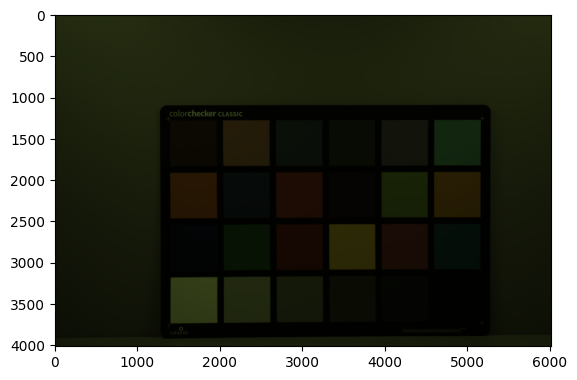

In [78]:
file_raw_0014 = ["data", "NikonD5600", "JN", "A", "INDIGO_2022-06-19_NikonD5600_0014.NEF"]
path_raw_0014 = os.path.join(*file_raw_0014)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCC", "Illuminant": JNA, "Observer":2}
image_0014 = RawImage(path_raw_0014, metadata, method="postprocess")

image_0014.show(method="matplotlib")

RAW RGB data extraction

In [79]:
corners = {"TopLeft":[1363.14,1258.43], "TopRight":[5163.88,1253.29], "BottomRight":[5162.45,3729.84], "BottomLeft":[1371.64,3757]}
image_0014.extract_colourchecker_rgb_patches(checker_name="CCC", corners=corners, size_rect=100)

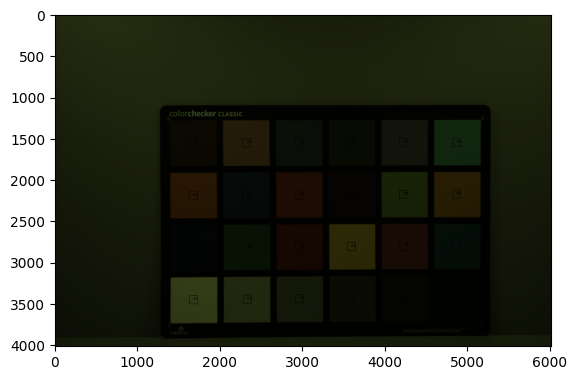

In [80]:
image_0014.show_colourchecker(checker_name="CCC", show_image=True, method="matplotlib")

In [81]:
CCC_RGB_JNA = image_0014.get_ColourCheckerRGB("CCC").as_pandas_dataframe()

In [82]:
data_ccc_jna = pd.merge(CCC_XYZ_JNA, CCC_RGB_JNA, on="patch_id")
data_ccc_jna.insert(0, "ColourChecker", "CCC")
data_ccc_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant JN-A.,16.051525,12.142073,2.138677,MeasuredIlluminant object: Illuminant JN-A.,739.0506,583.8084,173.4736
1,CCC,A2,MeasuredIlluminant object: Illuminant JN-A.,51.700159,38.684052,7.649494,MeasuredIlluminant object: Illuminant JN-A.,2272.2632,1752.9414,576.3794
2,CCC,A3,MeasuredIlluminant object: Illuminant JN-A.,18.461653,17.907433,10.063285,MeasuredIlluminant object: Illuminant JN-A.,639.1638,1004.7106,562.2000
3,CCC,A4,MeasuredIlluminant object: Illuminant JN-A.,13.692592,13.833900,2.277151,MeasuredIlluminant object: Illuminant JN-A.,523.2026,747.9158,197.0630
4,CCC,A5,MeasuredIlluminant object: Illuminant JN-A.,28.660417,23.741168,12.742567,MeasuredIlluminant object: Illuminant JN-A.,1181.6184,1306.2644,729.9134
5,CCC,A6,MeasuredIlluminant object: Illuminant JN-A.,33.432979,39.228057,13.989963,MeasuredIlluminant object: Illuminant JN-A.,1168.0536,2420.9104,990.3906
6,CCC,B1,MeasuredIlluminant object: Illuminant JN-A.,57.141817,38.754380,2.140547,MeasuredIlluminant object: Illuminant JN-A.,2429.5422,1392.6186,226.4394
7,CCC,B2,MeasuredIlluminant object: Illuminant JN-A.,11.598409,10.580487,11.096199,MeasuredIlluminant object: Illuminant JN-A.,398.4522,655.0318,537.9898
8,CCC,B3,MeasuredIlluminant object: Illuminant JN-A.,43.140916,25.276423,3.906189,MeasuredIlluminant object: Illuminant JN-A.,1870.7090,799.3910,252.8376
9,CCC,B4,MeasuredIlluminant object: Illuminant JN-A.,10.938666,7.306632,4.043757,MeasuredIlluminant object: Illuminant JN-A.,403.6939,288.7706,176.9474


In [83]:
data_jna.append(data_ccc_jna)

### WPP

White - D1

In [84]:
patch_max = find_patch_max_value(data_ccc_jna)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [85]:
data_ccc_jna = apply_wpp(data_ccc_jna, "D1")
data_ccc_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant JN-A.,0.155738,0.131843,0.076627,MeasuredIlluminant object: Illuminant JN-A.,0.234042,0.155325,0.121080
1,CCC,A2,MeasuredIlluminant object: Illuminant JN-A.,0.501614,0.420046,0.274074,MeasuredIlluminant object: Illuminant JN-A.,0.719578,0.466380,0.402296
2,CCC,A3,MeasuredIlluminant object: Illuminant JN-A.,0.179122,0.194445,0.360558,MeasuredIlluminant object: Illuminant JN-A.,0.202410,0.267309,0.392399
3,CCC,A4,MeasuredIlluminant object: Illuminant JN-A.,0.132851,0.150214,0.081588,MeasuredIlluminant object: Illuminant JN-A.,0.165687,0.198987,0.137544
4,CCC,A5,MeasuredIlluminant object: Illuminant JN-A.,0.278074,0.257790,0.456554,MeasuredIlluminant object: Illuminant JN-A.,0.374194,0.347539,0.509458
5,CCC,A6,MeasuredIlluminant object: Illuminant JN-A.,0.324379,0.425953,0.501247,MeasuredIlluminant object: Illuminant JN-A.,0.369898,0.644097,0.691264
6,CCC,B1,MeasuredIlluminant object: Illuminant JN-A.,0.554411,0.420809,0.076694,MeasuredIlluminant object: Illuminant JN-A.,0.769385,0.370514,0.158048
7,CCC,B2,MeasuredIlluminant object: Illuminant JN-A.,0.112532,0.114887,0.397566,MeasuredIlluminant object: Illuminant JN-A.,0.126181,0.174275,0.375501
8,CCC,B3,MeasuredIlluminant object: Illuminant JN-A.,0.418569,0.274461,0.139955,MeasuredIlluminant object: Illuminant JN-A.,0.592414,0.212682,0.176473
9,CCC,B4,MeasuredIlluminant object: Illuminant JN-A.,0.106131,0.079338,0.144884,MeasuredIlluminant object: Illuminant JN-A.,0.127841,0.076829,0.123504


In [86]:
data_ccc_jna.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.337456,0.316823,0.273172,0.393925,0.334997,0.311998
std,0.249766,0.237550,0.230283,0.285649,0.241038,0.227582
min,0.036799,0.036920,0.038614,0.037435,0.037145,0.039529
25%,0.130354,0.145621,0.105422,0.150942,0.169538,0.152922
50%,0.301227,0.247651,0.185705,0.372046,0.252312,0.244274
75%,0.444090,0.422095,0.404181,0.610465,0.470895,0.402328
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [87]:
data_wpp_jna.append(data_ccc_jna)

### XRCCPP

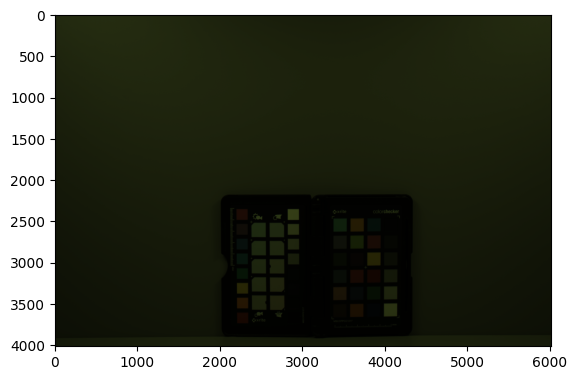

In [88]:
file_raw_0017 = ["data", "NikonD5600", "JN", "A", "INDIGO_2022-06-19_NikonD5600_0017.NEF"]
path_raw_0017 = os.path.join(*file_raw_0017)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "XRCCPP", "Illuminant": JNA, "Observer":2}
image_0017 = RawImage(path_raw_0017, metadata, method="postprocess")

image_0017.show(method="matplotlib")

RAW RGB data extraction

In [89]:
has_colourchecker, corners, size_rect = image_0017.automatic_colourchecker_extraction(checker_name="XRCCPP_24", opencv_descriptor="SIFT")

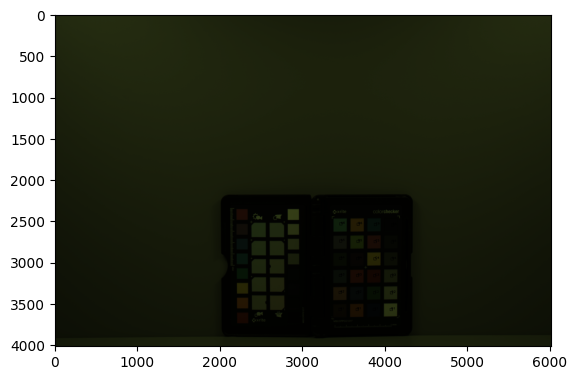

In [90]:
image_0017.show_colourchecker(checker_name="XRCCPP", show_image=True, method="matplotlib")

In [91]:
XRCCPP_RGB_JNA = image_0017.get_ColourCheckerRGB("XRCCPP").as_pandas_dataframe()

In [92]:
data_xrccpp_jna = pd.merge(XRCCPP_XYZ_JNA, XRCCPP_RGB_JNA, on="patch_id")
data_xrccpp_jna.insert(0, "ColourChecker", "XRCCPP")
data_xrccpp_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant JN-A.,15.372919,11.711211,2.090311,MeasuredIlluminant object: Illuminant JN-A.,483.880000,391.422222,117.955556
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant JN-A.,49.723613,36.782895,7.288411,MeasuredIlluminant object: Illuminant JN-A.,1618.052222,1228.268889,416.534444
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant JN-A.,16.373390,15.847484,8.831574,MeasuredIlluminant object: Illuminant JN-A.,535.651111,810.151111,439.655556
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant JN-A.,12.602236,12.631750,2.168357,MeasuredIlluminant object: Illuminant JN-A.,425.380000,594.646667,161.075556
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant JN-A.,24.343027,20.619540,10.960965,MeasuredIlluminant object: Illuminant JN-A.,936.693333,1077.498889,586.891111
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant JN-A.,31.156441,37.005330,13.403265,MeasuredIlluminant object: Illuminant JN-A.,977.247778,2015.965556,829.681111
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant JN-A.,53.213909,36.259270,2.067765,MeasuredIlluminant object: Illuminant JN-A.,1710.000000,998.066667,164.177778
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant JN-A.,11.569335,10.456881,10.649476,MeasuredIlluminant object: Illuminant JN-A.,333.231111,526.342222,418.406667
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant JN-A.,41.201943,24.089264,3.763710,MeasuredIlluminant object: Illuminant JN-A.,1488.120000,622.804444,199.062222
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant JN-A.,10.659306,7.084761,3.846497,MeasuredIlluminant object: Illuminant JN-A.,396.708889,297.795556,177.837778


In [93]:
data_jna.append(data_xrccpp_jna)

### WPP

White - D1

In [94]:
patch_max = find_patch_max_value(data_xrccpp_jna)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [95]:
data_xrccpp_jna = apply_wpp(data_xrccpp_jna, "D1")
data_xrccpp_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant JN-A.,0.170564,0.145407,0.086972,MeasuredIlluminant object: Illuminant JN-A.,0.179614,0.122838,0.098026
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant JN-A.,0.551690,0.456699,0.303250,MeasuredIlluminant object: Illuminant JN-A.,0.600612,0.385462,0.346158
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant JN-A.,0.181665,0.196763,0.367456,MeasuredIlluminant object: Illuminant JN-A.,0.198831,0.254246,0.365372
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant JN-A.,0.139823,0.156837,0.090219,MeasuredIlluminant object: Illuminant JN-A.,0.157899,0.186615,0.133861
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant JN-A.,0.270089,0.256014,0.456054,MeasuredIlluminant object: Illuminant JN-A.,0.347695,0.338147,0.487731
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant JN-A.,0.345685,0.459461,0.557671,MeasuredIlluminant object: Illuminant JN-A.,0.362749,0.632661,0.689500
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant JN-A.,0.590415,0.450198,0.086034,MeasuredIlluminant object: Illuminant JN-A.,0.634743,0.313219,0.136439
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant JN-A.,0.128363,0.129833,0.443094,MeasuredIlluminant object: Illuminant JN-A.,0.123694,0.165180,0.347713
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant JN-A.,0.457141,0.299094,0.156597,MeasuredIlluminant object: Illuminant JN-A.,0.552382,0.195452,0.165429
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant JN-A.,0.118266,0.087965,0.160042,MeasuredIlluminant object: Illuminant JN-A.,0.147256,0.093456,0.147791


In [96]:
data_xrccpp_jna.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.350737,0.329255,0.287077,0.397315,0.343701,0.323355
std,0.252852,0.239724,0.236015,0.283415,0.246913,0.229291
min,0.040911,0.041252,0.045024,0.052814,0.053004,0.057711
25%,0.137541,0.153979,0.107312,0.154982,0.156533,0.144953
50%,0.307887,0.253226,0.201477,0.355222,0.276264,0.275286
75%,0.480778,0.457389,0.441408,0.582999,0.492335,0.393772
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [97]:
data_wpp_jna.append(data_xrccpp_jna)

### SCK100

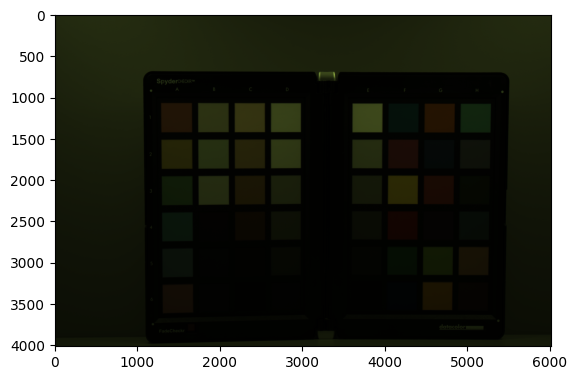

In [98]:
file_raw_0018 = ["data", "NikonD5600", "JN", "A", "INDIGO_2022-06-19_NikonD5600_0018.NEF"]
path_raw_0018 = os.path.join(*file_raw_0018)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "SCK100", "Illuminant": JNA, "Observer":2}
image_0018 = RawImage(path_raw_0018, metadata, method="postprocess")

image_0018.show(method="matplotlib")

RAW RGB data extraction

In [99]:
corners = {"TopLeft":[1149.47,925.65], "TopRight":[5410.12,935.48], "BottomRight":[5351.15,3706.27], "BottomLeft":[1177.22,3747.97]}
image_0018.extract_colourchecker_rgb_patches(checker_name="SCK100_48", corners=corners, size_rect=100)

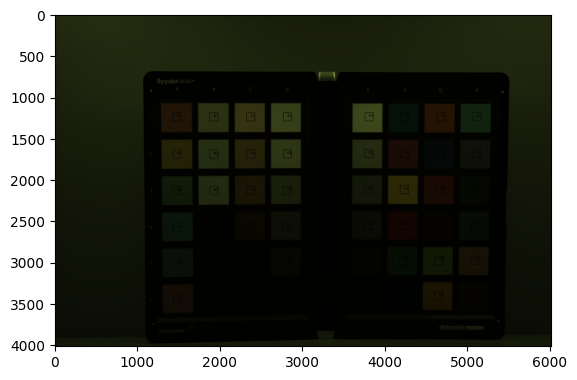

In [100]:
image_0018.show_colourchecker(checker_name="SCK100", show_image=True, method="matplotlib")

In [101]:
SCK100_RGB_JNA = image_0018.get_ColourCheckerRGB("SCK100").as_pandas_dataframe()

In [102]:
data_sck100_jna = pd.merge(SCK100_XYZ_JNA, SCK100_RGB_JNA, on="patch_id")
data_sck100_jna.insert(0, "ColourChecker", "SCK100")
data_sck100_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant JN-A.,48.510841,33.556840,6.006544,MeasuredIlluminant object: Illuminant JN-A.,2071.6412,1320.7948,399.8004
1,SCK100,A2,MeasuredIlluminant object: Illuminant JN-A.,60.715062,51.359243,5.414997,MeasuredIlluminant object: Illuminant JN-A.,2259.3326,2202.9887,463.3043
2,SCK100,A3,MeasuredIlluminant object: Illuminant JN-A.,31.354564,33.893126,7.160301,MeasuredIlluminant object: Illuminant JN-A.,984.4214,1659.6022,511.7802
3,SCK100,A4,MeasuredIlluminant object: Illuminant JN-A.,24.029909,27.105936,14.450336,MeasuredIlluminant object: Illuminant JN-A.,626.3658,1311.1287,695.7460
4,SCK100,A5,MeasuredIlluminant object: Illuminant JN-A.,26.665927,25.751085,15.298386,MeasuredIlluminant object: Illuminant JN-A.,670.1227,1054.8936,610.1140
5,SCK100,A6,MeasuredIlluminant object: Illuminant JN-A.,43.604075,30.409248,9.409799,MeasuredIlluminant object: Illuminant JN-A.,1157.1038,798.2888,341.6980
6,SCK100,B1,MeasuredIlluminant object: Illuminant JN-A.,69.854591,60.779492,18.004242,MeasuredIlluminant object: Illuminant JN-A.,2770.1584,3127.9040,1199.6960
7,SCK100,B2,MeasuredIlluminant object: Illuminant JN-A.,65.096434,59.511451,17.789752,MeasuredIlluminant object: Illuminant JN-A.,2338.5804,2925.1512,1109.0888
8,SCK100,B3,MeasuredIlluminant object: Illuminant JN-A.,67.833549,60.075379,19.468756,MeasuredIlluminant object: Illuminant JN-A.,2254.8497,2669.8619,1077.4875
9,SCK100,B4,MeasuredIlluminant object: Illuminant JN-A.,7.350463,6.030174,1.698663,MeasuredIlluminant object: Illuminant JN-A.,194.5138,184.0646,71.7252


In [103]:
data_jna.append(data_sck100_jna)

### WPP

White - E1

In [104]:
patch_max = find_patch_max_value(data_sck100_jna)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E1', 'E1', 'E1']
['E1', 'E1', 'E1']


In [105]:
data_sck100_jna = apply_wpp(data_sck100_jna, "E1")
data_sck100_jna

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant JN-A.,0.481996,0.374250,0.220258,MeasuredIlluminant object: Illuminant JN-A.,0.535646,0.289403,0.227933
1,SCK100,A2,MeasuredIlluminant object: Illuminant JN-A.,0.603255,0.572795,0.198566,MeasuredIlluminant object: Illuminant JN-A.,0.584176,0.482703,0.264137
2,SCK100,A3,MeasuredIlluminant object: Illuminant JN-A.,0.311534,0.378001,0.262566,MeasuredIlluminant object: Illuminant JN-A.,0.254533,0.363640,0.291774
3,SCK100,A4,MeasuredIlluminant object: Illuminant JN-A.,0.238757,0.302305,0.529889,MeasuredIlluminant object: Illuminant JN-A.,0.161954,0.287285,0.396656
4,SCK100,A5,MeasuredIlluminant object: Illuminant JN-A.,0.264948,0.287195,0.560986,MeasuredIlluminant object: Illuminant JN-A.,0.173268,0.231141,0.347836
5,SCK100,A6,MeasuredIlluminant object: Illuminant JN-A.,0.433243,0.339146,0.345054,MeasuredIlluminant object: Illuminant JN-A.,0.299182,0.174915,0.194808
6,SCK100,B1,MeasuredIlluminant object: Illuminant JN-A.,0.694064,0.677857,0.660209,MeasuredIlluminant object: Illuminant JN-A.,0.716255,0.685363,0.683967
7,SCK100,B2,MeasuredIlluminant object: Illuminant JN-A.,0.646788,0.663715,0.652344,MeasuredIlluminant object: Illuminant JN-A.,0.604666,0.640938,0.632310
8,SCK100,B3,MeasuredIlluminant object: Illuminant JN-A.,0.673983,0.670004,0.713912,MeasuredIlluminant object: Illuminant JN-A.,0.583017,0.585000,0.614294
9,SCK100,B4,MeasuredIlluminant object: Illuminant JN-A.,0.073033,0.067253,0.062289,MeasuredIlluminant object: Illuminant JN-A.,0.050294,0.040331,0.040892


In [106]:
data_sck100_jna.describe()

,X,Y,Z,R,G,B
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,0.365071,0.348679,0.305821,0.321720,0.288891,0.271824
std,0.262602,0.252974,0.248746,0.267418,0.249043,0.244274
min,0.046751,0.046978,0.048461,0.022120,0.022074,0.023088
25%,0.121800,0.137233,0.089993,0.087786,0.093552,0.084242
50%,0.315510,0.285928,0.241412,0.266377,0.235305,0.209835
75%,0.545506,0.517502,0.462242,0.547489,0.433116,0.368901
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [107]:
data_wpp_jna.append(data_sck100_jna)

## Merge data

In [108]:
data_pd_jna = pd.concat(data_jna, ignore_index=True)

data_pd_jna = data_pd_jna.drop(columns="illuminant_y")
data_pd_jna = data_pd_jna.rename(columns={"illuminant_x":"illuminant"})
data_pd_jna["illuminant"] = "JN-A" # as str to avoid error
data_pd_jna

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JN-A,23.260021,13.376909,4.184976,1005.775794,339.353741,180.147676
1,CCDSG,B3,JN-A,46.745364,34.688946,13.982877,1926.222789,1555.256236,779.599773
2,CCDSG,B4,JN-A,17.697077,10.910268,7.296986,598.218112,292.304422,273.289257
3,CCDSG,B5,JN-A,15.405257,17.531298,16.958977,373.286565,1050.386763,849.576531
4,CCDSG,B6,JN-A,22.593956,27.131710,16.412535,603.619615,1531.867063,891.432823
...,...,...,...,...,...,...,...,...,...
187,SCK100,H2,JN-A,27.150398,23.166439,12.468467,936.972600,1107.230600,630.834000
188,SCK100,H3,JN-A,12.453948,12.747416,2.166304,335.022800,502.925200,124.333600
189,SCK100,H4,JN-A,17.472695,17.367002,9.683340,430.373700,711.592500,391.925500
190,SCK100,H5,JN-A,50.199697,37.805369,7.469414,1420.508800,1110.814000,362.946000


In [109]:
data_pd_wpp_jna = pd.concat(data_wpp_jna, ignore_index=True)

data_pd_wpp_jna = data_pd_wpp_jna.drop(columns="illuminant_y")
data_pd_wpp_jna = data_pd_wpp_jna.rename(columns={"illuminant_x":"illuminant"})
data_pd_wpp_jna["illuminant"] = "JN-A" # as str to avoid error
data_pd_wpp_jna

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JN-A,0.228685,0.147222,0.151768,0.274967,0.078430,0.108858
1,CCDSG,B3,JN-A,0.459586,0.381776,0.507088,0.526605,0.359444,0.471089
2,CCDSG,B4,JN-A,0.173992,0.120075,0.264624,0.163545,0.067556,0.165141
3,CCDSG,B5,JN-A,0.151460,0.192944,0.615016,0.102052,0.242761,0.513374
4,CCDSG,B6,JN-A,0.222137,0.298604,0.595199,0.165022,0.354038,0.538666
...,...,...,...,...,...,...,...,...,...
187,SCK100,H2,JN-A,0.269762,0.258369,0.457214,0.242265,0.242608,0.359649
188,SCK100,H3,JN-A,0.123740,0.142168,0.079438,0.086624,0.110197,0.070885
189,SCK100,H4,JN-A,0.173606,0.193689,0.355085,0.111278,0.155919,0.223443
190,SCK100,H5,JN-A,0.498776,0.421633,0.273901,0.367288,0.243393,0.206922


## JN-F

In [110]:
data_jnf = []
data_wpp_jnf = []

| Image                                 |  Illuminant  | ColourChecker                        | Patches |
|---------------------------------------|--------------|--------------------------------------|---------|
| INDIGO_2022-06-19_NikonD5600_0025.NEF | JNF-3872ºK   | CCDSG  - Calibrite DIGITAL SG        | 96     |
| INDIGO_2022-06-19_NikonD5600_0026.NEF | JNF-3872ºK   | CCC - Calibrite Classic              | 24      |
| INDIGO_2022-06-19_NikonD5600_0029.NEF | JNF-3872ºK   | XRCCPP - X-rite PASSPORT PHOTO       | 24      |
| INDIGO_2022-06-19_NikonD5600_0030.NEF | JNF-3872ºK   | SCK100 - SpyderCHECKR                | 48      |

<img src="res/screenshot/NikonD5600/JNF/INDIGO_2022-06-19_NikonD5600_0025.jpg" width="500">
<img src="res/screenshot/NikonD5600/JNF/INDIGO_2022-06-19_NikonD5600_0026.jpg" width="500">
<img src="res/screenshot/NikonD5600/JNF/INDIGO_2022-06-19_NikonD5600_0029.jpg" width="500">
<img src="res/screenshot/NikonD5600/JNF/INDIGO_2022-06-19_NikonD5600_0030.jpg" width="500">

## SPD Illuminant

JNF

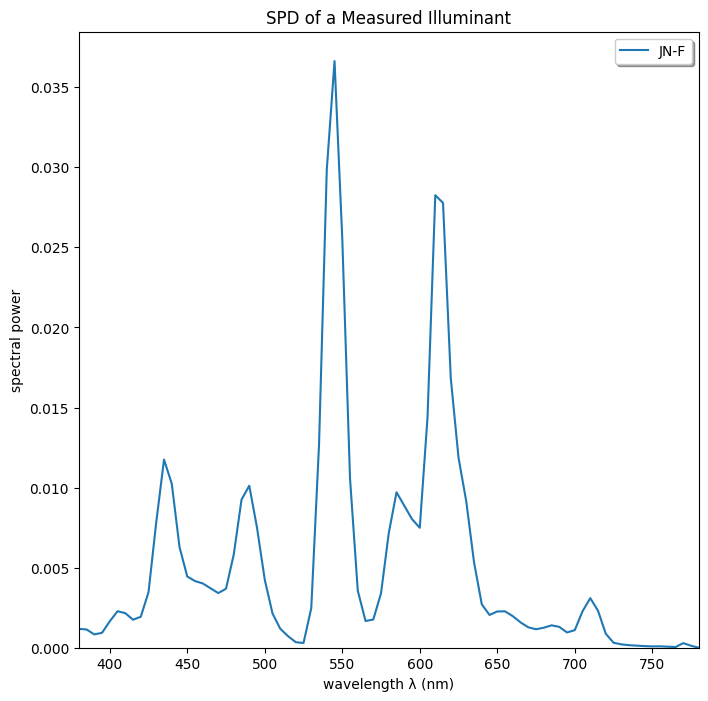

In [111]:
file_spd = ["res", "spd", "SPD_JNF_016_02°_3872K.csv"]
path_spd = os.path.join(*file_spd)

JNF = MeasuredIlluminant(illuminant_name="JN-F", path_file=path_spd)

JNF.plot()

XYZ data (under JNF)

In [112]:
CCDSG_XYZ_JNF = CCDSG.to_ColourCheckerXYZ(illuminant=JNF, observer=2).as_pandas_dataframe()

In [113]:
CCC_XYZ_JNF = CCC.to_ColourCheckerXYZ(illuminant=JNF, observer=2).as_pandas_dataframe()

In [114]:
XRCCPP_XYZ_JNF = XRCCPP.to_ColourCheckerXYZ(illuminant=JNF, observer=2).as_pandas_dataframe()

In [115]:
SCK100_XYZ_JNF = SCK100.to_ColourCheckerXYZ(illuminant=JNF, observer=2).as_pandas_dataframe()

## RawImage

### CCDSG

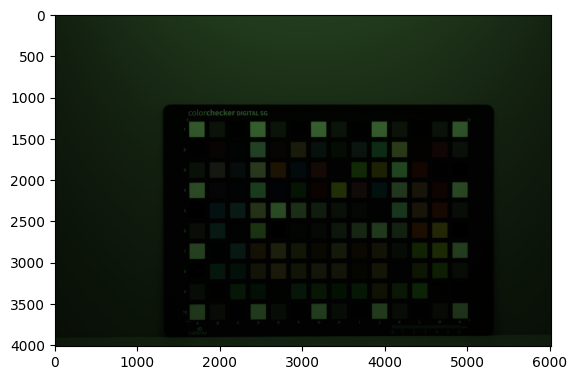

In [116]:
file_raw_0025 = ["data", "NikonD5600", "JN", "F", "INDIGO_2022-06-19_NikonD5600_0025.NEF"]
path_raw_0025 = os.path.join(*file_raw_0025)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCDSG", "Illuminant": JNF, "Observer":2}
image_0025 = RawImage(path_raw_0025, metadata, method="postprocess")

image_0025.show(method="matplotlib")

RAW RGB data extraction

In [117]:
has_colourchecker, corners, size_rect = image_0025.automatic_colourchecker_extraction(checker_name="CCDSG", opencv_descriptor="SIFT") 

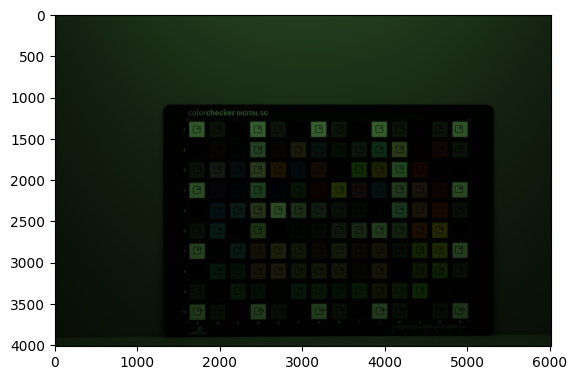

In [118]:
image_0025.show_colourchecker(checker_name="CCDSG", show_image=True, method="matplotlib")

In [119]:
CCDSG_RGB_JNF = image_0025.get_ColourCheckerRGB("CCDSG").as_pandas_dataframe()

In [120]:
data_ccdsg_jnf = pd.merge(CCDSG_XYZ_JNF, CCDSG_RGB_JNF, on="patch_id")
data_ccdsg_jnf.insert(0, "ColourChecker", "CCDSG")
data_ccdsg_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCDSG,A1,MeasuredIlluminant object: Illuminant JN-F.,90.405962,90.851130,50.932877,MeasuredIlluminant object: Illuminant JN-F.,3210.920635,5597.828231,2731.210034
1,CCDSG,A2,MeasuredIlluminant object: Illuminant JN-F.,4.392605,4.390425,2.526085,MeasuredIlluminant object: Illuminant JN-F.,43.546769,67.717404,32.916667
2,CCDSG,A3,MeasuredIlluminant object: Illuminant JN-F.,22.011162,22.081217,12.558128,MeasuredIlluminant object: Illuminant JN-F.,628.112812,1085.330499,530.513605
3,CCDSG,A4,MeasuredIlluminant object: Illuminant JN-F.,89.346638,89.781511,50.438551,MeasuredIlluminant object: Illuminant JN-F.,2756.340136,4798.176304,2339.585034
4,CCDSG,A5,MeasuredIlluminant object: Illuminant JN-F.,4.376361,4.375718,2.520216,MeasuredIlluminant object: Illuminant JN-F.,35.333333,55.263039,27.492347
...,...,...,...,...,...,...,...,...,...,...
135,CCDSG,N6,MeasuredIlluminant object: Illuminant JN-F.,4.373095,4.372314,2.518194,MeasuredIlluminant object: Illuminant JN-F.,35.958900,54.775510,26.597789
136,CCDSG,N7,MeasuredIlluminant object: Illuminant JN-F.,89.827862,90.268980,50.688335,MeasuredIlluminant object: Illuminant JN-F.,2273.738095,3929.384921,1916.197279
137,CCDSG,N8,MeasuredIlluminant object: Illuminant JN-F.,22.074814,22.143073,12.572834,MeasuredIlluminant object: Illuminant JN-F.,476.093254,814.111395,396.769558
138,CCDSG,N9,MeasuredIlluminant object: Illuminant JN-F.,4.346654,4.345109,2.495620,MeasuredIlluminant object: Illuminant JN-F.,41.786281,66.225340,33.205499


In [121]:
data_ccdsg_jnf = data_ccdsg_jnf[(data_ccdsg_jnf["patch_id"].str.contains("1")==False) & (data_ccdsg_jnf["patch_id"].str.contains("0")==False) & (data_ccdsg_jnf["patch_id"].str.contains("0")==False) & (data_ccdsg_jnf["patch_id"].str.contains("A")==False) & (data_ccdsg_jnf["patch_id"].str.contains("N")==False)]
data_ccdsg_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant JN-F.,18.238851,11.534710,8.761602,MeasuredIlluminant object: Illuminant JN-F.,624.411565,315.319728,284.451247
12,CCDSG,B3,MeasuredIlluminant object: Illuminant JN-F.,40.824910,32.673690,27.155959,MeasuredIlluminant object: Illuminant JN-F.,1364.276644,1585.060658,1138.099206
13,CCDSG,B4,MeasuredIlluminant object: Illuminant JN-F.,15.002010,9.609032,15.593407,MeasuredIlluminant object: Illuminant JN-F.,378.002409,295.098498,468.921910
14,CCDSG,B5,MeasuredIlluminant object: Illuminant JN-F.,16.739652,18.639093,31.067010,MeasuredIlluminant object: Illuminant JN-F.,287.357993,1139.352041,1192.448413
15,CCDSG,B6,MeasuredIlluminant object: Illuminant JN-F.,23.320175,29.281772,29.479853,MeasuredIlluminant object: Illuminant JN-F.,461.303288,1664.448413,1186.527778
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant JN-F.,44.489951,26.075728,4.328641,MeasuredIlluminant object: Illuminant JN-F.,1573.507086,546.067177,137.939626
125,CCDSG,M6,MeasuredIlluminant object: Illuminant JN-F.,73.580478,66.657777,5.771355,MeasuredIlluminant object: Illuminant JN-F.,2262.280612,2558.521542,367.347506
126,CCDSG,M7,MeasuredIlluminant object: Illuminant JN-F.,66.432905,67.782065,4.493068,MeasuredIlluminant object: Illuminant JN-F.,1861.595238,2672.309524,322.962018
127,CCDSG,M8,MeasuredIlluminant object: Illuminant JN-F.,40.174828,48.710705,4.662325,MeasuredIlluminant object: Illuminant JN-F.,946.013039,1978.561791,283.291950


In [122]:
data_jnf.append(data_ccdsg_jnf)

### WPP

White - E5

In [123]:
patch_max = find_patch_max_value(data_ccdsg_jnf)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E5', 'E5', 'E5']
['E5', 'E5', 'E5']


In [124]:
data_ccdsg_jnf = apply_wpp(data_ccdsg_jnf, "E5")
data_ccdsg_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant JN-F.,0.201619,0.126893,0.172111,MeasuredIlluminant object: Illuminant JN-F.,0.225969,0.065665,0.121413
12,CCDSG,B3,MeasuredIlluminant object: Illuminant JN-F.,0.451294,0.359442,0.533446,MeasuredIlluminant object: Illuminant JN-F.,0.493721,0.330089,0.485779
13,CCDSG,B4,MeasuredIlluminant object: Illuminant JN-F.,0.165838,0.105709,0.306314,MeasuredIlluminant object: Illuminant JN-F.,0.136796,0.061454,0.200151
14,CCDSG,B5,MeasuredIlluminant object: Illuminant JN-F.,0.185047,0.205048,0.610274,MeasuredIlluminant object: Illuminant JN-F.,0.103993,0.237270,0.508977
15,CCDSG,B6,MeasuredIlluminant object: Illuminant JN-F.,0.257790,0.322128,0.579096,MeasuredIlluminant object: Illuminant JN-F.,0.166942,0.346622,0.506450
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant JN-F.,0.491809,0.286858,0.085031,MeasuredIlluminant object: Illuminant JN-F.,0.569439,0.113719,0.058877
125,CCDSG,M6,MeasuredIlluminant object: Illuminant JN-F.,0.813387,0.733300,0.113371,MeasuredIlluminant object: Illuminant JN-F.,0.818701,0.532813,0.156796
126,CCDSG,M7,MeasuredIlluminant object: Illuminant JN-F.,0.734375,0.745668,0.088261,MeasuredIlluminant object: Illuminant JN-F.,0.673696,0.556509,0.137851
127,CCDSG,M8,MeasuredIlluminant object: Illuminant JN-F.,0.444108,0.535865,0.091586,MeasuredIlluminant object: Illuminant JN-F.,0.342354,0.412036,0.120918


In [125]:
data_ccdsg_jnf.describe()

,X,Y,Z,R,G,B
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000
mean,0.365279,0.349731,0.284511,0.351026,0.300263,0.267091
std,0.231978,0.226871,0.234701,0.261385,0.236424,0.241131
min,0.048256,0.048011,0.049363,0.013860,0.012246,0.012183
25%,0.164223,0.157954,0.095416,0.127807,0.107401,0.093498
50%,0.337382,0.330846,0.211330,0.314618,0.271278,0.190556
75%,0.496674,0.457521,0.408346,0.528049,0.390946,0.362302
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [126]:
data_wpp_jnf.append(data_ccdsg_jnf)

### CCC

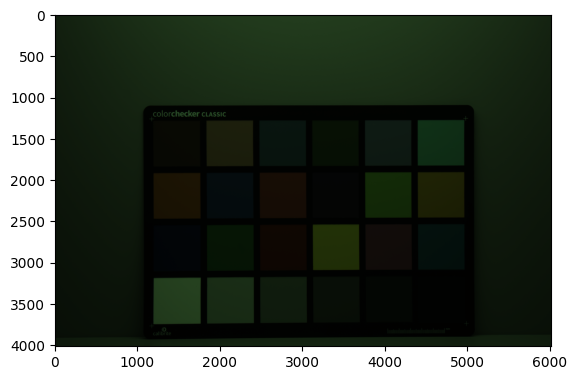

In [127]:
file_raw_0026 = ["data", "NikonD5600", "JN", "F", "INDIGO_2022-06-19_NikonD5600_0026.NEF"]
path_raw_0026 = os.path.join(*file_raw_0026)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCC", "Illuminant": JNF, "Observer":2}
image_0026 = RawImage(path_raw_0026, metadata, method="postprocess")

image_0026.show(method="matplotlib")

RAW RGB data extraction

In [128]:
corners = {"TopLeft":[1159.51,1261.99], "TopRight":[4968.58,1254.68], "BottomRight":[4974.42,3736.81], "BottomLeft":[1165.69,3768.21]}
image_0026.extract_colourchecker_rgb_patches(checker_name="CCC", corners=corners, size_rect=100)

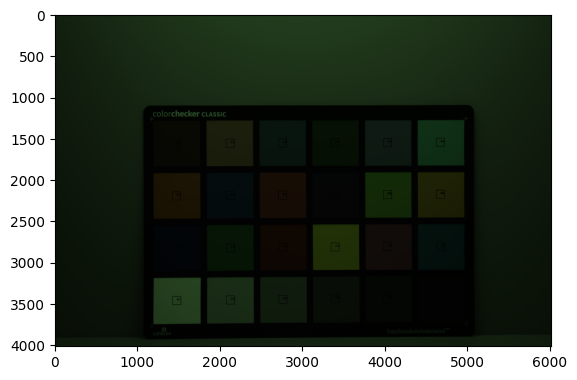

In [129]:
image_0026.show_colourchecker(checker_name="CCC", show_image=True, method="matplotlib")

In [130]:
CCC_RGB_JNF = image_0026.get_ColourCheckerRGB("CCC").as_pandas_dataframe()

In [131]:
data_ccc_jnf = pd.merge(CCC_XYZ_JNF, CCC_RGB_JNF, on="patch_id")
data_ccc_jnf.insert(0, "ColourChecker", "CCC")
data_ccc_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant JN-F.,13.366150,11.277974,3.858691,MeasuredIlluminant object: Illuminant JN-F.,524.8747,578.7366,222.7360
1,CCC,A2,MeasuredIlluminant object: Illuminant JN-F.,43.419882,36.390277,13.400728,MeasuredIlluminant object: Illuminant JN-F.,1753.8636,1913.2876,784.8508
2,CCC,A3,MeasuredIlluminant object: Illuminant JN-F.,17.688268,18.492317,18.798833,MeasuredIlluminant object: Illuminant JN-F.,561.6572,1301.6864,939.8044
3,CCC,A4,MeasuredIlluminant object: Illuminant JN-F.,12.307527,15.020879,3.838052,MeasuredIlluminant object: Illuminant JN-F.,451.0732,1021.5756,291.1668
4,CCC,A5,MeasuredIlluminant object: Illuminant JN-F.,25.940944,24.050283,24.624515,MeasuredIlluminant object: Illuminant JN-F.,918.4196,1652.4160,1212.3300
5,CCC,A6,MeasuredIlluminant object: Illuminant JN-F.,32.373662,42.348016,24.184870,MeasuredIlluminant object: Illuminant JN-F.,982.2968,2929.5476,1385.3968
6,CCC,B1,MeasuredIlluminant object: Illuminant JN-F.,45.671563,33.741487,3.578359,MeasuredIlluminant object: Illuminant JN-F.,1695.9326,1232.7752,248.0512
7,CCC,B2,MeasuredIlluminant object: Illuminant JN-F.,11.982290,10.739880,21.783312,MeasuredIlluminant object: Illuminant JN-F.,318.3940,771.3350,879.8648
8,CCC,B3,MeasuredIlluminant object: Illuminant JN-F.,35.654258,22.661263,7.465272,MeasuredIlluminant object: Illuminant JN-F.,1426.3520,831.0732,362.5404
9,CCC,B4,MeasuredIlluminant object: Illuminant JN-F.,8.812877,6.650981,8.259123,MeasuredIlluminant object: Illuminant JN-F.,280.9360,349.1748,311.5320


In [132]:
data_jnf.append(data_ccc_jnf)

### WPP

White - D1

In [133]:
patch_max = find_patch_max_value(data_ccc_jnf)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [134]:
data_ccc_jnf = apply_wpp(data_ccc_jnf, "D1")
data_ccc_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant JN-F.,0.145809,0.122390,0.074891,MeasuredIlluminant object: Illuminant JN-F.,0.230104,0.146508,0.115968
1,CCC,A2,MeasuredIlluminant object: Illuminant JN-F.,0.473661,0.394912,0.260087,MeasuredIlluminant object: Illuminant JN-F.,0.768891,0.484350,0.408635
2,CCC,A3,MeasuredIlluminant object: Illuminant JN-F.,0.192959,0.200681,0.364855,MeasuredIlluminant object: Illuminant JN-F.,0.246230,0.329523,0.489312
3,CCC,A4,MeasuredIlluminant object: Illuminant JN-F.,0.134261,0.163009,0.074490,MeasuredIlluminant object: Illuminant JN-F.,0.197750,0.258613,0.151597
4,CCC,A5,MeasuredIlluminant object: Illuminant JN-F.,0.282986,0.260997,0.477922,MeasuredIlluminant object: Illuminant JN-F.,0.402634,0.418311,0.631203
5,CCC,A6,MeasuredIlluminant object: Illuminant JN-F.,0.353160,0.459566,0.469390,MeasuredIlluminant object: Illuminant JN-F.,0.430637,0.741618,0.721311
6,CCC,B1,MeasuredIlluminant object: Illuminant JN-F.,0.498225,0.366167,0.069450,MeasuredIlluminant object: Illuminant JN-F.,0.743494,0.312078,0.129149
7,CCC,B2,MeasuredIlluminant object: Illuminant JN-F.,0.130713,0.116551,0.422779,MeasuredIlluminant object: Illuminant JN-F.,0.139583,0.195264,0.458104
8,CCC,B3,MeasuredIlluminant object: Illuminant JN-F.,0.388947,0.245923,0.144889,MeasuredIlluminant object: Illuminant JN-F.,0.625311,0.210387,0.188758
9,CCC,B4,MeasuredIlluminant object: Illuminant JN-F.,0.096138,0.072177,0.160296,MeasuredIlluminant object: Illuminant JN-F.,0.123162,0.088394,0.162200


In [135]:
data_ccc_jnf.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.329483,0.313731,0.271290,0.413535,0.361308,0.331108
std,0.238523,0.238307,0.233182,0.291212,0.256944,0.242000
min,0.036985,0.036965,0.038881,0.040306,0.039579,0.041886
25%,0.142922,0.152854,0.093760,0.165200,0.183075,0.159549
50%,0.282465,0.241260,0.192663,0.406352,0.286500,0.247296
75%,0.432075,0.422870,0.409853,0.643442,0.494999,0.455391
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [136]:
data_wpp_jnf.append(data_ccc_jnf)

### XRCCPP

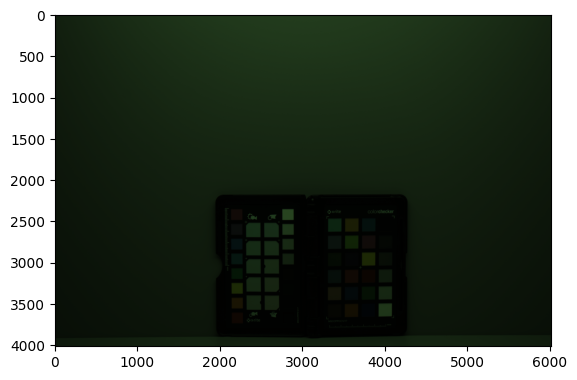

In [137]:
file_raw_0029 = ["data", "NikonD5600", "JN", "F", "INDIGO_2022-06-19_NikonD5600_0029.NEF"]
path_raw_0029 = os.path.join(*file_raw_0029)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "XRCCPP", "Illuminant": JNF, "Observer":2}
image_0029 = RawImage(path_raw_0029, metadata, method="postprocess")

image_0029.show(method="matplotlib")

RAW RGB data extraction

In [138]:
has_colourchecker, corners, size_rect = image_0029.automatic_colourchecker_extraction(checker_name="XRCCPP_24", opencv_descriptor="SIFT")

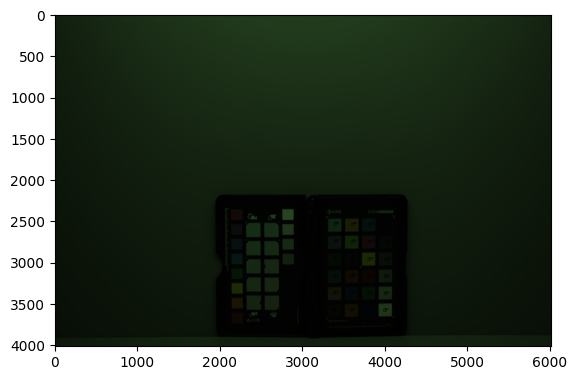

In [139]:
image_0029.show_colourchecker(checker_name="XRCCPP", show_image=True, method="matplotlib")

In [140]:
XRCCPP_RGB_JNF = image_0029.get_ColourCheckerRGB("XRCCPP").as_pandas_dataframe()

In [141]:
data_xrccpp_jnf = pd.merge(XRCCPP_XYZ_JNF, XRCCPP_RGB_JNF, on="patch_id")
data_xrccpp_jnf.insert(0, "ColourChecker", "XRCCPP")
data_xrccpp_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant JN-F.,12.764946,10.867451,3.786364,MeasuredIlluminant object: Illuminant JN-F.,351.337778,398.248889,154.535556
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant JN-F.,41.486920,34.316215,12.468572,MeasuredIlluminant object: Illuminant JN-F.,1165.711111,1239.395556,519.857778
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant JN-F.,15.682679,16.363606,16.556943,MeasuredIlluminant object: Illuminant JN-F.,408.180000,914.022222,644.928889
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant JN-F.,11.267880,13.657336,3.660514,MeasuredIlluminant object: Illuminant JN-F.,319.320000,707.215556,207.611111
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant JN-F.,22.143760,20.627590,21.086036,MeasuredIlluminant object: Illuminant JN-F.,684.017778,1216.666667,888.584444
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant JN-F.,30.317126,40.069187,23.146456,MeasuredIlluminant object: Illuminant JN-F.,787.375556,2352.100000,1124.764444
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant JN-F.,42.652555,31.733974,3.472690,MeasuredIlluminant object: Illuminant JN-F.,1237.631111,920.440000,187.995556
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant JN-F.,11.690263,10.540233,20.709061,MeasuredIlluminant object: Illuminant JN-F.,250.008889,590.564444,657.973333
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant JN-F.,34.041759,21.601191,7.171931,MeasuredIlluminant object: Illuminant JN-F.,1069.304444,602.124444,263.897778
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant JN-F.,8.229535,6.351745,7.835616,MeasuredIlluminant object: Illuminant JN-F.,241.815556,321.942222,276.124444


In [142]:
data_jnf.append(data_xrccpp_jnf)

### WPP

White - D1

In [143]:
patch_max = find_patch_max_value(data_xrccpp_jnf)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [144]:
data_xrccpp_jnf = apply_wpp(data_xrccpp_jnf, "D1")
data_xrccpp_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant JN-F.,0.159430,0.134864,0.085583,MeasuredIlluminant object: Illuminant JN-F.,0.174950,0.114954,0.092746
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant JN-F.,0.518158,0.425861,0.281827,MeasuredIlluminant object: Illuminant JN-F.,0.580472,0.357749,0.311997
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant JN-F.,0.195871,0.203071,0.374237,MeasuredIlluminant object: Illuminant JN-F.,0.203255,0.263830,0.387060
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant JN-F.,0.140732,0.169486,0.082739,MeasuredIlluminant object: Illuminant JN-F.,0.159007,0.204136,0.124600
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant JN-F.,0.276568,0.255986,0.476608,MeasuredIlluminant object: Illuminant JN-F.,0.340610,0.351188,0.533291
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant JN-F.,0.378651,0.497255,0.523180,MeasuredIlluminant object: Illuminant JN-F.,0.392078,0.678928,0.675037
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant JN-F.,0.532716,0.393816,0.078493,MeasuredIlluminant object: Illuminant JN-F.,0.616285,0.265683,0.112827
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant JN-F.,0.146007,0.130803,0.468087,MeasuredIlluminant object: Illuminant JN-F.,0.124493,0.170465,0.394888
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant JN-F.,0.425170,0.268069,0.162107,MeasuredIlluminant object: Illuminant JN-F.,0.532466,0.173802,0.158380
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant JN-F.,0.102784,0.078825,0.177109,MeasuredIlluminant object: Illuminant JN-F.,0.120413,0.092928,0.165718


In [145]:
data_xrccpp_jnf.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.342073,0.324872,0.284863,0.390829,0.344614,0.319434
std,0.241527,0.239874,0.238656,0.279754,0.253530,0.235084
min,0.041333,0.041391,0.045586,0.052722,0.052732,0.057270
25%,0.155623,0.160831,0.099672,0.151798,0.160807,0.153254
50%,0.285780,0.250181,0.210851,0.358490,0.264757,0.260355
75%,0.451821,0.443709,0.440044,0.544467,0.491005,0.416278
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [146]:
data_wpp_jnf.append(data_xrccpp_jnf)

### SCK100

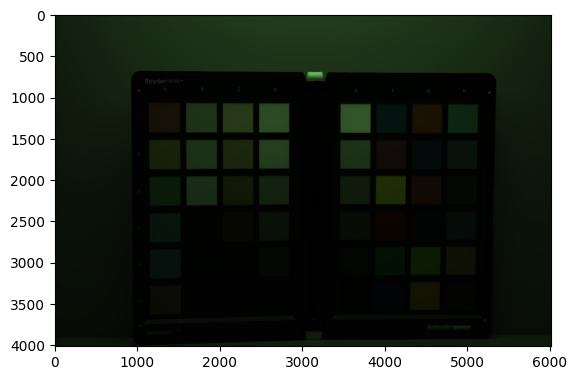

In [147]:
file_raw_0030 = ["data", "NikonD5600", "JN", "F", "INDIGO_2022-06-19_NikonD5600_0030.NEF"]
path_raw_0030 = os.path.join(*file_raw_0030)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "SCK100", "Illuminant": JNF, "Observer":2}
image_0030 = RawImage(path_raw_0030, metadata, method="postprocess")

image_0030.show(method="matplotlib")

RAW RGB data extraction

In [148]:
has_colourchecker, corners, size_rect = image_0030.automatic_colourchecker_extraction(checker_name="SCK100_48", opencv_descriptor="SIFT")

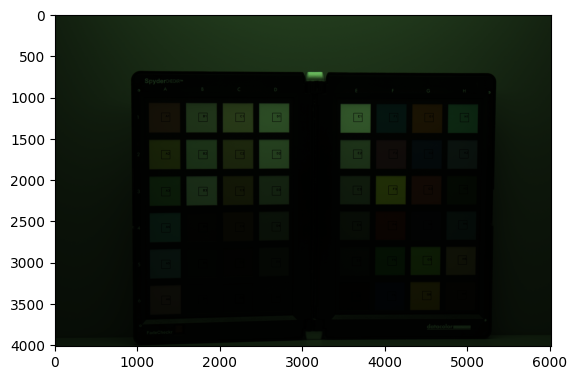

In [149]:
image_0030.show_colourchecker(checker_name="SCK100", show_image=True, method="matplotlib")

In [150]:
SCK100_RGB_JNF = image_0030.get_ColourCheckerRGB("SCK100").as_pandas_dataframe()

In [151]:
data_sck100_jnf = pd.merge(SCK100_XYZ_JNF, SCK100_RGB_JNF, on="patch_id")
data_sck100_jnf.insert(0, "ColourChecker", "SCK100")
data_sck100_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant JN-F.,39.462233,29.330815,11.321207,MeasuredIlluminant object: Illuminant JN-F.,1344.134985,1108.772374,483.382951
1,SCK100,A2,MeasuredIlluminant object: Illuminant JN-F.,50.979149,50.401801,8.999718,MeasuredIlluminant object: Illuminant JN-F.,1518.123891,2156.248891,510.316753
2,SCK100,A3,MeasuredIlluminant object: Illuminant JN-F.,28.402862,35.722117,11.842981,MeasuredIlluminant object: Illuminant JN-F.,678.852626,1674.354382,564.465052
3,SCK100,A4,MeasuredIlluminant object: Illuminant JN-F.,24.084593,29.247884,26.042522,MeasuredIlluminant object: Illuminant JN-F.,451.188979,1357.437870,869.867234
4,SCK100,A5,MeasuredIlluminant object: Illuminant JN-F.,26.066576,26.953864,29.163853,MeasuredIlluminant object: Illuminant JN-F.,470.871672,1091.294009,814.043269
5,SCK100,A6,MeasuredIlluminant object: Illuminant JN-F.,37.893419,28.629906,18.538871,MeasuredIlluminant object: Illuminant JN-F.,784.609190,762.146542,456.782637
6,SCK100,B1,MeasuredIlluminant object: Illuminant JN-F.,61.465789,60.091343,33.260494,MeasuredIlluminant object: Illuminant JN-F.,1997.421875,3278.855030,1608.492419
7,SCK100,B2,MeasuredIlluminant object: Illuminant JN-F.,58.145123,59.917817,32.495919,MeasuredIlluminant object: Illuminant JN-F.,1710.988905,3108.454512,1474.086908
8,SCK100,B3,MeasuredIlluminant object: Illuminant JN-F.,60.111571,59.835161,36.158582,MeasuredIlluminant object: Illuminant JN-F.,1614.253698,2798.917899,1447.070266
9,SCK100,B4,MeasuredIlluminant object: Illuminant JN-F.,6.417495,5.948570,3.146335,MeasuredIlluminant object: Illuminant JN-F.,140.339127,194.828310,95.868805


In [152]:
data_jnf.append(data_sck100_jnf)

### WPP

White - E1

In [153]:
patch_max = find_patch_max_value(data_sck100_jnf)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E1', 'E1', 'E1']
['E1', 'E1', 'E1']


In [154]:
data_sck100_jnf = apply_wpp(data_sck100_jnf, "E1")
data_sck100_jnf

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant JN-F.,0.441135,0.327241,0.224668,MeasuredIlluminant object: Illuminant JN-F.,0.426377,0.203312,0.181350
1,SCK100,A2,MeasuredIlluminant object: Illuminant JN-F.,0.569879,0.562329,0.178598,MeasuredIlluminant object: Illuminant JN-F.,0.481568,0.395384,0.191455
2,SCK100,A3,MeasuredIlluminant object: Illuminant JN-F.,0.317506,0.398549,0.235022,MeasuredIlluminant object: Illuminant JN-F.,0.215341,0.307021,0.211770
3,SCK100,A4,MeasuredIlluminant object: Illuminant JN-F.,0.269234,0.326316,0.516810,MeasuredIlluminant object: Illuminant JN-F.,0.143123,0.248909,0.326347
4,SCK100,A5,MeasuredIlluminant object: Illuminant JN-F.,0.291389,0.300722,0.578753,MeasuredIlluminant object: Illuminant JN-F.,0.149367,0.200107,0.305403
5,SCK100,A6,MeasuredIlluminant object: Illuminant JN-F.,0.423598,0.319421,0.367901,MeasuredIlluminant object: Illuminant JN-F.,0.248888,0.139752,0.171370
6,SCK100,B1,MeasuredIlluminant object: Illuminant JN-F.,0.687105,0.670434,0.660050,MeasuredIlluminant object: Illuminant JN-F.,0.633608,0.601233,0.603456
7,SCK100,B2,MeasuredIlluminant object: Illuminant JN-F.,0.649985,0.668498,0.644877,MeasuredIlluminant object: Illuminant JN-F.,0.542748,0.569987,0.553031
8,SCK100,B3,MeasuredIlluminant object: Illuminant JN-F.,0.671967,0.667576,0.717562,MeasuredIlluminant object: Illuminant JN-F.,0.512062,0.513228,0.542895
9,SCK100,B4,MeasuredIlluminant object: Illuminant JN-F.,0.071739,0.066368,0.062439,MeasuredIlluminant object: Illuminant JN-F.,0.044517,0.035725,0.035967


In [155]:
data_sck100_jnf.describe()

,X,Y,Z,R,G,B
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,0.357326,0.345409,0.303549,0.289752,0.262332,0.243962
std,0.254602,0.252554,0.250023,0.252075,0.238851,0.233926
min,0.046860,0.047060,0.048593,0.021231,0.020728,0.021588
25%,0.132112,0.142082,0.082986,0.079027,0.082187,0.069732
50%,0.304448,0.292873,0.229845,0.218469,0.199956,0.168380
75%,0.521325,0.511179,0.450065,0.440175,0.391674,0.326479
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [156]:
data_wpp_jnf.append(data_sck100_jnf)

## Merge data

In [157]:
data_pd_jnf = pd.concat(data_jnf, ignore_index=True)

data_pd_jnf = data_pd_jnf.drop(columns="illuminant_y")
data_pd_jnf = data_pd_jnf.rename(columns={"illuminant_x":"illuminant"})
data_pd_jnf["illuminant"] = "JN-F" # as str to avoid error
data_pd_jnf

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JN-F,18.238851,11.534710,8.761602,624.411565,315.319728,284.451247
1,CCDSG,B3,JN-F,40.824910,32.673690,27.155959,1364.276644,1585.060658,1138.099206
2,CCDSG,B4,JN-F,15.002010,9.609032,15.593407,378.002409,295.098498,468.921910
3,CCDSG,B5,JN-F,16.739652,18.639093,31.067010,287.357993,1139.352041,1192.448413
4,CCDSG,B6,JN-F,23.320175,29.281772,29.479853,461.303288,1664.448413,1186.527778
...,...,...,...,...,...,...,...,...,...
187,SCK100,H2,JN-F,24.607080,22.858686,23.767454,636.708950,1136.961169,871.279216
188,SCK100,H3,JN-F,11.296355,13.911766,3.742177,241.781805,571.485947,148.652737
189,SCK100,H4,JN-F,17.063432,18.013810,18.599898,320.083580,760.505732,550.678994
190,SCK100,H5,JN-F,41.770488,35.684860,13.161311,965.639608,1089.646450,440.840422


In [158]:
data_pd_wpp_jnf = pd.concat(data_wpp_jnf, ignore_index=True)

data_pd_wpp_jnf = data_pd_wpp_jnf.drop(columns="illuminant_y")
data_pd_wpp_jnf = data_pd_wpp_jnf.rename(columns={"illuminant_x":"illuminant"})
data_pd_wpp_jnf["illuminant"] = "JN-F" # as str to avoid error
data_pd_wpp_jnf

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JN-F,0.201619,0.126893,0.172111,0.225969,0.065665,0.121413
1,CCDSG,B3,JN-F,0.451294,0.359442,0.533446,0.493721,0.330089,0.485779
2,CCDSG,B4,JN-F,0.165838,0.105709,0.306314,0.136796,0.061454,0.200151
3,CCDSG,B5,JN-F,0.185047,0.205048,0.610274,0.103993,0.237270,0.508977
4,CCDSG,B6,JN-F,0.257790,0.322128,0.579096,0.166942,0.346622,0.506450
...,...,...,...,...,...,...,...,...,...
187,SCK100,H2,JN-F,0.275074,0.255032,0.471662,0.201972,0.208481,0.326877
188,SCK100,H3,JN-F,0.126278,0.155212,0.074263,0.076696,0.104791,0.055770
189,SCK100,H4,JN-F,0.190746,0.200979,0.369112,0.101535,0.139451,0.206597
190,SCK100,H5,JN-F,0.466938,0.398133,0.261184,0.306313,0.199805,0.165389


## JND50

In [159]:
data_jnd50 = []
data_wpp_jnd50 = []

| Image                                 |  Illuminant  | ColourChecker                        | Patches |
|---------------------------------------|--------------|--------------------------------------|---------|
| INDIGO_2022-06-19_NikonD5600_0038.NEF | JND50-4963ºK | CCDSG  - Calibrite DIGITAL SG        | 96     |
| INDIGO_2022-06-19_NikonD5600_0039.NEF | JND50-4963ºK | CCC - Calibrite Classic              | 24      |
| INDIGO_2022-06-19_NikonD5600_0042.NEF | JND50-4963ºK | XRCCPP - X-rite PASSPORT PHOTO       | 24      |
| INDIGO_2022-06-19_NikonD5600_0043.NEF | JND50-4963ºK | SCK100 - SpyderCHECKR                | 48      |

<img src="res/screenshot/NikonD5600/JND50/INDIGO_2022-06-19_NikonD5600_0038.jpg" width="500">
<img src="res/screenshot/NikonD5600/JND50/INDIGO_2022-06-19_NikonD5600_0039.jpg" width="500">
<img src="res/screenshot/NikonD5600/JND50/INDIGO_2022-06-19_NikonD5600_0042.jpg" width="500">
<img src="res/screenshot/NikonD5600/JND50/INDIGO_2022-06-19_NikonD5600_0043.jpg" width="500">

## SPD Illuminant

JND50

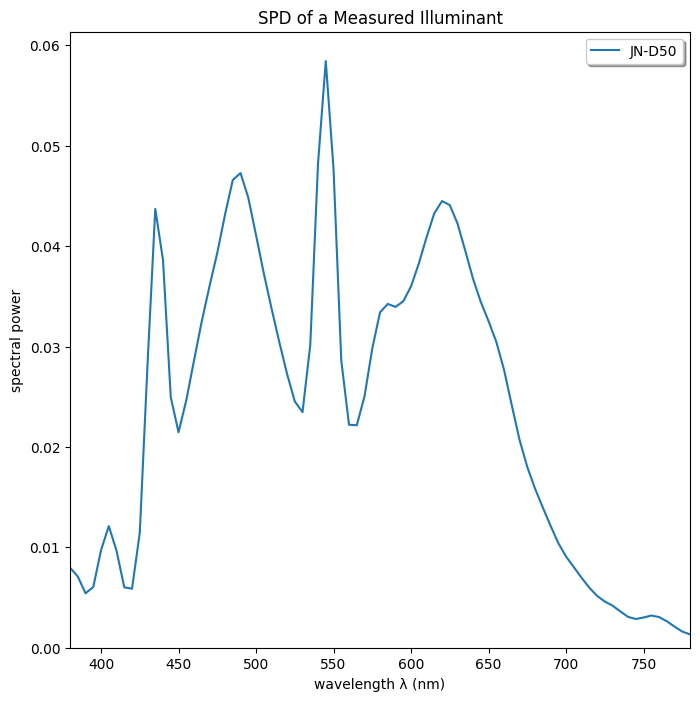

In [160]:
file_spd = ["res", "spd", "SPD_JND50_017_02°_4963K.csv"]
path_spd = os.path.join(*file_spd)

JND50 = MeasuredIlluminant(illuminant_name="JN-D50", path_file=path_spd)

JND50.plot()

XYZ data (under JND50)

In [161]:
CCDSG_XYZ_JND50 = CCDSG.to_ColourCheckerXYZ(illuminant=JND50, observer=2).as_pandas_dataframe()

In [162]:
CCC_XYZ_JND50 = CCC.to_ColourCheckerXYZ(illuminant=JND50, observer=2).as_pandas_dataframe()

In [163]:
XRCCPP_XYZ_JND50 = XRCCPP.to_ColourCheckerXYZ(illuminant=JND50, observer=2).as_pandas_dataframe()

In [164]:
SCK100_XYZ_JND50 = SCK100.to_ColourCheckerXYZ(illuminant=JND50, observer=2).as_pandas_dataframe()

## RawImage

### CCDSG

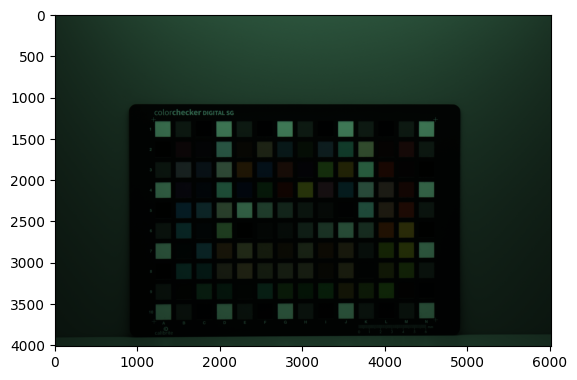

In [165]:
file_raw_0038 = ["data", "NikonD5600", "JN", "D50", "INDIGO_2022-06-19_NikonD5600_0038.NEF"]
path_raw_0038 = os.path.join(*file_raw_0038)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCDSG", "Illuminant": JND50, "Observer":2}
image_0038 = RawImage(path_raw_0038, metadata, method="postprocess")

image_0038.show(method="matplotlib")

RAW RGB data extraction

In [166]:
has_colourchecker, corners, size_rect = image_0038.automatic_colourchecker_extraction(checker_name="CCDSG", opencv_descriptor="SIFT")

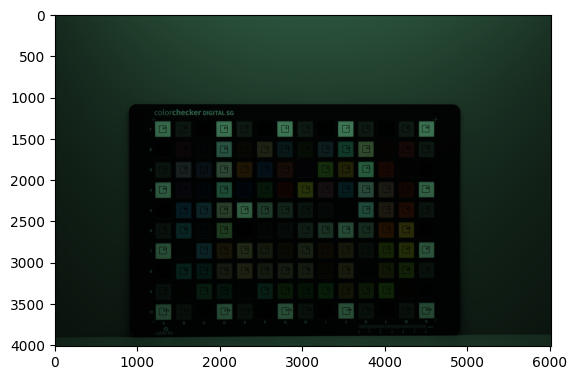

In [167]:
image_0038.show_colourchecker(checker_name="CCDSG", show_image=True, method="matplotlib")

In [168]:
CCDSG_RGB_JND50 = image_0038.get_ColourCheckerRGB("CCDSG").as_pandas_dataframe()

In [169]:
data_ccdsg_jnd50 = pd.merge(CCDSG_XYZ_JND50, CCDSG_RGB_JND50, on="patch_id")
data_ccdsg_jnd50.insert(0, "ColourChecker", "CCDSG")
data_ccdsg_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCDSG,A1,MeasuredIlluminant object: Illuminant JN-D50.,89.859240,90.857587,79.138710,MeasuredIlluminant object: Illuminant JN-D50.,3479.985969,6653.649518,4749.110828
1,CCDSG,A2,MeasuredIlluminant object: Illuminant JN-D50.,4.371440,4.393830,3.907887,MeasuredIlluminant object: Illuminant JN-D50.,46.288549,78.579932,55.534580
2,CCDSG,A3,MeasuredIlluminant object: Illuminant JN-D50.,21.853942,22.075630,19.470628,MeasuredIlluminant object: Illuminant JN-D50.,678.139456,1294.366497,920.481859
3,CCDSG,A4,MeasuredIlluminant object: Illuminant JN-D50.,88.810457,89.798004,78.360603,MeasuredIlluminant object: Illuminant JN-D50.,2996.446712,5721.888605,4083.701247
4,CCDSG,A5,MeasuredIlluminant object: Illuminant JN-D50.,4.355368,4.378975,3.898225,MeasuredIlluminant object: Illuminant JN-D50.,39.265023,67.769841,48.469955
...,...,...,...,...,...,...,...,...,...,...
135,CCDSG,N6,MeasuredIlluminant object: Illuminant JN-D50.,4.351602,4.375823,3.895485,MeasuredIlluminant object: Illuminant JN-D50.,45.391440,75.136338,52.194586
136,CCDSG,N7,MeasuredIlluminant object: Illuminant JN-D50.,89.291912,90.282543,78.750750,MeasuredIlluminant object: Illuminant JN-D50.,2832.205782,5388.847364,3852.170493
137,CCDSG,N8,MeasuredIlluminant object: Illuminant JN-D50.,21.915406,22.135257,19.495474,MeasuredIlluminant object: Illuminant JN-D50.,594.609552,1128.237954,803.300879
138,CCDSG,N9,MeasuredIlluminant object: Illuminant JN-D50.,4.325654,4.348508,3.861480,MeasuredIlluminant object: Illuminant JN-D50.,55.723356,97.908022,70.340986


In [170]:
data_ccdsg_jnd50 = data_ccdsg_jnd50[(data_ccdsg_jnd50["patch_id"].str.contains("1")==False) & (data_ccdsg_jnd50["patch_id"].str.contains("0")==False) & (data_ccdsg_jnd50["patch_id"].str.contains("0")==False) & (data_ccdsg_jnd50["patch_id"].str.contains("A")==False) & (data_ccdsg_jnd50["patch_id"].str.contains("N")==False)]
data_ccdsg_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant JN-D50.,18.410151,11.546970,12.587745,MeasuredIlluminant object: Illuminant JN-D50.,723.645692,414.140448,469.501559
12,CCDSG,B3,MeasuredIlluminant object: Illuminant JN-D50.,40.836037,33.499315,41.062774,MeasuredIlluminant object: Illuminant JN-D50.,1515.942744,2108.683673,2019.792517
13,CCDSG,B4,MeasuredIlluminant object: Illuminant JN-D50.,15.707469,10.120208,22.228786,MeasuredIlluminant object: Illuminant JN-D50.,443.127268,443.202381,770.958900
14,CCDSG,B5,MeasuredIlluminant object: Illuminant JN-D50.,18.458344,21.427231,49.089425,MeasuredIlluminant object: Illuminant JN-D50.,377.456916,1765.837585,2241.211735
15,CCDSG,B6,MeasuredIlluminant object: Illuminant JN-D50.,24.157322,31.693107,46.871468,MeasuredIlluminant object: Illuminant JN-D50.,564.159297,2329.582766,2232.183673
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant JN-D50.,42.456573,24.935584,6.650583,MeasuredIlluminant object: Illuminant JN-D50.,1877.248299,699.882086,263.210884
125,CCDSG,M6,MeasuredIlluminant object: Illuminant JN-D50.,71.015664,61.445421,8.976789,MeasuredIlluminant object: Illuminant JN-D50.,2656.327948,2731.535998,558.427579
126,CCDSG,M7,MeasuredIlluminant object: Illuminant JN-D50.,63.189050,61.503354,6.986728,MeasuredIlluminant object: Illuminant JN-D50.,2201.905612,2845.903628,478.709751
127,CCDSG,M8,MeasuredIlluminant object: Illuminant JN-D50.,37.988685,43.900640,7.512463,MeasuredIlluminant object: Illuminant JN-D50.,1119.831916,2124.100057,456.161565


In [171]:
data_jnd50.append(data_ccdsg_jnd50)

### WPP

White - E5

In [172]:
patch_max = find_patch_max_value(data_ccdsg_jnd50)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E5', 'E5', 'E5']
['E5', 'E5', 'E5']


In [173]:
data_ccdsg_jnd50 = apply_wpp(data_ccdsg_jnd50, "E5")
data_ccdsg_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant JN-D50.,0.204757,0.127027,0.159134,MeasuredIlluminant object: Illuminant JN-D50.,0.229700,0.068873,0.109334
12,CCDSG,B3,MeasuredIlluminant object: Illuminant JN-D50.,0.454177,0.368523,0.519114,MeasuredIlluminant object: Illuminant JN-D50.,0.481192,0.350679,0.470353
13,CCDSG,B4,MeasuredIlluminant object: Illuminant JN-D50.,0.174698,0.111331,0.281015,MeasuredIlluminant object: Illuminant JN-D50.,0.140658,0.073706,0.179535
14,CCDSG,B5,MeasuredIlluminant object: Illuminant JN-D50.,0.205293,0.235719,0.620586,MeasuredIlluminant object: Illuminant JN-D50.,0.119813,0.293663,0.521915
15,CCDSG,B6,MeasuredIlluminant object: Illuminant JN-D50.,0.268677,0.348653,0.592547,MeasuredIlluminant object: Illuminant JN-D50.,0.179076,0.387415,0.519813
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant JN-D50.,0.472200,0.274314,0.084076,MeasuredIlluminant object: Illuminant JN-D50.,0.595878,0.116392,0.061294
125,CCDSG,M6,MeasuredIlluminant object: Illuminant JN-D50.,0.789833,0.675955,0.113484,MeasuredIlluminant object: Illuminant JN-D50.,0.843174,0.454261,0.130042
126,CCDSG,M7,MeasuredIlluminant object: Illuminant JN-D50.,0.702786,0.676593,0.088326,MeasuredIlluminant object: Illuminant JN-D50.,0.698931,0.473281,0.111478
127,CCDSG,M8,MeasuredIlluminant object: Illuminant JN-D50.,0.422509,0.482947,0.094972,MeasuredIlluminant object: Illuminant JN-D50.,0.355458,0.353243,0.106227


In [174]:
data_ccdsg_jnd50.describe()

,X,Y,Z,R,G,B
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000
mean,0.362252,0.345649,0.286519,0.359892,0.301349,0.271329
std,0.228306,0.221045,0.235516,0.263392,0.235829,0.249269
min,0.048319,0.048050,0.049138,0.014136,0.012502,0.012309
25%,0.162460,0.165205,0.099209,0.131178,0.107379,0.090129
50%,0.332814,0.347051,0.211089,0.332873,0.274885,0.182561
75%,0.483151,0.462081,0.408270,0.542719,0.378739,0.371049
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [175]:
data_wpp_jnd50.append(data_ccdsg_jnd50)

### CCC

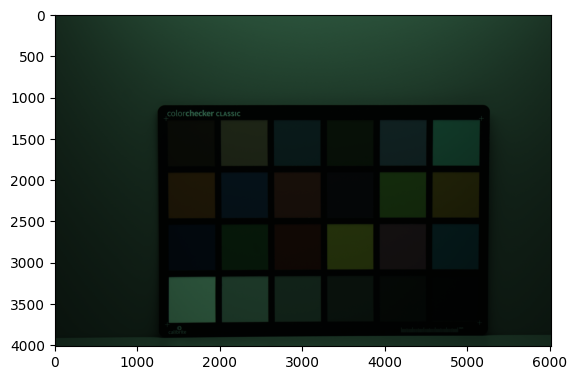

In [176]:
file_raw_0039 = ["data", "NikonD5600", "JN", "D50", "INDIGO_2022-06-19_NikonD5600_0039.NEF"]
path_raw_0039 = os.path.join(*file_raw_0039)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "CCC", "Illuminant": JND50, "Observer":2}
image_0039 = RawImage(path_raw_0039, metadata, method="postprocess")

image_0039.show(method="matplotlib")

RAW RGB data extraction

In [177]:
corners = {"TopLeft":[1339.88,1257.57], "TopRight":[5152.29,1256.65], "BottomRight":[5132.97,3726.93], "BottomLeft":[1348.36,3751.91]}
image_0039.extract_colourchecker_rgb_patches(checker_name="CCC", corners=corners, size_rect=100)

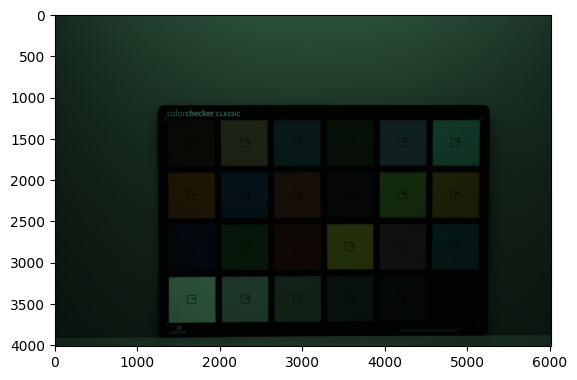

In [178]:
image_0039.show_colourchecker(checker_name="CCC", show_image=True, method="matplotlib")

In [179]:
CCC_RGB_JND50 = image_0039.get_ColourCheckerRGB("CCC").as_pandas_dataframe()

In [180]:
data_ccc_jnd50 = pd.merge(CCC_XYZ_JND50, CCC_RGB_JND50, on="patch_id")
data_ccc_jnd50.insert(0, "ColourChecker", "CCC")
data_ccc_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant JN-D50.,13.098988,11.175758,6.059693,MeasuredIlluminant object: Illuminant JN-D50.,567.4088,684.4784,387.4466
1,CCC,A2,MeasuredIlluminant object: Illuminant JN-D50.,42.073897,36.429469,21.431142,MeasuredIlluminant object: Illuminant JN-D50.,1829.1368,2270.2228,1372.7456
2,CCC,A3,MeasuredIlluminant object: Illuminant JN-D50.,18.279263,19.342328,29.197766,MeasuredIlluminant object: Illuminant JN-D50.,600.7537,1624.9841,1609.5621
3,CCC,A4,MeasuredIlluminant object: Illuminant JN-D50.,11.816067,13.975242,6.220325,MeasuredIlluminant object: Illuminant JN-D50.,468.0329,1033.3222,469.6302
4,CCC,A5,MeasuredIlluminant object: Illuminant JN-D50.,26.634786,24.703190,37.346611,MeasuredIlluminant object: Illuminant JN-D50.,1003.4954,2029.2124,2038.6958
5,CCC,A6,MeasuredIlluminant object: Illuminant JN-D50.,32.197354,43.052727,39.162508,MeasuredIlluminant object: Illuminant JN-D50.,1039.1764,3414.2612,2404.8716
6,CCC,B1,MeasuredIlluminant object: Illuminant JN-D50.,44.204826,32.857726,5.789062,MeasuredIlluminant object: Illuminant JN-D50.,1805.7581,1387.6774,412.4269
7,CCC,B2,MeasuredIlluminant object: Illuminant JN-D50.,13.236724,12.038578,32.918067,MeasuredIlluminant object: Illuminant JN-D50.,366.5492,1099.0867,1523.5037
8,CCC,B3,MeasuredIlluminant object: Illuminant JN-D50.,33.653557,21.557843,11.338584,MeasuredIlluminant object: Illuminant JN-D50.,1471.7488,956.0860,611.5048
9,CCC,B4,MeasuredIlluminant object: Illuminant JN-D50.,9.370710,6.935565,12.096359,MeasuredIlluminant object: Illuminant JN-D50.,310.0824,425.4577,491.7444


In [181]:
data_jnd50.append(data_ccc_jnd50)

### WPP

White - D1

In [182]:
patch_max = find_patch_max_value(data_ccc_jnd50)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [183]:
data_ccc_jnd50 = apply_wpp(data_ccc_jnd50, "D1")
data_ccc_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant JN-D50.,0.143780,0.121305,0.075693,MeasuredIlluminant object: Illuminant JN-D50.,0.217204,0.137449,0.109570
1,CCC,A2,MeasuredIlluminant object: Illuminant JN-D50.,0.461821,0.395417,0.267700,MeasuredIlluminant object: Illuminant JN-D50.,0.700192,0.455881,0.388214
2,CCC,A3,MeasuredIlluminant object: Illuminant JN-D50.,0.200641,0.209948,0.364715,MeasuredIlluminant object: Illuminant JN-D50.,0.229968,0.326311,0.455186
3,CCC,A4,MeasuredIlluminant object: Illuminant JN-D50.,0.129698,0.151692,0.077699,MeasuredIlluminant object: Illuminant JN-D50.,0.179163,0.207500,0.132812
4,CCC,A5,MeasuredIlluminant object: Illuminant JN-D50.,0.292355,0.268136,0.466503,MeasuredIlluminant object: Illuminant JN-D50.,0.384137,0.407484,0.576545
5,CCC,A6,MeasuredIlluminant object: Illuminant JN-D50.,0.353412,0.467308,0.489186,MeasuredIlluminant object: Illuminant JN-D50.,0.397796,0.685613,0.680100
6,CCC,B1,MeasuredIlluminant object: Illuminant JN-D50.,0.485211,0.356648,0.072312,MeasuredIlluminant object: Illuminant JN-D50.,0.691243,0.278658,0.116635
7,CCC,B2,MeasuredIlluminant object: Illuminant JN-D50.,0.145292,0.130671,0.411186,MeasuredIlluminant object: Illuminant JN-D50.,0.140315,0.220706,0.430849
8,CCC,B3,MeasuredIlluminant object: Illuminant JN-D50.,0.369396,0.233996,0.141632,MeasuredIlluminant object: Illuminant JN-D50.,0.563384,0.191990,0.172934
9,CCC,B4,MeasuredIlluminant object: Illuminant JN-D50.,0.102857,0.075281,0.151098,MeasuredIlluminant object: Illuminant JN-D50.,0.118699,0.085436,0.139066


In [184]:
data_ccc_jnd50.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.326530,0.309783,0.271951,0.388695,0.334016,0.311450
std,0.232950,0.231004,0.232428,0.272021,0.235179,0.239528
min,0.037045,0.037030,0.038680,0.038334,0.037983,0.039397
25%,0.144914,0.146436,0.100490,0.161168,0.178355,0.131823
50%,0.283516,0.236020,0.187716,0.390265,0.284121,0.224489
75%,0.421807,0.424858,0.414471,0.593678,0.439782,0.433258
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [185]:
data_wpp_jnd50.append(data_ccc_jnd50)

### XRCCPP

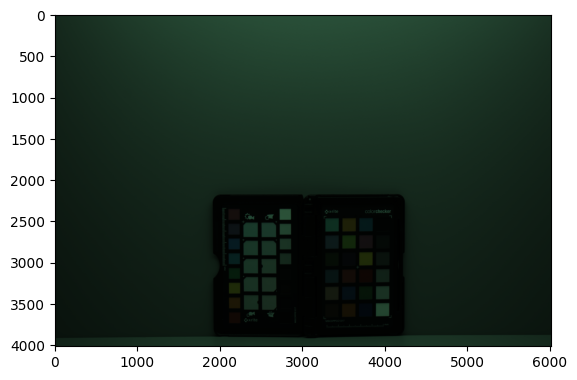

In [186]:
file_raw_0042 = ["data", "NikonD5600", "JN", "D50", "INDIGO_2022-06-19_NikonD5600_0042.NEF"]
path_raw_0042 = os.path.join(*file_raw_0042)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "XRCCPP", "Illuminant": JND50, "Observer":2}
image_0042 = RawImage(path_raw_0042, metadata, method="postprocess")

image_0042.show(method="matplotlib")

RAW RGB data extraction

In [187]:
has_colourchecker, corners, size_rect = image_0042.automatic_colourchecker_extraction(checker_name="XRCCPP_24", opencv_descriptor="SIFT")

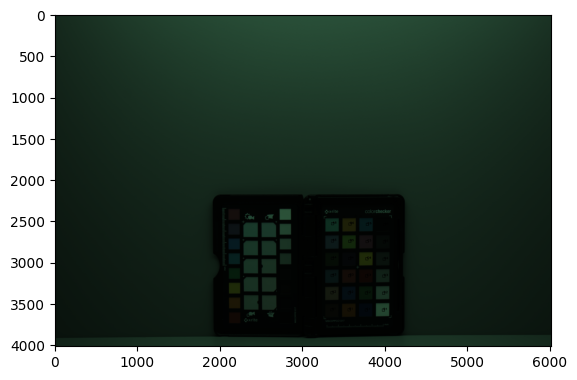

In [188]:
image_0042.show_colourchecker(checker_name="XRCCPP", show_image=True, method="matplotlib")

In [189]:
XRCCPP_RGB_JND50 = image_0042.get_ColourCheckerRGB("XRCCPP").as_pandas_dataframe()

In [190]:
data_xrccpp_jnd50 = pd.merge(XRCCPP_XYZ_JND50, XRCCPP_RGB_JND50, on="patch_id")
data_xrccpp_jnd50.insert(0, "ColourChecker", "XRCCPP")
data_xrccpp_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant JN-D50.,12.560599,10.790022,5.930023,MeasuredIlluminant object: Illuminant JN-D50.,399.911111,495.231111,284.642222
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant JN-D50.,40.288720,34.587995,20.311289,MeasuredIlluminant object: Illuminant JN-D50.,1314.720000,1622.897778,1001.488889
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant JN-D50.,16.185188,17.088293,25.649972,MeasuredIlluminant object: Illuminant JN-D50.,482.177778,1241.680000,1191.288889
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant JN-D50.,10.855761,12.785108,5.930286,MeasuredIlluminant object: Illuminant JN-D50.,364.777778,788.657778,369.217778
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant JN-D50.,22.783469,21.363974,32.105195,MeasuredIlluminant object: Illuminant JN-D50.,798.906667,1632.164444,1619.577778
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant JN-D50.,30.188540,40.728553,37.528945,MeasuredIlluminant object: Illuminant JN-D50.,913.312222,2989.084444,2110.046667
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant JN-D50.,41.250490,30.848614,5.600800,MeasuredIlluminant object: Illuminant JN-D50.,1375.077778,1081.878889,326.652222
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant JN-D50.,12.936640,11.834329,31.501638,MeasuredIlluminant object: Illuminant JN-D50.,315.364444,904.286667,1217.542222
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant JN-D50.,32.127888,20.561525,10.917440,MeasuredIlluminant object: Illuminant JN-D50.,1174.648889,749.546667,481.986667
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant JN-D50.,8.864504,6.682658,11.486082,MeasuredIlluminant object: Illuminant JN-D50.,303.660000,443.542222,491.655556


In [191]:
data_jnd50.append(data_xrccpp_jnd50)

### WPP

White - D1

In [192]:
patch_max = find_patch_max_value(data_xrccpp_jnd50)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [193]:
data_xrccpp_jnd50 = apply_wpp(data_xrccpp_jnd50, "D1")
data_xrccpp_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant JN-D50.,0.157954,0.134024,0.086111,MeasuredIlluminant object: Illuminant JN-D50.,0.171891,0.112203,0.092189
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant JN-D50.,0.506646,0.429622,0.294943,MeasuredIlluminant object: Illuminant JN-D50.,0.565098,0.367695,0.324357
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant JN-D50.,0.203535,0.212256,0.372466,MeasuredIlluminant object: Illuminant JN-D50.,0.207252,0.281324,0.385829
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant JN-D50.,0.136515,0.158805,0.086114,MeasuredIlluminant object: Illuminant JN-D50.,0.156790,0.178684,0.119580
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant JN-D50.,0.286511,0.265365,0.466203,MeasuredIlluminant object: Illuminant JN-D50.,0.343389,0.369794,0.524541
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant JN-D50.,0.379633,0.505894,0.544962,MeasuredIlluminant object: Illuminant JN-D50.,0.392564,0.677228,0.683392
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant JN-D50.,0.518741,0.383174,0.081330,MeasuredIlluminant object: Illuminant JN-D50.,0.591042,0.245118,0.105795
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant JN-D50.,0.162683,0.146996,0.457439,MeasuredIlluminant object: Illuminant JN-D50.,0.135551,0.204881,0.394332
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant JN-D50.,0.404021,0.255397,0.158533,MeasuredIlluminant object: Illuminant JN-D50.,0.504892,0.169822,0.156104
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant JN-D50.,0.111475,0.083006,0.166791,MeasuredIlluminant object: Illuminant JN-D50.,0.130520,0.100492,0.159235


In [194]:
data_xrccpp_jnd50.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.339656,0.321959,0.285787,0.385978,0.336485,0.316695
std,0.235896,0.233233,0.238186,0.269352,0.237400,0.238084
min,0.041463,0.041543,0.045200,0.052619,0.053688,0.057127
25%,0.161501,0.155853,0.104056,0.154063,0.160327,0.151426
50%,0.289153,0.251092,0.205062,0.365663,0.269036,0.254099
75%,0.441957,0.447134,0.445558,0.532694,0.463750,0.415707
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [195]:
data_wpp_jnd50.append(data_xrccpp_jnd50)

### SCK100

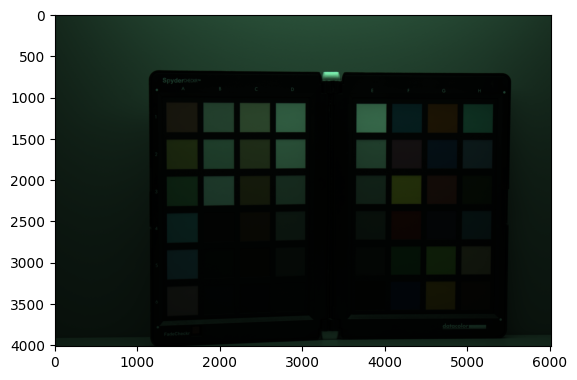

In [196]:
file_raw_0043 = ["data", "NikonD5600", "JN", "D50", "INDIGO_2022-06-19_NikonD5600_0043.NEF"]
path_raw_0043 = os.path.join(*file_raw_0043)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 6, 19], [8, 29, 00]], "ColourChecker": "SCK100", "Illuminant": JND50, "Observer":2}
image_0043 = RawImage(path_raw_0043, metadata, method="postprocess")

image_0043.show(method="matplotlib")

RAW RGB data extraction

In [197]:
has_colourchecker, corners, size_rect = image_0043.automatic_colourchecker_extraction(checker_name="SCK100_48", opencv_descriptor="SIFT")

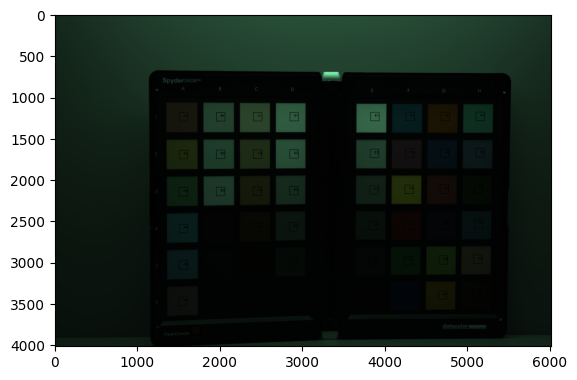

In [198]:
image_0043.show_colourchecker(checker_name="SCK100", show_image=True, method="matplotlib")

In [199]:
SCK100_RGB_JND50 = image_0043.get_ColourCheckerRGB("SCK100").as_pandas_dataframe()

In [200]:
data_sck100_jnd50 = pd.merge(SCK100_XYZ_JND50, SCK100_RGB_JND50, on="patch_id")
data_sck100_jnd50.insert(0, "ColourChecker", "SCK100")
data_sck100_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant JN-D50.,38.980078,29.610111,17.348822,MeasuredIlluminant object: Illuminant JN-D50.,1496.915311,1427.405973,869.940828
1,SCK100,A2,MeasuredIlluminant object: Illuminant JN-D50.,49.326695,48.082434,14.598239,MeasuredIlluminant object: Illuminant JN-D50.,1675.707655,2409.367234,886.298632
2,SCK100,A3,MeasuredIlluminant object: Illuminant JN-D50.,27.639944,35.306390,19.458814,MeasuredIlluminant object: Illuminant JN-D50.,776.361779,2026.203402,1057.098188
3,SCK100,A4,MeasuredIlluminant object: Illuminant JN-D50.,24.637627,30.587982,41.320196,MeasuredIlluminant object: Illuminant JN-D50.,540.472448,1839.179364,1643.559172
4,SCK100,A5,MeasuredIlluminant object: Illuminant JN-D50.,26.785986,28.094309,44.642396,MeasuredIlluminant object: Illuminant JN-D50.,557.299001,1496.086816,1499.764053
5,SCK100,A6,MeasuredIlluminant object: Illuminant JN-D50.,36.897037,28.357019,27.675519,MeasuredIlluminant object: Illuminant JN-D50.,880.866309,996.463572,821.844120
6,SCK100,B1,MeasuredIlluminant object: Illuminant JN-D50.,61.145199,60.204390,51.631169,MeasuredIlluminant object: Illuminant JN-D50.,2207.665680,4032.237056,2848.053254
7,SCK100,B2,MeasuredIlluminant object: Illuminant JN-D50.,57.740154,59.880533,50.783526,MeasuredIlluminant object: Illuminant JN-D50.,1901.640995,3821.253791,2639.236132
8,SCK100,B3,MeasuredIlluminant object: Illuminant JN-D50.,60.116807,60.232214,55.971033,MeasuredIlluminant object: Illuminant JN-D50.,1810.927885,3505.353180,2591.109098
9,SCK100,B4,MeasuredIlluminant object: Illuminant JN-D50.,6.298845,5.899604,4.867330,MeasuredIlluminant object: Illuminant JN-D50.,158.591069,246.651442,174.660318


In [201]:
data_jnd50.append(data_sck100_jnd50)

### WPP

White - E1

In [202]:
patch_max = find_patch_max_value(data_sck100_jnd50)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E1', 'E1', 'E1']
['E1', 'E1', 'E1']


In [203]:
data_sck100_jnd50 = apply_wpp(data_sck100_jnd50, "E1")
data_sck100_jnd50

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant JN-D50.,0.438399,0.330192,0.221741,MeasuredIlluminant object: Illuminant JN-D50.,0.442461,0.220208,0.189013
1,SCK100,A2,MeasuredIlluminant object: Illuminant JN-D50.,0.554765,0.536183,0.186585,MeasuredIlluminant object: Illuminant JN-D50.,0.495309,0.371697,0.192567
2,SCK100,A3,MeasuredIlluminant object: Illuminant JN-D50.,0.310859,0.393713,0.248710,MeasuredIlluminant object: Illuminant JN-D50.,0.229479,0.312586,0.229677
3,SCK100,A4,MeasuredIlluminant object: Illuminant JN-D50.,0.277093,0.341097,0.528127,MeasuredIlluminant object: Illuminant JN-D50.,0.159754,0.283733,0.357097
4,SCK100,A5,MeasuredIlluminant object: Illuminant JN-D50.,0.301255,0.313289,0.570589,MeasuredIlluminant object: Illuminant JN-D50.,0.164728,0.230804,0.325855
5,SCK100,A6,MeasuredIlluminant object: Illuminant JN-D50.,0.414972,0.316219,0.353730,MeasuredIlluminant object: Illuminant JN-D50.,0.260368,0.153726,0.178563
6,SCK100,B1,MeasuredIlluminant object: Illuminant JN-D50.,0.687685,0.671359,0.659915,MeasuredIlluminant object: Illuminant JN-D50.,0.652546,0.622060,0.618799
7,SCK100,B2,MeasuredIlluminant object: Illuminant JN-D50.,0.649389,0.667748,0.649081,MeasuredIlluminant object: Illuminant JN-D50.,0.562091,0.589511,0.573429
8,SCK100,B3,MeasuredIlluminant object: Illuminant JN-D50.,0.676119,0.671669,0.715384,MeasuredIlluminant object: Illuminant JN-D50.,0.535278,0.540777,0.562972
9,SCK100,B4,MeasuredIlluminant object: Illuminant JN-D50.,0.070842,0.065788,0.062211,MeasuredIlluminant object: Illuminant JN-D50.,0.046877,0.038051,0.037949


In [204]:
data_sck100_jnd50.describe()

,X,Y,Z,R,G,B
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,0.355369,0.342142,0.304477,0.298101,0.266167,0.250078
std,0.251418,0.248300,0.249830,0.253671,0.238786,0.238520
min,0.046960,0.047106,0.048477,0.023191,0.022758,0.023270
25%,0.137817,0.140490,0.084020,0.086508,0.080702,0.063186
50%,0.306057,0.299084,0.235225,0.237888,0.200611,0.175636
75%,0.517549,0.490532,0.464682,0.455673,0.379626,0.340391
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [205]:
data_wpp_jnd50.append(data_sck100_jnd50)

## Merge data

In [206]:
data_pd_jnd50 = pd.concat(data_jnd50, ignore_index=True)

data_pd_jnd50 = data_pd_jnd50.drop(columns="illuminant_y")
data_pd_jnd50 = data_pd_jnd50.rename(columns={"illuminant_x":"illuminant"})
data_pd_jnd50["illuminant"] = "JN-D50" # as str to avoid error
data_pd_jnd50

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JN-D50,18.410151,11.546970,12.587745,723.645692,414.140448,469.501559
1,CCDSG,B3,JN-D50,40.836037,33.499315,41.062774,1515.942744,2108.683673,2019.792517
2,CCDSG,B4,JN-D50,15.707469,10.120208,22.228786,443.127268,443.202381,770.958900
3,CCDSG,B5,JN-D50,18.458344,21.427231,49.089425,377.456916,1765.837585,2241.211735
4,CCDSG,B6,JN-D50,24.157322,31.693107,46.871468,564.159297,2329.582766,2232.183673
...,...,...,...,...,...,...,...,...,...
187,SCK100,H2,JN-D50,25.443454,24.004752,36.437690,720.420858,1514.573225,1541.039016
188,SCK100,H3,JN-D50,10.802643,12.943049,5.940856,263.086908,599.795488,248.865385
189,SCK100,H4,JN-D50,17.545460,18.798930,28.274609,363.738166,1005.058062,972.596893
190,SCK100,H5,JN-D50,40.873902,35.567215,21.010066,1060.507396,1327.777182,794.899223


In [207]:
data_pd_wpp_jnd50 = pd.concat(data_wpp_jnd50, ignore_index=True)

data_pd_wpp_jnd50 = data_pd_wpp_jnd50.drop(columns="illuminant_y")
data_pd_wpp_jnd50 = data_pd_wpp_jnd50.rename(columns={"illuminant_x":"illuminant"})
data_pd_wpp_jnd50["illuminant"] = "JN-D50" # as str to avoid error
data_pd_wpp_jnd50

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JN-D50,0.204757,0.127027,0.159134,0.229700,0.068873,0.109334
1,CCDSG,B3,JN-D50,0.454177,0.368523,0.519114,0.481192,0.350679,0.470353
2,CCDSG,B4,JN-D50,0.174698,0.111331,0.281015,0.140658,0.073706,0.179535
3,CCDSG,B5,JN-D50,0.205293,0.235719,0.620586,0.119813,0.293663,0.521915
4,CCDSG,B6,JN-D50,0.268677,0.348653,0.592547,0.179076,0.387415,0.519813
...,...,...,...,...,...,...,...,...,...
187,SCK100,H2,JN-D50,0.286156,0.267685,0.465722,0.212943,0.233656,0.334823
188,SCK100,H3,JN-D50,0.121495,0.144332,0.075932,0.077764,0.092531,0.054071
189,SCK100,H4,JN-D50,0.197329,0.209633,0.361387,0.107514,0.155052,0.211317
190,SCK100,H5,JN-D50,0.459698,0.396622,0.268537,0.313467,0.204838,0.172708


## Indoor

## IN-30

In [208]:
data_in30 = []
data_wpp_in30 = []

| Image                                 |  Illuminant  | ColourChecker                         | Patches |
|---------------------------------------|--------------|--------------------------------------|---------|
| INDIGO_2022-05-25_NikonD5600_0002.NEF | IN-30-5027ºK | CCDSG  - Calibrite DIGITAL SG        | 96     |
| INDIGO_2022-05-25_NikonD5600_0001.NEF | IN-30-5027ºK | CCC - Calibrite Classic              | 24      |
| INDIGO_2022-05-25_NikonD5600_0005.NEF | IN-30-5027ºK | XRCCPP - X-rite PASSPORT PHOTO       | 24      |
| INDIGO_2022-05-25_NikonD5600_0003.NEF | IN-30-5027ºK | SCK100 - SpyderCHECKR                | 48      |

<img src="res/screenshot/NikonD5600/IN30/INDIGO_2022-05-25_NikonD5600_0002.jpg" width="500">
<img src="res/screenshot/NikonD5600/IN30/INDIGO_2022-05-25_NikonD5600_0001.jpg" width="500">
<img src="res/screenshot/NikonD5600/IN30/INDIGO_2022-05-25_NikonD5600_0005.jpg" width="500">
<img src="res/screenshot/NikonD5600/IN30/INDIGO_2022-05-25_NikonD5600_0003.jpg" width="500">

## SPD Illuminant

IN-30

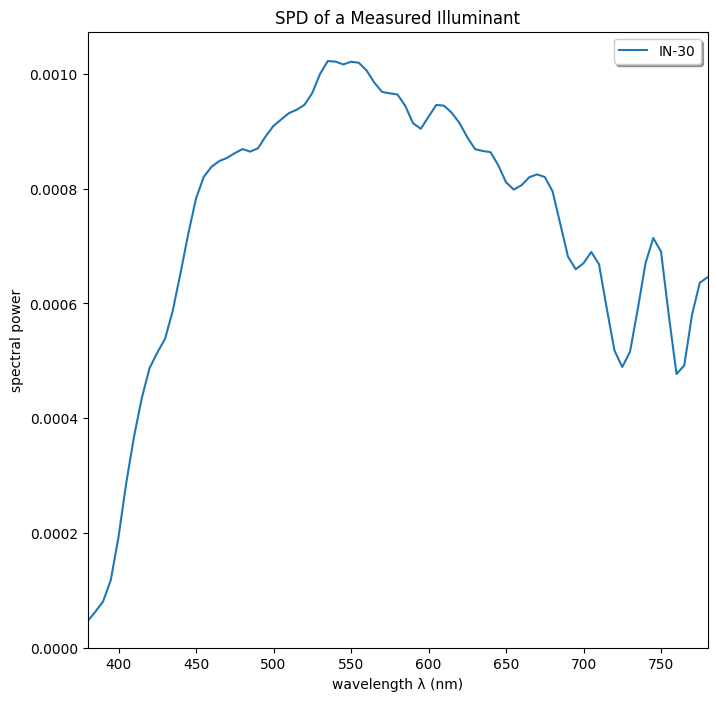

In [209]:
file_spd = ["res", "spd", "INDIGO-C7000-A_030_02°_5027K.csv"]
path_spd = os.path.join(*file_spd)

IN30 = MeasuredIlluminant(illuminant_name="IN-30", path_file=path_spd)

IN30.plot()

XYZ data (under IN-30)

In [210]:
CCDSG_XYZ_IN30 = CCDSG.to_ColourCheckerXYZ(illuminant=IN30, observer=2).as_pandas_dataframe()

In [211]:
CCC_XYZ_IN30 = CCC.to_ColourCheckerXYZ(illuminant=IN30, observer=2).as_pandas_dataframe()

In [212]:
XRCCPP_XYZ_IN30 = XRCCPP.to_ColourCheckerXYZ(illuminant=IN30, observer=2).as_pandas_dataframe()

In [213]:
SCK100_XYZ_IN30 = SCK100.to_ColourCheckerXYZ(illuminant=IN30, observer=2).as_pandas_dataframe()

## RawImage

### CCDSG

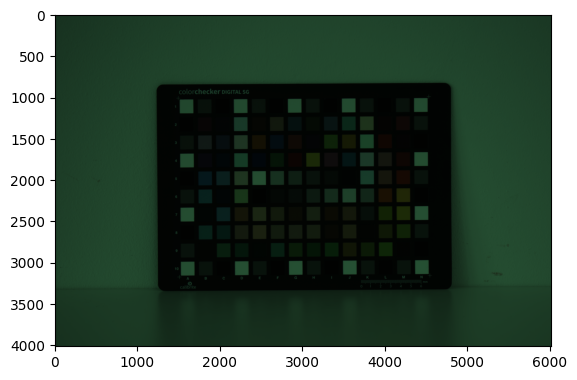

In [214]:
file_raw_0002i = ["data", "NikonD5600", "Indoor", "IN30", "INDIGO_2022-05-25_NikonD5600_0002.NEF"]
path_raw_0002i= os.path.join(*file_raw_0002i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [15, 45, 00]], "ColourChecker": "CCDSG", "Illuminant": IN30, "Observer":2}
image_0002i = RawImage(path_raw_0002i, metadata, method="postprocess")

image_0002i.show(method="matplotlib")

RAW RGB data extraction

In [215]:
has_colourchecker, corners, size_rect = image_0002i.automatic_colourchecker_extraction(checker_name="CCDSG", opencv_descriptor="SIFT")

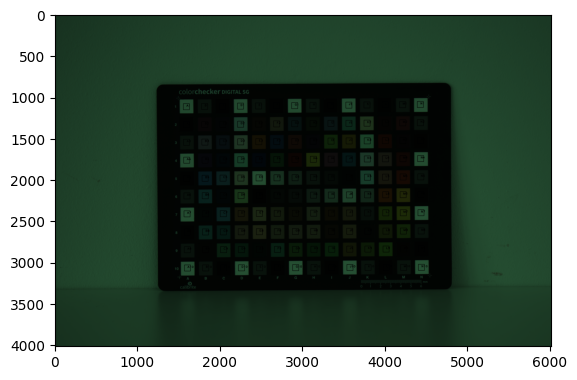

In [216]:
image_0002i.show_colourchecker(checker_name="CCDSG", show_image=True, method="matplotlib")

In [217]:
CCDSG_RGB_IN30 = image_0002i.get_ColourCheckerRGB("CCDSG").as_pandas_dataframe()

In [218]:
data_ccdsg_in30 = pd.merge(CCDSG_XYZ_IN30, CCDSG_RGB_IN30, on="patch_id")
data_ccdsg_in30.insert(0, "ColourChecker", "CCDSG")
data_ccdsg_in30

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCDSG,A1,MeasuredIlluminant object: Illuminant IN-30.,84.836493,90.860950,69.497729,MeasuredIlluminant object: Illuminant IN-30.,2160.645727,4554.218042,2927.173119
1,CCDSG,A2,MeasuredIlluminant object: Illuminant IN-30.,4.126463,4.393036,3.438036,MeasuredIlluminant object: Illuminant IN-30.,82.583638,166.602995,108.735208
2,CCDSG,A3,MeasuredIlluminant object: Illuminant IN-30.,20.650434,22.093972,17.137087,MeasuredIlluminant object: Illuminant IN-30.,519.189920,1089.692476,701.670562
3,CCDSG,A4,MeasuredIlluminant object: Illuminant IN-30.,83.846162,89.800697,68.815928,MeasuredIlluminant object: Illuminant IN-30.,2252.669467,4733.910153,3041.275383
4,CCDSG,A5,MeasuredIlluminant object: Illuminant IN-30.,4.111348,4.378228,3.429316,MeasuredIlluminant object: Illuminant IN-30.,80.168006,160.880752,104.585464
...,...,...,...,...,...,...,...,...,...,...
135,CCDSG,N6,MeasuredIlluminant object: Illuminant IN-30.,4.107847,4.375125,3.426922,MeasuredIlluminant object: Illuminant IN-30.,85.232286,167.875091,108.545654
136,CCDSG,N7,MeasuredIlluminant object: Illuminant IN-30.,84.299873,90.285197,69.155302,MeasuredIlluminant object: Illuminant IN-30.,2404.411980,5025.466764,3239.434624
137,CCDSG,N8,MeasuredIlluminant object: Illuminant IN-30.,20.708159,22.153267,17.158751,MeasuredIlluminant object: Illuminant IN-30.,562.735026,1173.234295,757.112491
138,CCDSG,N9,MeasuredIlluminant object: Illuminant IN-30.,4.083214,4.347660,3.397135,MeasuredIlluminant object: Illuminant IN-30.,87.666910,173.262235,111.875091


In [219]:
data_ccdsg_in30 = data_ccdsg_in30[(data_ccdsg_in30["patch_id"].str.contains("1")==False) & (data_ccdsg_in30["patch_id"].str.contains("0")==False) & (data_ccdsg_in30["patch_id"].str.contains("0")==False) & (data_ccdsg_in30["patch_id"].str.contains("A")==False) & (data_ccdsg_in30["patch_id"].str.contains("N")==False)]
data_ccdsg_in30

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant IN-30.,16.377528,10.774730,11.100460,MeasuredIlluminant object: Illuminant IN-30.,489.070855,381.465668,367.081812
12,CCDSG,B3,MeasuredIlluminant object: Illuminant IN-30.,37.531572,32.560233,36.163229,MeasuredIlluminant object: Illuminant IN-30.,1044.623083,1604.620161,1394.197955
13,CCDSG,B4,MeasuredIlluminant object: Illuminant IN-30.,14.257916,9.587453,19.611997,MeasuredIlluminant object: Illuminant IN-30.,368.083272,438.312637,627.596056
14,CCDSG,B5,MeasuredIlluminant object: Illuminant IN-30.,17.314685,21.046111,43.334406,MeasuredIlluminant object: Illuminant IN-30.,343.335281,1512.040906,1748.531045
15,CCDSG,B6,MeasuredIlluminant object: Illuminant IN-30.,22.972847,31.625074,41.079331,MeasuredIlluminant object: Illuminant IN-30.,515.348977,2118.172754,1827.634222
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant IN-30.,37.366177,22.929633,5.851314,MeasuredIlluminant object: Illuminant IN-30.,1368.879474,639.934259,254.143170
125,CCDSG,M6,MeasuredIlluminant object: Illuminant IN-30.,67.048419,61.464276,7.898556,MeasuredIlluminant object: Illuminant IN-30.,2074.344777,2457.171658,491.941198
126,CCDSG,M7,MeasuredIlluminant object: Illuminant IN-30.,60.174763,62.127914,6.281013,MeasuredIlluminant object: Illuminant IN-30.,1828.847699,2713.109752,474.980095
127,CCDSG,M8,MeasuredIlluminant object: Illuminant IN-30.,37.044432,44.911189,6.641758,MeasuredIlluminant object: Illuminant IN-30.,1020.158510,2156.257122,465.395909


In [220]:
data_in30.append(data_ccdsg_in30)

### WPP

White - E5

In [221]:
patch_max = find_patch_max_value(data_ccdsg_in30)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E5', 'E5', 'E5']
['E5', 'E5', 'E5']


In [222]:
data_ccdsg_in30 = apply_wpp(data_ccdsg_in30, "E5")
data_ccdsg_in30

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant IN-30.,0.192935,0.118528,0.159800,MeasuredIlluminant object: Illuminant IN-30.,0.210006,0.078039,0.117232
12,CCDSG,B3,MeasuredIlluminant object: Illuminant IN-30.,0.442141,0.358180,0.520598,MeasuredIlluminant object: Illuminant IN-30.,0.448560,0.328269,0.445253
13,CCDSG,B4,MeasuredIlluminant object: Illuminant IN-30.,0.167965,0.105467,0.282330,MeasuredIlluminant object: Illuminant IN-30.,0.158055,0.089669,0.200430
14,CCDSG,B5,MeasuredIlluminant object: Illuminant IN-30.,0.203976,0.231519,0.623832,MeasuredIlluminant object: Illuminant IN-30.,0.147428,0.309329,0.558413
15,CCDSG,B6,MeasuredIlluminant object: Illuminant IN-30.,0.270632,0.347893,0.591369,MeasuredIlluminant object: Illuminant IN-30.,0.221290,0.433330,0.583675
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant IN-30.,0.440192,0.252238,0.084234,MeasuredIlluminant object: Illuminant IN-30.,0.587795,0.130916,0.081163
125,CCDSG,M6,MeasuredIlluminant object: Illuminant IN-30.,0.789864,0.676141,0.113706,MeasuredIlluminant object: Illuminant IN-30.,0.890721,0.502682,0.157107
126,CCDSG,M7,MeasuredIlluminant object: Illuminant IN-30.,0.708889,0.683441,0.090420,MeasuredIlluminant object: Illuminant IN-30.,0.785305,0.555041,0.151690
127,CCDSG,M8,MeasuredIlluminant object: Illuminant IN-30.,0.436402,0.494048,0.095613,MeasuredIlluminant object: Illuminant IN-30.,0.438055,0.441122,0.148629


In [223]:
data_ccdsg_in30.describe()

,X,Y,Z,R,G,B
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000
mean,0.359942,0.344003,0.286661,0.371719,0.318353,0.286349
std,0.227594,0.222694,0.235578,0.248236,0.221682,0.231522
min,0.048313,0.048041,0.049223,0.035381,0.033541,0.033884
25%,0.160474,0.159688,0.099163,0.146782,0.127774,0.110864
50%,0.334240,0.347479,0.211465,0.351312,0.306961,0.205800
75%,0.475976,0.465504,0.410628,0.538101,0.430428,0.384412
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [224]:
data_wpp_in30.append(data_ccdsg_in30)

### CCC

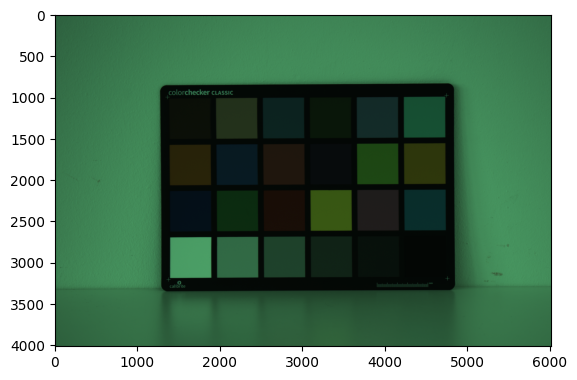

In [225]:
file_raw_0001i = ["data", "NikonD5600", "Indoor", "IN30", "INDIGO_2022-05-25_NikonD5600_0001.NEF"]
path_raw_0001i = os.path.join(*file_raw_0001i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [15, 45, 00]], "ColourChecker": "CCC", "Illuminant": IN30, "Observer":2}
image_0001i = RawImage(path_raw_0001i, metadata, method="postprocess")

image_0001i.show(method="matplotlib")

RAW RGB data extraction

In [226]:
has_colourchecker, corners, size_rect = image_0001i.automatic_colourchecker_extraction(checker_name="CCC", opencv_descriptor="SIFT")

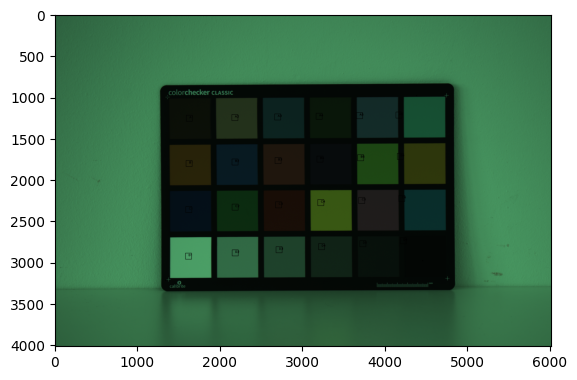

In [227]:
image_0001i.show_colourchecker(checker_name="CCC", show_image=True, method="matplotlib")

In [228]:
CCC_RGB_IN30 = image_0001i.get_ColourCheckerRGB("CCC").as_pandas_dataframe()

In [229]:
data_ccc_in30 = pd.merge(CCC_XYZ_IN30, CCC_RGB_IN30, on="patch_id")
data_ccc_in30.insert(0, "ColourChecker", "CCC")
data_ccc_in30

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant IN-30.,12.173318,11.039005,5.319430,MeasuredIlluminant object: Illuminant IN-30.,177.331264,243.082177,127.108108
1,CCC,A2,MeasuredIlluminant object: Illuminant IN-30.,38.631072,35.577218,18.735163,MeasuredIlluminant object: Illuminant IN-30.,564.114317,788.694668,439.317385
2,CCC,A3,MeasuredIlluminant object: Illuminant IN-30.,17.262658,19.206430,25.734019,MeasuredIlluminant object: Illuminant IN-30.,199.970051,562.576333,510.100804
3,CCC,A4,MeasuredIlluminant object: Illuminant IN-30.,11.390687,14.172897,5.443420,MeasuredIlluminant object: Illuminant IN-30.,148.615047,357.067202,150.103725
4,CCC,A5,MeasuredIlluminant object: Illuminant IN-30.,24.591684,24.099450,32.903869,MeasuredIlluminant object: Illuminant IN-30.,295.061359,647.945581,607.945215
5,CCC,A6,MeasuredIlluminant object: Illuminant IN-30.,31.195518,43.575768,34.198460,MeasuredIlluminant object: Illuminant IN-30.,152.121256,323.112491,279.511687
6,CCC,B1,MeasuredIlluminant object: Illuminant IN-30.,40.809006,32.257516,5.068241,MeasuredIlluminant object: Illuminant IN-30.,638.228269,562.122352,154.093864
7,CCC,B2,MeasuredIlluminant object: Illuminant IN-30.,12.348385,11.771205,29.108208,MeasuredIlluminant object: Illuminant IN-30.,136.836742,422.329072,543.768809
8,CCC,B3,MeasuredIlluminant object: Illuminant IN-30.,29.740816,20.002465,9.995411,MeasuredIlluminant object: Illuminant IN-30.,501.122169,362.175310,218.795106
9,CCC,B4,MeasuredIlluminant object: Illuminant IN-30.,8.605922,6.681557,10.683092,MeasuredIlluminant object: Illuminant IN-30.,122.059898,182.455807,195.731191


In [230]:
data_in30.append(data_ccc_in30)

### WPP

White - D1

In [231]:
patch_max = find_patch_max_value(data_ccc_in30)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [232]:
data_ccc_in30 = apply_wpp(data_ccc_in30, "D1")
data_ccc_in30

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant IN-30.,0.141521,0.119809,0.075657,MeasuredIlluminant object: Illuminant IN-30.,0.148812,0.096418,0.078350
1,CCC,A2,MeasuredIlluminant object: Illuminant IN-30.,0.449106,0.386128,0.266466,MeasuredIlluminant object: Illuminant IN-30.,0.473390,0.312833,0.270796
2,CCC,A3,MeasuredIlluminant object: Illuminant IN-30.,0.200687,0.208452,0.366009,MeasuredIlluminant object: Illuminant IN-30.,0.167810,0.223144,0.314427
3,CCC,A4,MeasuredIlluminant object: Illuminant IN-30.,0.132423,0.153822,0.077420,MeasuredIlluminant object: Illuminant IN-30.,0.124714,0.141629,0.092524
4,CCC,A5,MeasuredIlluminant object: Illuminant IN-30.,0.285891,0.261557,0.467984,MeasuredIlluminant object: Illuminant IN-30.,0.247608,0.257005,0.374739
5,CCC,A6,MeasuredIlluminant object: Illuminant IN-30.,0.362664,0.472939,0.486397,MeasuredIlluminant object: Illuminant IN-30.,0.127656,0.128161,0.172292
6,CCC,B1,MeasuredIlluminant object: Illuminant IN-30.,0.474426,0.350099,0.072084,MeasuredIlluminant object: Illuminant IN-30.,0.535585,0.222964,0.094984
7,CCC,B2,MeasuredIlluminant object: Illuminant IN-30.,0.143556,0.127756,0.413999,MeasuredIlluminant object: Illuminant IN-30.,0.114830,0.167515,0.335180
8,CCC,B3,MeasuredIlluminant object: Illuminant IN-30.,0.345752,0.217092,0.142162,MeasuredIlluminant object: Illuminant IN-30.,0.420529,0.143656,0.134866
9,CCC,B4,MeasuredIlluminant object: Illuminant IN-30.,0.100048,0.072517,0.151943,MeasuredIlluminant object: Illuminant IN-30.,0.102429,0.072370,0.120649


In [233]:
data_ccc_in30.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.323655,0.307756,0.272295,0.299887,0.252174,0.240150
std,0.232571,0.233029,0.232502,0.248159,0.225533,0.217203
min,0.037053,0.037031,0.038738,0.047894,0.046966,0.049420
25%,0.143047,0.141068,0.100993,0.112926,0.106145,0.094369
50%,0.269958,0.221269,0.188394,0.195472,0.174636,0.181850
75%,0.423592,0.426493,0.416648,0.416964,0.284715,0.282861
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [234]:
data_wpp_in30.append(data_ccc_in30)

### XRCCPP

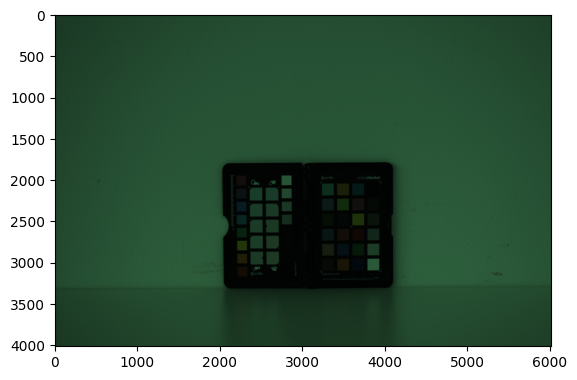

In [235]:
file_raw_0005i = ["data", "NikonD5600", "Indoor", "IN30", "INDIGO_2022-05-25_NikonD5600_0005.NEF"]
path_raw_0005i = os.path.join(*file_raw_0005i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [15, 45, 00]], "ColourChecker": "XRCCPP", "Illuminant": IN30, "Observer":2}
image_0005i = RawImage(path_raw_0005i, metadata, method="postprocess")

image_0005i.show(method="matplotlib")

RAW RGB data extraction

In [236]:
has_colourchecker, corners, size_rect = image_0005i.automatic_colourchecker_extraction(checker_name="XRCCPP_24", opencv_descriptor="SIFT")

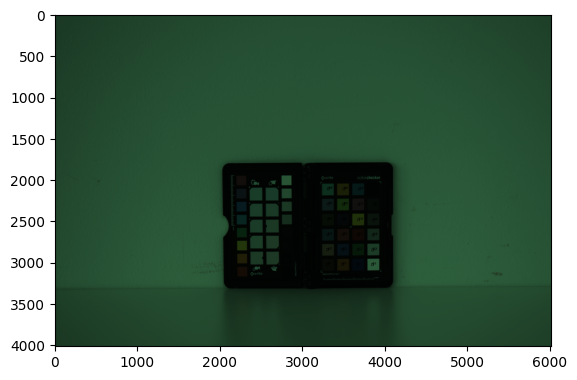

In [237]:
image_0005i.show_colourchecker(checker_name="XRCCPP", show_image=True, method="matplotlib")

In [238]:
XRCCPP_RGB_IN30= image_0005i.get_ColourCheckerRGB("XRCCPP").as_pandas_dataframe()

In [239]:
data_xrccpp_in30 = pd.merge(XRCCPP_XYZ_IN30, XRCCPP_RGB_IN30, on="patch_id")
data_xrccpp_in30.insert(0, "ColourChecker", "XRCCPP")
data_xrccpp_in30

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant IN-30.,11.698494,10.679990,5.207890,MeasuredIlluminant object: Illuminant IN-30.,438.301775,606.269231,312.994083
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant IN-30.,36.932098,33.668799,17.713144,MeasuredIlluminant object: Illuminant IN-30.,1424.988166,1935.618343,1092.630178
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant IN-30.,15.280546,16.971599,22.597139,MeasuredIlluminant object: Illuminant IN-30.,503.795858,1395.286982,1240.550296
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant IN-30.,10.433615,12.948453,5.189166,MeasuredIlluminant object: Illuminant IN-30.,363.079882,864.772189,367.035503
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant IN-30.,21.216115,20.982333,28.283729,MeasuredIlluminant object: Illuminant IN-30.,751.213018,1653.384615,1520.544379
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant IN-30.,29.303169,41.260135,32.791306,MeasuredIlluminant object: Illuminant IN-30.,843.988166,2974.455621,1900.289941
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant IN-30.,38.082729,30.279433,4.906219,MeasuredIlluminant object: Illuminant IN-30.,1545.911243,1367.920118,370.656805
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant IN-30.,12.084309,11.571858,27.866813,MeasuredIlluminant object: Illuminant IN-30.,342.056213,1038.659763,1323.940828
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant IN-30.,28.370786,19.057974,9.620428,MeasuredIlluminant object: Illuminant IN-30.,1205.289941,853.023669,516.369822
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant IN-30.,8.224462,6.467641,10.135305,MeasuredIlluminant object: Illuminant IN-30.,301.301775,463.360947,485.207101


In [240]:
data_in30.append(data_xrccpp_in30)

### WPP

White - D1

In [241]:
patch_max = find_patch_max_value(data_xrccpp_in30)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [242]:
data_xrccpp_in30 = apply_wpp(data_xrccpp_in30, "D1")
data_xrccpp_in30

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant IN-30.,0.155789,0.132622,0.086117,MeasuredIlluminant object: Illuminant IN-30.,0.159264,0.105298,0.085260
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant IN-30.,0.491825,0.418092,0.292903,MeasuredIlluminant object: Illuminant IN-30.,0.517792,0.336183,0.297635
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant IN-30.,0.203491,0.210750,0.373665,MeasuredIlluminant object: Illuminant IN-30.,0.183062,0.242337,0.337929
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant IN-30.,0.138944,0.160791,0.085808,MeasuredIlluminant object: Illuminant IN-30.,0.131931,0.150196,0.099981
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant IN-30.,0.282535,0.260554,0.467698,MeasuredIlluminant object: Illuminant IN-30.,0.272965,0.287164,0.414200
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant IN-30.,0.390230,0.512360,0.542235,MeasuredIlluminant object: Illuminant IN-30.,0.306676,0.516611,0.517643
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant IN-30.,0.507148,0.376004,0.081129,MeasuredIlluminant object: Illuminant IN-30.,0.561731,0.237584,0.100968
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant IN-30.,0.160927,0.143697,0.460803,MeasuredIlluminant object: Illuminant IN-30.,0.124292,0.180397,0.360644
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant IN-30.,0.377814,0.236658,0.159083,MeasuredIlluminant object: Illuminant IN-30.,0.437961,0.148155,0.140660
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant IN-30.,0.109525,0.080314,0.167597,MeasuredIlluminant object: Illuminant IN-30.,0.109483,0.080478,0.132172


In [243]:
data_xrccpp_in30.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.336749,0.319953,0.286172,0.339152,0.295252,0.279420
std,0.235323,0.235468,0.238196,0.247270,0.223533,0.221993
min,0.041472,0.041537,0.045275,0.041189,0.042363,0.044663
25%,0.159642,0.150686,0.105641,0.130874,0.138403,0.126972
50%,0.275821,0.235633,0.205747,0.289821,0.239961,0.217809
75%,0.442382,0.442310,0.446045,0.457919,0.377376,0.374033
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [244]:
data_wpp_in30.append(data_xrccpp_in30)

### SCK100

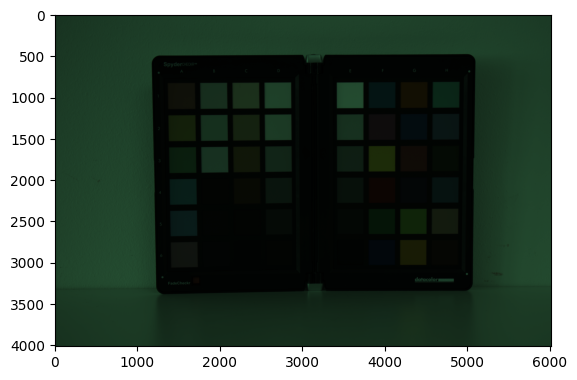

In [245]:
file_raw_0003i = ["data", "NikonD5600", "Indoor", "IN30", "INDIGO_2022-05-25_NikonD5600_0003.NEF"]
path_raw_0003i = os.path.join(*file_raw_0003i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [15, 45, 00]], "ColourChecker": "SCK100", "Illuminant": IN30, "Observer":2}
image_0003i = RawImage(path_raw_0003i, metadata, method="postprocess")

image_0003i.show(method="matplotlib")

RAW RGB data extraction

In [246]:
has_colourchecker, corners, size_rect = image_0003i.automatic_colourchecker_extraction(checker_name="SCK100_48", opencv_descriptor="SIFT")

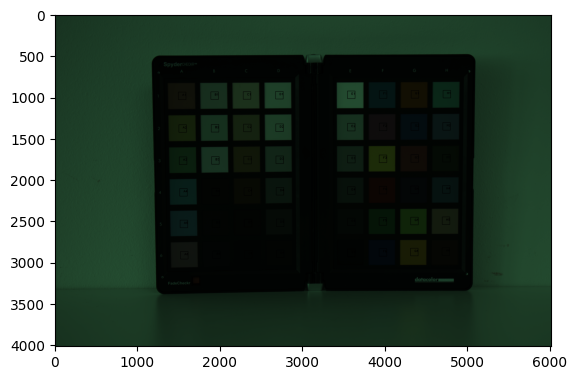

In [247]:
image_0003i.show_colourchecker(checker_name="SCK100", show_image=True, method="matplotlib")

In [248]:
SCK100_RGB_IN30 = image_0003i.get_ColourCheckerRGB("SCK100").as_pandas_dataframe()

In [249]:
data_sck100_in30 = pd.merge(SCK100_XYZ_IN30, SCK100_RGB_IN30, on="patch_id")
data_sck100_in30.insert(0, "ColourChecker", "SCK100")
data_sck100_in30

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant IN-30.,35.935442,29.004324,15.264902,MeasuredIlluminant object: Illuminant IN-30.,1015.671314,1079.348535,598.799622
1,SCK100,A2,MeasuredIlluminant object: Illuminant IN-30.,46.847074,48.446954,12.814035,MeasuredIlluminant object: Illuminant IN-30.,1261.167533,2035.443526,685.754253
2,SCK100,A3,MeasuredIlluminant object: Illuminant IN-30.,26.813070,35.971879,16.996695,MeasuredIlluminant object: Illuminant IN-30.,675.692817,1915.438563,898.639887
3,SCK100,A4,MeasuredIlluminant object: Illuminant IN-30.,23.481348,30.558819,36.285091,MeasuredIlluminant object: Illuminant IN-30.,540.016068,1909.392722,1558.465265
4,SCK100,A5,MeasuredIlluminant object: Illuminant IN-30.,25.126784,27.767891,39.297585,MeasuredIlluminant object: Illuminant IN-30.,611.776938,1727.854206,1600.032136
5,SCK100,A6,MeasuredIlluminant object: Illuminant IN-30.,33.506072,27.245769,24.387893,MeasuredIlluminant object: Illuminant IN-30.,1021.208885,1257.028592,971.671314
6,SCK100,B1,MeasuredIlluminant object: Illuminant IN-30.,57.591902,60.100134,45.420636,MeasuredIlluminant object: Illuminant IN-30.,1475.693998,2930.026465,1891.603025
7,SCK100,B2,MeasuredIlluminant object: Illuminant IN-30.,54.718241,60.018302,44.640527,MeasuredIlluminant object: Illuminant IN-30.,1396.196125,3041.806711,1916.720227
8,SCK100,B3,MeasuredIlluminant object: Illuminant IN-30.,56.684129,60.138739,49.224311,MeasuredIlluminant object: Illuminant IN-30.,1499.260043,3139.007325,2112.081758
9,SCK100,B4,MeasuredIlluminant object: Illuminant IN-30.,5.868075,5.832488,4.282473,MeasuredIlluminant object: Illuminant IN-30.,159.930766,276.944943,178.410326


In [250]:
data_in30.append(data_sck100_in30)

### WPP

White - E1

In [251]:
patch_max = find_patch_max_value(data_sck100_in30)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E1', 'E1', 'E1']
['E1', 'E1', 'E1']


In [252]:
data_sck100_in30 = apply_wpp(data_sck100_in30, "E1")
data_sck100_in30

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant IN-30.,0.428302,0.323571,0.222136,MeasuredIlluminant object: Illuminant IN-30.,0.447458,0.226856,0.195111
1,SCK100,A2,MeasuredIlluminant object: Illuminant IN-30.,0.558353,0.540473,0.186471,MeasuredIlluminant object: Illuminant IN-30.,0.555612,0.427808,0.223444
2,SCK100,A3,MeasuredIlluminant object: Illuminant IN-30.,0.319575,0.401301,0.247337,MeasuredIlluminant object: Illuminant IN-30.,0.297679,0.402585,0.292810
3,SCK100,A4,MeasuredIlluminant object: Illuminant IN-30.,0.279866,0.340913,0.528023,MeasuredIlluminant object: Illuminant IN-30.,0.237906,0.401314,0.507805
4,SCK100,A5,MeasuredIlluminant object: Illuminant IN-30.,0.299477,0.309778,0.571861,MeasuredIlluminant object: Illuminant IN-30.,0.269521,0.363159,0.521349
5,SCK100,A6,MeasuredIlluminant object: Illuminant IN-30.,0.399347,0.303953,0.354894,MeasuredIlluminant object: Illuminant IN-30.,0.449898,0.264201,0.316606
6,SCK100,B1,MeasuredIlluminant object: Illuminant IN-30.,0.686417,0.670475,0.660964,MeasuredIlluminant object: Illuminant IN-30.,0.650123,0.615830,0.616353
7,SCK100,B2,MeasuredIlluminant object: Illuminant IN-30.,0.652167,0.669562,0.649612,MeasuredIlluminant object: Illuminant IN-30.,0.615100,0.639324,0.624537
8,SCK100,B3,MeasuredIlluminant object: Illuminant IN-30.,0.675598,0.670906,0.716315,MeasuredIlluminant object: Illuminant IN-30.,0.660505,0.659754,0.688193
9,SCK100,B4,MeasuredIlluminant object: Illuminant IN-30.,0.069939,0.065067,0.062319,MeasuredIlluminant object: Illuminant IN-30.,0.070458,0.058208,0.058133


In [253]:
data_sck100_in30.describe()

,X,Y,Z,R,G,B
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,0.353528,0.340810,0.304773,0.361649,0.321728,0.302218
std,0.251081,0.249376,0.249945,0.258226,0.238639,0.238605
min,0.046999,0.047123,0.048537,0.043074,0.042387,0.043019
25%,0.136334,0.136837,0.084420,0.121730,0.119660,0.097187
50%,0.309526,0.294472,0.234736,0.300540,0.279659,0.234774
75%,0.518907,0.494464,0.462519,0.543976,0.459418,0.435174
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [254]:
data_wpp_in30.append(data_sck100_in30)

## Merge data

In [255]:
data_pd_in30 = pd.concat(data_in30, ignore_index=True)

data_pd_in30 = data_pd_in30.drop(columns="illuminant_y")
data_pd_in30 = data_pd_in30.rename(columns={"illuminant_x":"illuminant"})
data_pd_in30["illuminant"] = "IN-30" # as str to avoid error
data_pd_in30

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,IN-30,16.377528,10.774730,11.100460,489.070855,381.465668,367.081812
1,CCDSG,B3,IN-30,37.531572,32.560233,36.163229,1044.623083,1604.620161,1394.197955
2,CCDSG,B4,IN-30,14.257916,9.587453,19.611997,368.083272,438.312637,627.596056
3,CCDSG,B5,IN-30,17.314685,21.046111,43.334406,343.335281,1512.040906,1748.531045
4,CCDSG,B6,IN-30,22.972847,31.625074,41.079331,515.348977,2118.172754,1827.634222
...,...,...,...,...,...,...,...,...,...
187,SCK100,H2,IN-30,23.793143,23.627869,32.095398,612.692580,1366.578922,1284.829395
188,SCK100,H3,IN-30,10.399786,13.165434,5.237092,268.211248,663.589792,263.906900
189,SCK100,H4,IN-30,16.585051,18.751062,24.898264,405.270321,1173.859641,1043.771267
190,SCK100,H5,IN-30,37.654438,34.786615,18.307096,1225.949433,1709.134924,936.594045


In [256]:
data_pd_wpp_in30 = pd.concat(data_wpp_in30, ignore_index=True)

data_pd_wpp_in30 = data_pd_wpp_in30.drop(columns="illuminant_y")
data_pd_wpp_in30 = data_pd_wpp_in30.rename(columns={"illuminant_x":"illuminant"})
data_pd_wpp_in30["illuminant"] = "IN-30" # as str to avoid error
data_pd_wpp_in30

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,IN-30,0.192935,0.118528,0.159800,0.210006,0.078039,0.117232
1,CCDSG,B3,IN-30,0.442141,0.358180,0.520598,0.448560,0.328269,0.445253
2,CCDSG,B4,IN-30,0.167965,0.105467,0.282330,0.158055,0.089669,0.200430
3,CCDSG,B5,IN-30,0.203976,0.231519,0.623832,0.147428,0.309329,0.558413
4,CCDSG,B6,IN-30,0.270632,0.347893,0.591369,0.221290,0.433330,0.583675
...,...,...,...,...,...,...,...,...,...
187,SCK100,H2,IN-30,0.283582,0.263592,0.467054,0.269924,0.287226,0.418644
188,SCK100,H3,IN-30,0.123951,0.146873,0.076210,0.118162,0.139473,0.085990
189,SCK100,H4,IN-30,0.197671,0.209186,0.362321,0.178543,0.246721,0.340099
190,SCK100,H5,IN-30,0.448790,0.388078,0.266406,0.540097,0.359224,0.305176


## IN-29

In [257]:
data_in29 = []
data_wpp_in29 = []

| Image                                 |  Illuminant  | ColourChecker                        | Patches |
|---------------------------------------|--------------|--------------------------------------|---------|
| INDIGO_2022-05-25_NikonD5600_0015.NEF | IN-29-3066ºK | CCDSG  - Calibrite DIGITAL SG        | 96      |
| INDIGO_2022-05-25_NikonD5600_0014.NEF | IN-29-3066ºK | CCC - Calibrite Classic              | 24      |
| INDIGO_2022-05-25_NikonD5600_0018.NEF | IN-29-3066ºK | XRCCPP - X-rite PASSPORT PHOTO       | 24      |
| INDIGO_2022-05-25_NikonD5600_0016.NEF | IN-29-3066ºK | SCK100 - SpyderCHECKR                | 48      |

<img src="res/screenshot/NikonD5600/IN29/INDIGO_2022-05-25_NikonD5600_0015.jpg" width="500">
<img src="res/screenshot/NikonD5600/IN29/INDIGO_2022-05-25_NikonD5600_0014.jpg" width="500">
<img src="res/screenshot/NikonD5600/IN29/INDIGO_2022-05-25_NikonD5600_0018.jpg" width="500">
<img src="res/screenshot/NikonD5600/IN29/INDIGO_2022-05-25_NikonD5600_0016.jpg" width="500">

## SPD Illuminant

IN-29

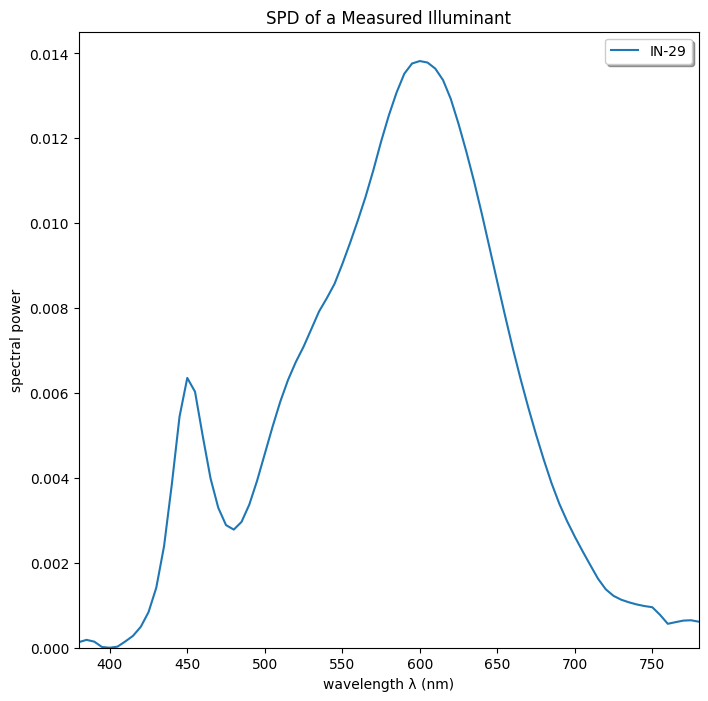

In [258]:
file_spd = ["res", "spd", "INDIGO-C7000-A_029_02°_3066K.csv"]
path_spd = os.path.join(*file_spd)

IN29 = MeasuredIlluminant(illuminant_name="IN-29", path_file=path_spd)

IN29.plot()

XYZ data (under SPD33)

In [259]:
CCDSG_XYZ_IN29 = CCDSG.to_ColourCheckerXYZ(illuminant=IN29, observer=2).as_pandas_dataframe()

In [260]:
CCC_XYZ_IN29 = CCC.to_ColourCheckerXYZ(illuminant=IN29, observer=2).as_pandas_dataframe()

In [261]:
XRCCPP_XYZ_IN29 = XRCCPP.to_ColourCheckerXYZ(illuminant=IN29, observer=2).as_pandas_dataframe()

In [262]:
SCK100_XYZ_IN29 = SCK100.to_ColourCheckerXYZ(illuminant=IN29, observer=2).as_pandas_dataframe()

## RawImage

### CCDSG

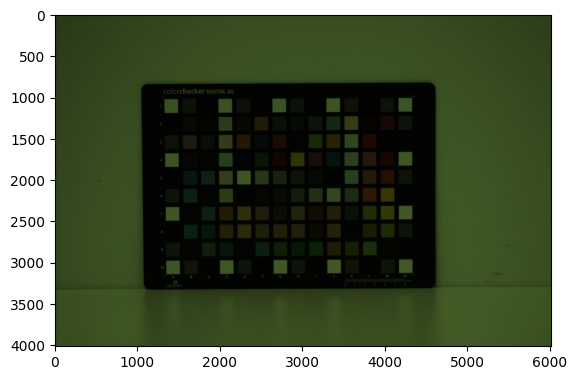

In [263]:
file_raw_0015i = ["data", "NikonD5600", "Indoor", "IN29", "INDIGO_2022-05-25_NikonD5600_0015.NEF"]
path_raw_0015i= os.path.join(*file_raw_0015i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [17, 30, 00]], "ColourChecker": "CCDSG", "Illuminant": IN29, "Observer":2}
image_0015i = RawImage(path_raw_0015i, metadata, method="postprocess")

image_0015i.show(method="matplotlib")

RAW RGB data extraction

In [264]:
has_colourchecker, corners, size_rect = image_0015i.automatic_colourchecker_extraction(checker_name="CCDSG", opencv_descriptor="SIFT")

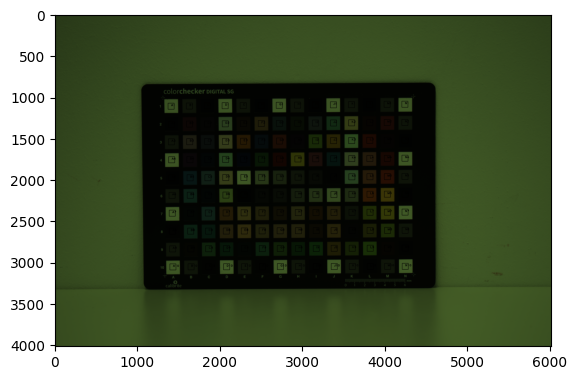

In [265]:
image_0015i.show_colourchecker(checker_name="CCDSG", show_image=True, method="matplotlib")

In [266]:
CCDSG_RGB_IN29 = image_0015i.get_ColourCheckerRGB("CCDSG").as_pandas_dataframe()

In [267]:
data_ccdsg_in29 = pd.merge(CCDSG_XYZ_IN29, CCDSG_RGB_IN29, on="patch_id")
data_ccdsg_in29.insert(0, "ColourChecker", "CCDSG")
data_ccdsg_in29

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCDSG,A1,MeasuredIlluminant object: Illuminant IN-29.,96.771572,90.822074,35.146865,MeasuredIlluminant object: Illuminant IN-29.,3671.539810,5113.107378,2196.021183
1,CCDSG,A2,MeasuredIlluminant object: Illuminant IN-29.,4.696973,4.393165,1.729254,MeasuredIlluminant object: Illuminant IN-29.,119.195763,161.563915,72.324324
2,CCDSG,A3,MeasuredIlluminant object: Illuminant IN-29.,23.559525,22.126330,8.669264,MeasuredIlluminant object: Illuminant IN-29.,870.909058,1215.164719,525.277210
3,CCDSG,A4,MeasuredIlluminant object: Illuminant IN-29.,95.624548,89.752257,34.799657,MeasuredIlluminant object: Illuminant IN-29.,3865.872169,5373.886048,2308.399196
4,CCDSG,A5,MeasuredIlluminant object: Illuminant IN-29.,4.679151,4.377760,1.725099,MeasuredIlluminant object: Illuminant IN-29.,123.818298,167.533966,74.696859
...,...,...,...,...,...,...,...,...,...,...
135,CCDSG,N6,MeasuredIlluminant object: Illuminant IN-29.,4.675006,4.374294,1.723640,MeasuredIlluminant object: Illuminant IN-29.,127.756757,169.596056,74.408327
136,CCDSG,N7,MeasuredIlluminant object: Illuminant IN-29.,96.145341,90.237786,34.976679,MeasuredIlluminant object: Illuminant IN-29.,4107.952155,5692.975164,2445.473338
137,CCDSG,N8,MeasuredIlluminant object: Illuminant IN-29.,23.629011,22.187937,8.680344,MeasuredIlluminant object: Illuminant IN-29.,958.291636,1327.678598,572.490321
138,CCDSG,N9,MeasuredIlluminant object: Illuminant IN-29.,4.648385,4.347814,1.708612,MeasuredIlluminant object: Illuminant IN-29.,151.329438,202.347334,88.252739


In [268]:
data_ccdsg_in29 = data_ccdsg_in29[(data_ccdsg_in29["patch_id"].str.contains("1")==False) & (data_ccdsg_in29["patch_id"].str.contains("0")==False) & (data_ccdsg_in29["patch_id"].str.contains("0")==False) & (data_ccdsg_in29["patch_id"].str.contains("A")==False) & (data_ccdsg_in29["patch_id"].str.contains("N")==False)]
data_ccdsg_in29

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant IN-29.,19.125010,11.908563,5.512490,MeasuredIlluminant object: Illuminant IN-29.,811.930241,415.956903,264.214755
12,CCDSG,B3,MeasuredIlluminant object: Illuminant IN-29.,42.864090,33.674957,18.235348,MeasuredIlluminant object: Illuminant IN-29.,1783.369430,1771.905953,1037.441381
13,CCDSG,B4,MeasuredIlluminant object: Illuminant IN-29.,15.248152,10.003906,9.838510,MeasuredIlluminant object: Illuminant IN-29.,589.871439,434.666180,456.861213
14,CCDSG,B5,MeasuredIlluminant object: Illuminant IN-29.,15.711591,17.511714,22.149210,MeasuredIlluminant object: Illuminant IN-29.,470.923302,1381.571950,1266.055515
15,CCDSG,B6,MeasuredIlluminant object: Illuminant IN-29.,22.640271,27.328599,20.701565,MeasuredIlluminant object: Illuminant IN-29.,760.954346,2073.843316,1334.413440
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant IN-29.,47.748179,28.131103,2.938529,MeasuredIlluminant object: Illuminant IN-29.,2464.387874,925.034332,204.811541
125,CCDSG,M6,MeasuredIlluminant object: Illuminant IN-29.,83.706188,69.124143,4.036143,MeasuredIlluminant object: Illuminant IN-29.,3766.982469,3408.863404,450.411980
126,CCDSG,M7,MeasuredIlluminant object: Illuminant IN-29.,74.260794,67.172312,3.355206,MeasuredIlluminant object: Illuminant IN-29.,3276.605551,3624.635500,456.963112
127,CCDSG,M8,MeasuredIlluminant object: Illuminant IN-29.,44.571362,46.376353,3.452198,MeasuredIlluminant object: Illuminant IN-29.,1800.759679,2734.371074,417.566107


In [269]:
data_in29.append(data_ccdsg_in29)

### WPP

White - E5

In [270]:
patch_max = find_patch_max_value(data_ccdsg_in29)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E5', 'E5', 'E5']
['E5', 'E5', 'E5']


In [271]:
data_ccdsg_in29 = apply_wpp(data_ccdsg_in29, "E5")
data_ccdsg_in29

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant IN-29.,0.197495,0.131045,0.156912,MeasuredIlluminant object: Illuminant IN-29.,0.203807,0.075179,0.111498
12,CCDSG,B3,MeasuredIlluminant object: Illuminant IN-29.,0.442636,0.370569,0.519067,MeasuredIlluminant object: Illuminant IN-29.,0.447654,0.320248,0.437799
13,CCDSG,B4,MeasuredIlluminant object: Illuminant IN-29.,0.157460,0.110086,0.280052,MeasuredIlluminant object: Illuminant IN-29.,0.148067,0.078560,0.192795
14,CCDSG,B5,MeasuredIlluminant object: Illuminant IN-29.,0.162246,0.192704,0.630475,MeasuredIlluminant object: Illuminant IN-29.,0.118209,0.249700,0.534274
15,CCDSG,B6,MeasuredIlluminant object: Illuminant IN-29.,0.233795,0.300732,0.589268,MeasuredIlluminant object: Illuminant IN-29.,0.191012,0.374819,0.563121
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant IN-29.,0.493072,0.309563,0.083645,MeasuredIlluminant object: Illuminant IN-29.,0.618600,0.167187,0.086430
125,CCDSG,M6,MeasuredIlluminant object: Illuminant IN-29.,0.864392,0.760662,0.114888,MeasuredIlluminant object: Illuminant IN-29.,0.945572,0.616105,0.190073
126,CCDSG,M7,MeasuredIlluminant object: Illuminant IN-29.,0.766854,0.739184,0.095506,MeasuredIlluminant object: Illuminant IN-29.,0.822480,0.655103,0.192838
127,CCDSG,M8,MeasuredIlluminant object: Illuminant IN-29.,0.460266,0.510339,0.098266,MeasuredIlluminant object: Illuminant IN-29.,0.452019,0.494200,0.176213


In [272]:
data_ccdsg_in29.describe()

,X,Y,Z,R,G,B
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000
mean,0.368324,0.351612,0.285931,0.372410,0.324313,0.286188
std,0.239178,0.228610,0.235033,0.258382,0.227333,0.227465
min,0.048201,0.048052,0.048955,0.030315,0.029147,0.029997
25%,0.157346,0.158608,0.098790,0.138771,0.126219,0.108903
50%,0.332618,0.325367,0.210468,0.351035,0.316410,0.213004
75%,0.511842,0.466904,0.414077,0.555619,0.429602,0.374968
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [273]:
data_wpp_in29.append(data_ccdsg_in29)

### CCC

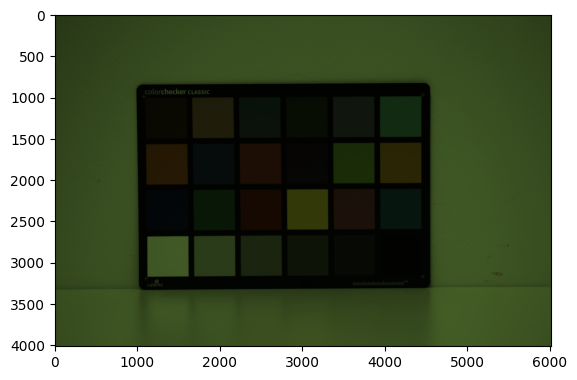

In [274]:
file_raw_0014i = ["data", "NikonD5600", "Indoor", "IN29", "INDIGO_2022-05-25_NikonD5600_0014.NEF"]
path_raw_0014i = os.path.join(*file_raw_0014i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [17, 30, 00]], "ColourChecker": "CCC", "Illuminant": IN29, "Observer":2}
image_0014i = RawImage(path_raw_0014i, metadata, method="postprocess")

image_0014i.show(method="matplotlib")

RAW RGB data extraction

In [275]:
has_colourchecker, corners, size_rect = image_0014i.automatic_colourchecker_extraction(checker_name="CCC", opencv_descriptor="SIFT")

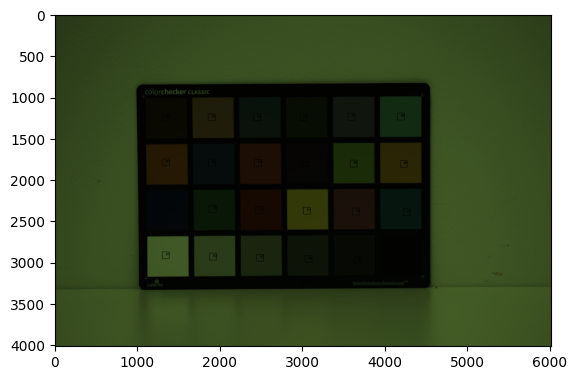

In [276]:
image_0014i.show_colourchecker(checker_name="CCC", show_image=True, method="matplotlib")

In [277]:
CCC_RGB_IN29 = image_0014i.get_ColourCheckerRGB("CCC").as_pandas_dataframe()

In [278]:
data_ccc_in29 = pd.merge(CCC_XYZ_IN29, CCC_RGB_IN29, on="patch_id")
data_ccc_in29.insert(0, "ColourChecker", "CCC")
data_ccc_in29

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant IN-29.,14.806400,11.957599,2.667352,MeasuredIlluminant object: Illuminant IN-29.,624.177154,585.542659,187.233418
1,CCC,A2,MeasuredIlluminant object: Illuminant IN-29.,46.651406,37.499539,9.363273,MeasuredIlluminant object: Illuminant IN-29.,1990.755102,1847.783730,652.022109
2,CCC,A3,MeasuredIlluminant object: Illuminant IN-29.,18.041452,17.936713,13.098833,MeasuredIlluminant object: Illuminant IN-29.,645.872024,1157.151927,736.564909
3,CCC,A4,MeasuredIlluminant object: Illuminant IN-29.,13.204606,14.034073,2.728836,MeasuredIlluminant object: Illuminant IN-29.,517.501984,848.452664,232.070862
4,CCC,A5,MeasuredIlluminant object: Illuminant IN-29.,26.106693,22.949491,16.610687,MeasuredIlluminant object: Illuminant IN-29.,1058.429705,1455.365930,949.031179
5,CCC,A6,MeasuredIlluminant object: Illuminant IN-29.,33.495393,40.002166,17.099758,MeasuredIlluminant object: Illuminant IN-29.,1199.446145,2729.972789,1190.548753
6,CCC,B1,MeasuredIlluminant object: Illuminant IN-29.,52.079236,37.922645,2.561303,MeasuredIlluminant object: Illuminant IN-29.,2361.886621,1604.238946,258.680839
7,CCC,B2,MeasuredIlluminant object: Illuminant IN-29.,11.521576,10.485721,14.869410,MeasuredIlluminant object: Illuminant IN-29.,416.925454,804.674320,784.395125
8,CCC,B3,MeasuredIlluminant object: Illuminant IN-29.,37.262736,23.390308,5.018661,MeasuredIlluminant object: Illuminant IN-29.,1829.853741,945.908163,335.984694
9,CCC,B4,MeasuredIlluminant object: Illuminant IN-29.,9.114046,6.651890,5.353359,MeasuredIlluminant object: Illuminant IN-29.,394.580215,384.417800,285.065476


In [279]:
data_in29.append(data_ccc_in29)

### WPP

White - D1

In [280]:
patch_max = find_patch_max_value(data_ccc_in29)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [281]:
data_ccc_in29 = apply_wpp(data_ccc_in29, "D1")
data_ccc_in29

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant IN-29.,0.150880,0.129816,0.075026,MeasuredIlluminant object: Illuminant IN-29.,0.152110,0.103621,0.078506
1,CCC,A2,MeasuredIlluminant object: Illuminant IN-29.,0.475388,0.407110,0.263366,MeasuredIlluminant object: Illuminant IN-29.,0.485140,0.326994,0.273388
2,CCC,A3,MeasuredIlluminant object: Illuminant IN-29.,0.183846,0.194728,0.368438,MeasuredIlluminant object: Illuminant IN-29.,0.157397,0.204776,0.308837
3,CCC,A4,MeasuredIlluminant object: Illuminant IN-29.,0.134558,0.152359,0.076756,MeasuredIlluminant object: Illuminant IN-29.,0.126113,0.150147,0.097306
4,CCC,A5,MeasuredIlluminant object: Illuminant IN-29.,0.266033,0.249149,0.467218,MeasuredIlluminant object: Illuminant IN-29.,0.257936,0.257550,0.397922
5,CCC,A6,MeasuredIlluminant object: Illuminant IN-29.,0.341325,0.434279,0.480975,MeasuredIlluminant object: Illuminant IN-29.,0.292301,0.483111,0.499189
6,CCC,B1,MeasuredIlluminant object: Illuminant IN-29.,0.530698,0.411703,0.072043,MeasuredIlluminant object: Illuminant IN-29.,0.575584,0.283895,0.108463
7,CCC,B2,MeasuredIlluminant object: Illuminant IN-29.,0.117407,0.113837,0.418241,MeasuredIlluminant object: Illuminant IN-29.,0.101603,0.142400,0.328891
8,CCC,B3,MeasuredIlluminant object: Illuminant IN-29.,0.379715,0.253934,0.141163,MeasuredIlluminant object: Illuminant IN-29.,0.445929,0.167393,0.140876
9,CCC,B4,MeasuredIlluminant object: Illuminant IN-29.,0.092874,0.072216,0.150577,MeasuredIlluminant object: Illuminant IN-29.,0.096158,0.068029,0.119526


In [282]:
data_ccc_in29.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.329394,0.313140,0.272234,0.336809,0.296485,0.275630
std,0.245112,0.238884,0.232182,0.256979,0.231300,0.218707
min,0.036863,0.036939,0.038539,0.042928,0.043049,0.044889
25%,0.133766,0.146724,0.103632,0.122678,0.133588,0.117386
50%,0.272135,0.244448,0.187653,0.275118,0.235356,0.227308
75%,0.442424,0.417347,0.419236,0.455732,0.420376,0.346149
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [283]:
data_wpp_in29.append(data_ccc_in29)

### XRCCPP

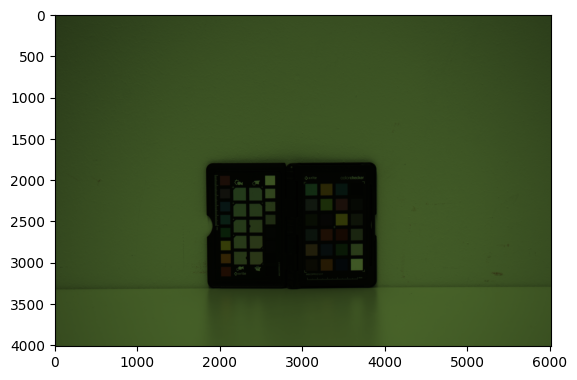

In [284]:
file_raw_0018i = ["data", "NikonD5600", "Indoor", "IN29", "INDIGO_2022-05-25_NikonD5600_0018.NEF"]
path_raw_0018i = os.path.join(*file_raw_0018i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [17, 30, 00]], "ColourChecker": "XRCCPP", "Illuminant": IN29, "Observer":2}
image_0018i = RawImage(path_raw_0018i, metadata, method="postprocess")

image_0018i.show(method="matplotlib")

RAW RGB data extraction

In [285]:
has_colourchecker, corners, size_rect = image_0018i.automatic_colourchecker_extraction(checker_name="XRCCPP_24", opencv_descriptor="SIFT")

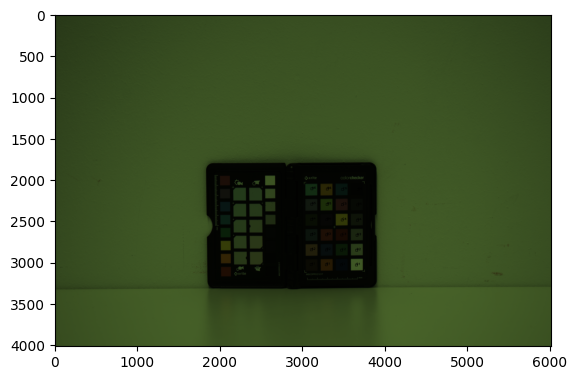

In [286]:
image_0018i.show_colourchecker(checker_name="XRCCPP", show_image=True, method="matplotlib")

In [287]:
XRCCPP_RGB_IN29 = image_0018i.get_ColourCheckerRGB("XRCCPP").as_pandas_dataframe()

In [288]:
data_xrccpp_in29 = pd.merge(XRCCPP_XYZ_IN29, XRCCPP_RGB_IN29, on="patch_id")
data_xrccpp_in29.insert(0, "ColourChecker", "XRCCPP")
data_xrccpp_in29

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant IN-29.,14.192137,11.543874,2.614388,MeasuredIlluminant object: Illuminant IN-29.,674.556213,647.745562,214.485207
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant IN-29.,44.735938,35.565487,8.831915,MeasuredIlluminant object: Illuminant IN-29.,2171.097633,1988.032544,723.940828
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant IN-29.,15.988685,15.872490,11.485769,MeasuredIlluminant object: Illuminant IN-29.,723.331361,1281.390533,813.556213
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant IN-29.,12.061703,12.767403,2.595309,MeasuredIlluminant object: Illuminant IN-29.,548.899408,890.754438,254.751479
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant IN-29.,22.659072,20.181992,14.285994,MeasuredIlluminant object: Illuminant IN-29.,1099.483728,1553.187870,1008.579882
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant IN-29.,31.334684,37.780145,16.433714,MeasuredIlluminant object: Illuminant IN-29.,1222.088757,2831.991124,1264.174556
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant IN-29.,48.582606,35.522919,2.480297,MeasuredIlluminant object: Illuminant IN-29.,2429.500000,1668.896450,279.485207
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant IN-29.,11.342913,10.309104,14.278436,MeasuredIlluminant object: Illuminant IN-29.,459.517751,877.775148,853.113905
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant IN-29.,35.529684,22.256532,4.835478,MeasuredIlluminant object: Illuminant IN-29.,1897.094675,974.532544,356.745562
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant IN-29.,8.576615,6.332388,5.068617,MeasuredIlluminant object: Illuminant IN-29.,424.908284,433.343195,321.739645


In [289]:
data_in29.append(data_xrccpp_in29)

### WPP

White - D1

In [290]:
patch_max = find_patch_max_value(data_xrccpp_in29)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [291]:
data_xrccpp_in29 = apply_wpp(data_xrccpp_in29, "D1")
data_xrccpp_in29

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant IN-29.,0.165415,0.143293,0.085442,MeasuredIlluminant object: Illuminant IN-29.,0.165860,0.115063,0.089068
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant IN-29.,0.521415,0.441472,0.288641,MeasuredIlluminant object: Illuminant IN-29.,0.533830,0.353146,0.300626
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant IN-29.,0.186354,0.197024,0.375374,MeasuredIlluminant object: Illuminant IN-29.,0.177853,0.227621,0.337840
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant IN-29.,0.140584,0.158481,0.084819,MeasuredIlluminant object: Illuminant IN-29.,0.134964,0.158230,0.105789
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant IN-29.,0.264100,0.250518,0.466890,MeasuredIlluminant object: Illuminant IN-29.,0.270341,0.275902,0.418826
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant IN-29.,0.365218,0.468962,0.537081,MeasuredIlluminant object: Illuminant IN-29.,0.300487,0.503063,0.524965
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant IN-29.,0.566249,0.440943,0.081060,MeasuredIlluminant object: Illuminant IN-29.,0.597366,0.296456,0.116060
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant IN-29.,0.132206,0.127966,0.466643,MeasuredIlluminant object: Illuminant IN-29.,0.112986,0.155924,0.354266
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant IN-29.,0.414112,0.276269,0.158031,MeasuredIlluminant object: Illuminant IN-29.,0.466458,0.173112,0.148143
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant IN-29.,0.099964,0.078603,0.165651,MeasuredIlluminant object: Illuminant IN-29.,0.104477,0.076977,0.133606


In [292]:
data_xrccpp_in29.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.342488,0.325454,0.286032,0.347387,0.306194,0.286741
std,0.248318,0.241311,0.237762,0.258319,0.231587,0.218954
min,0.041064,0.041292,0.045024,0.043219,0.043854,0.046900
25%,0.140418,0.154684,0.105866,0.129469,0.145709,0.129220
50%,0.278902,0.252337,0.204691,0.285414,0.237541,0.236744
75%,0.461866,0.448344,0.444698,0.483301,0.431398,0.369139
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [293]:
data_wpp_in29.append(data_xrccpp_in29)

### SCK100

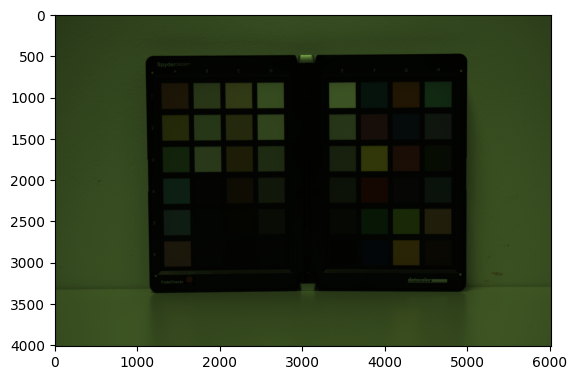

In [294]:
file_raw_0016i = ["data", "NikonD5600", "Indoor", "IN29", "INDIGO_2022-05-25_NikonD5600_0016.NEF"]
path_raw_0016i = os.path.join(*file_raw_0016i)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 25], [17, 30, 00]], "ColourChecker": "SCK100", "Illuminant": IN29, "Observer":2}
image_0016i = RawImage(path_raw_0016i, metadata, method="postprocess")

image_0016i.show(method="matplotlib")

RAW RGB data extraction

In [295]:
has_colourchecker, corners, size_rect = image_0016i.automatic_colourchecker_extraction(checker_name="SCK100_48", opencv_descriptor="SIFT")

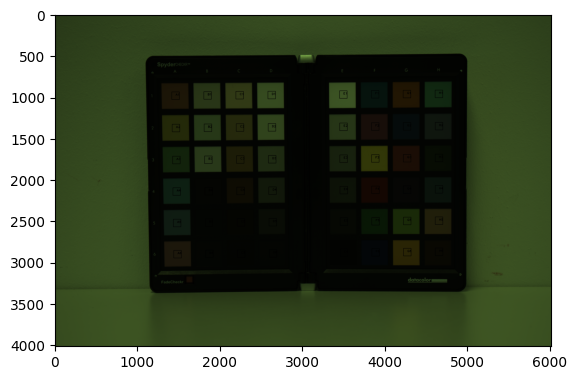

In [296]:
image_0016i.show_colourchecker(checker_name="SCK100", show_image=True, method="matplotlib")

In [297]:
SCK100_RGB_IN29 = image_0016i.get_ColourCheckerRGB("SCK100").as_pandas_dataframe()

In [298]:
data_sck100_in29 = pd.merge(SCK100_XYZ_IN29, SCK100_RGB_IN29, on="patch_id")
data_sck100_in29.insert(0, "ColourChecker", "SCK100")
data_sck100_in29

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant IN-29.,44.136999,32.656065,7.636606,MeasuredIlluminant object: Illuminant IN-29.,1812.261815,1403.986767,476.328922
1,SCK100,A2,MeasuredIlluminant object: Illuminant IN-29.,57.038045,51.447462,6.529875,MeasuredIlluminant object: Illuminant IN-29.,2290.600189,2633.697779,579.512051
2,SCK100,A3,MeasuredIlluminant object: Illuminant IN-29.,30.433177,34.384998,8.534928,MeasuredIlluminant object: Illuminant IN-29.,1162.636342,2223.377836,720.644140
3,SCK100,A4,MeasuredIlluminant object: Illuminant IN-29.,24.033491,27.413348,18.305585,MeasuredIlluminant object: Illuminant IN-29.,872.520794,2007.933483,1186.274102
4,SCK100,A5,MeasuredIlluminant object: Illuminant IN-29.,25.961816,25.708576,19.846792,MeasuredIlluminant object: Illuminant IN-29.,1006.921078,1818.397448,1212.609168
5,SCK100,A6,MeasuredIlluminant object: Illuminant IN-29.,39.776909,29.428881,12.221297,MeasuredIlluminant object: Illuminant IN-29.,1800.329868,1493.508388,743.965855
6,SCK100,B1,MeasuredIlluminant object: Illuminant IN-29.,66.102013,60.603236,22.963392,MeasuredIlluminant object: Illuminant IN-29.,2582.203095,3416.822306,1471.901938
7,SCK100,B2,MeasuredIlluminant object: Illuminant IN-29.,62.326152,59.713883,22.532121,MeasuredIlluminant object: Illuminant IN-29.,2441.624527,3552.408318,1494.093100
8,SCK100,B3,MeasuredIlluminant object: Illuminant IN-29.,64.214210,59.872026,24.843212,MeasuredIlluminant object: Illuminant IN-29.,2610.232278,3640.656427,1648.560019
9,SCK100,B4,MeasuredIlluminant object: Illuminant IN-29.,6.799346,5.936072,2.139806,MeasuredIlluminant object: Illuminant IN-29.,283.297023,331.245983,142.070888


In [299]:
data_in29.append(data_sck100_in29)

### WPP

White - E1

In [300]:
patch_max = find_patch_max_value(data_sck100_in29)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E1', 'E1', 'E1']
['E1', 'E1', 'E1']


In [301]:
data_sck100_in29 = apply_wpp(data_sck100_in29, "E1")
data_sck100_in29

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant IN-29.,0.461077,0.364363,0.219887,MeasuredIlluminant object: Illuminant IN-29.,0.475043,0.264791,0.206788
1,SCK100,A2,MeasuredIlluminant object: Illuminant IN-29.,0.595848,0.574030,0.188020,MeasuredIlluminant object: Illuminant IN-29.,0.600428,0.496714,0.251582
2,SCK100,A3,MeasuredIlluminant object: Illuminant IN-29.,0.317920,0.383654,0.245753,MeasuredIlluminant object: Illuminant IN-29.,0.304758,0.419328,0.312852
3,SCK100,A4,MeasuredIlluminant object: Illuminant IN-29.,0.251066,0.305867,0.527087,MeasuredIlluminant object: Illuminant IN-29.,0.228711,0.378695,0.514995
4,SCK100,A5,MeasuredIlluminant object: Illuminant IN-29.,0.271210,0.286846,0.571464,MeasuredIlluminant object: Illuminant IN-29.,0.263941,0.342949,0.526427
5,SCK100,A6,MeasuredIlluminant object: Illuminant IN-29.,0.415529,0.328356,0.351897,MeasuredIlluminant object: Illuminant IN-29.,0.471915,0.281675,0.322976
6,SCK100,B1,MeasuredIlluminant object: Illuminant IN-29.,0.690534,0.676187,0.661203,MeasuredIlluminant object: Illuminant IN-29.,0.676865,0.644411,0.638994
7,SCK100,B2,MeasuredIlluminant object: Illuminant IN-29.,0.651090,0.666264,0.648785,MeasuredIlluminant object: Illuminant IN-29.,0.640015,0.669983,0.648627
8,SCK100,B3,MeasuredIlluminant object: Illuminant IN-29.,0.670813,0.668028,0.715330,MeasuredIlluminant object: Illuminant IN-29.,0.684212,0.686626,0.715686
9,SCK100,B4,MeasuredIlluminant object: Illuminant IN-29.,0.071029,0.066232,0.061613,MeasuredIlluminant object: Illuminant IN-29.,0.074260,0.062473,0.061677


In [302]:
data_sck100_in29.describe()

,X,Y,Z,R,G,B
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,0.358844,0.345976,0.304458,0.370220,0.335177,0.310842
std,0.259319,0.253648,0.249526,0.268327,0.248256,0.241353
min,0.046778,0.046988,0.048292,0.045753,0.045690,0.046315
25%,0.124794,0.137797,0.085934,0.114928,0.132205,0.099716
50%,0.301297,0.286016,0.232820,0.298730,0.273863,0.243783
75%,0.525907,0.516426,0.458729,0.566983,0.495941,0.428103
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [303]:
data_wpp_in29.append(data_sck100_in29)

## Merge data

In [304]:
data_pd_in29 = pd.concat(data_in29, ignore_index=True)

data_pd_in29 = data_pd_in29.drop(columns="illuminant_y")
data_pd_in29 = data_pd_in29.rename(columns={"illuminant_x":"illuminant"})
data_pd_in29["illuminant"] = "IN-29" # as str to avoid error
data_pd_in29

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,IN-29,19.125010,11.908563,5.512490,811.930241,415.956903,264.214755
1,CCDSG,B3,IN-29,42.864090,33.674957,18.235348,1783.369430,1771.905953,1037.441381
2,CCDSG,B4,IN-29,15.248152,10.003906,9.838510,589.871439,434.666180,456.861213
3,CCDSG,B5,IN-29,15.711591,17.511714,22.149210,470.923302,1381.571950,1266.055515
4,CCDSG,B6,IN-29,22.640271,27.328599,20.701565,760.954346,2073.843316,1334.413440
...,...,...,...,...,...,...,...,...,...
187,SCK100,H2,IN-29,25.439134,22.750442,16.245828,991.340737,1419.836957,942.972590
188,SCK100,H3,IN-29,11.964794,12.912605,2.648403,451.270085,773.435255,213.135633
189,SCK100,H4,IN-29,17.235361,17.483403,12.528184,641.119565,1202.339083,758.483696
190,SCK100,H5,IN-29,45.344168,36.709529,9.074844,2072.528828,1965.924858,694.983459


In [305]:
data_pd_wpp_in29 = pd.concat(data_wpp_in29, ignore_index=True)

data_pd_wpp_in29 = data_pd_wpp_in29.drop(columns="illuminant_y")
data_pd_wpp_in29 = data_pd_wpp_in29.rename(columns={"illuminant_x":"illuminant"})
data_pd_wpp_in29["illuminant"] = "IN-29" # as str to avoid error
data_pd_wpp_in29

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,IN-29,0.197495,0.131045,0.156912,0.203807,0.075179,0.111498
1,CCDSG,B3,IN-29,0.442636,0.370569,0.519067,0.447654,0.320248,0.437799
2,CCDSG,B4,IN-29,0.157460,0.110086,0.280052,0.148067,0.078560,0.192795
3,CCDSG,B5,IN-29,0.162246,0.192704,0.630475,0.118209,0.249700,0.534274
4,CCDSG,B6,IN-29,0.233795,0.300732,0.589268,0.191012,0.374819,0.563121
...,...,...,...,...,...,...,...,...,...
187,SCK100,H2,IN-29,0.265750,0.253840,0.467779,0.259857,0.267781,0.409371
188,SCK100,H3,IN-29,0.124990,0.144074,0.076258,0.118290,0.145870,0.092528
189,SCK100,H4,IN-29,0.180049,0.195073,0.360734,0.168055,0.226761,0.329279
190,SCK100,H5,IN-29,0.473688,0.409590,0.261299,0.543266,0.370773,0.301712


## Outdoor

In [306]:
data_out38 = []
data_wpp_out38 = []

## OUT-38

| Image                                 |  Illuminant   | ColourChecker                        | Patches |
|---------------------------------------|---------------|--------------------------------------|---------|
| INDIGO_2022-05-26_NikonD5600_0028.NEF | OUT-38-5557ºK | CCDSG  - Calibrite DIGITAL SG        | 96      |
| INDIGO_2022-05-26_NikonD5600_0027.NEF | OUT-38-5557ºK | CCC - Calibrite Classic              | 24      |
| INDIGO_2022-05-26_NikonD5600_0031.NEF | OUT-38-5557ºK | XRCCPP - X-rite PASSPORT PHOTO       | 24      |
| INDIGO_2022-05-26_NikonD5600_0029.NEF | OUT-38-5557ºK | SCK100 - SpyderCHECKR                | 48      |

<img src="res/screenshot/NikonD5600/OUT38/INDIGO_2022-05-26_NikonD5600_0028.jpg" width="500">
<img src="res/screenshot/NikonD5600/OUT38/INDIGO_2022-05-26_NikonD5600_0027.jpg" width="500">
<img src="res/screenshot/NikonD5600/OUT38/INDIGO_2022-05-26_NikonD5600_0031.jpg" width="500">
<img src="res/screenshot/NikonD5600/OUT38/INDIGO_2022-05-26_NikonD5600_0029.jpg" width="500">

## SPD Illuminant

OUT-38

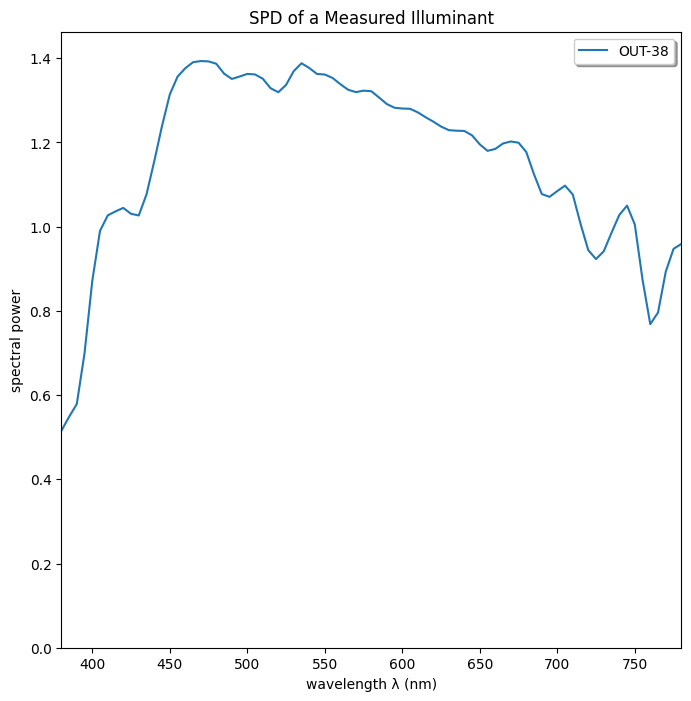

In [307]:
file_spd = ["res", "spd", "INDIGO-C7000-A_038_02°_5557K.csv"]
path_spd = os.path.join(*file_spd)

OUT38 = MeasuredIlluminant(illuminant_name="OUT-38", path_file=path_spd)

OUT38.plot()

XYZ data (under SPD38)

In [308]:
CCDSG_XYZ_OUT38 = CCDSG.to_ColourCheckerXYZ(illuminant=OUT38, observer=2).as_pandas_dataframe()

In [309]:
CCC_XYZ_OUT38 = CCC.to_ColourCheckerXYZ(illuminant=OUT38, observer=2).as_pandas_dataframe()

In [310]:
XRCCPP_XYZ_OUT38 = XRCCPP.to_ColourCheckerXYZ(illuminant=OUT38, observer=2).as_pandas_dataframe()

In [311]:
SCK100_XYZ_OUT38 = SCK100.to_ColourCheckerXYZ(illuminant=OUT38, observer=2).as_pandas_dataframe()

## RawImage

### CCDSG

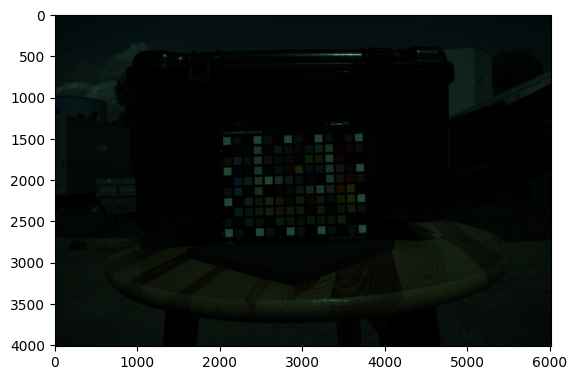

In [312]:
file_raw_0028o = ["data", "NikonD5600", "Outdoor", "OUT38", "INDIGO_2022-05-26_NikonD5600_0028.NEF"]
path_raw_0028o= os.path.join(*file_raw_0028o)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 26], [14, 15, 00]], "ColourChecker": "CCDSG", "Illuminant": OUT38, "Observer":2}
image_0028o = RawImage(path_raw_0028o, metadata, method="postprocess")

image_0028o.show(method="matplotlib")

RAW RGB data extraction

In [313]:
has_colourchecker, corners, size_rect = image_0028o.automatic_colourchecker_extraction(checker_name="CCDSG", opencv_descriptor="SIFT")

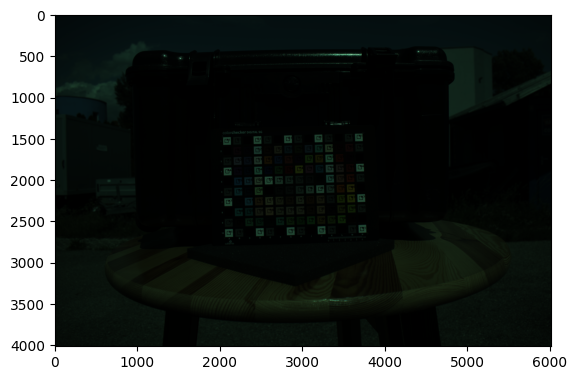

In [314]:
image_0028o.show_colourchecker(checker_name="CCDSG", show_image=True, method="matplotlib")

In [315]:
CCDSG_RGB_OUT38 = image_0028o.get_ColourCheckerRGB("CCDSG").as_pandas_dataframe()

In [316]:
data_ccdsg_out38 = pd.merge(CCDSG_XYZ_OUT38, CCDSG_RGB_OUT38, on="patch_id")
data_ccdsg_out38.insert(0, "ColourChecker", "CCDSG")
data_ccdsg_out38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCDSG,A1,MeasuredIlluminant object: Illuminant OUT-38.,87.300586,90.859164,85.223169,MeasuredIlluminant object: Illuminant OUT-38.,2048.979592,4264.167800,3089.804989
1,CCDSG,A2,MeasuredIlluminant object: Illuminant OUT-38.,4.253752,4.393613,4.236990,MeasuredIlluminant object: Illuminant OUT-38.,23.937642,46.832200,35.418367
2,CCDSG,A3,MeasuredIlluminant object: Illuminant OUT-38.,21.267657,22.091132,21.075288,MeasuredIlluminant object: Illuminant OUT-38.,451.859410,932.863946,673.494331
3,CCDSG,A4,MeasuredIlluminant object: Illuminant OUT-38.,86.287721,89.800334,84.392373,MeasuredIlluminant object: Illuminant OUT-38.,2132.523810,4409.520408,3182.757370
4,CCDSG,A5,MeasuredIlluminant object: Illuminant OUT-38.,4.238284,4.378805,4.226200,MeasuredIlluminant object: Illuminant OUT-38.,23.164399,44.640023,33.671769
...,...,...,...,...,...,...,...,...,...,...
135,CCDSG,N6,MeasuredIlluminant object: Illuminant OUT-38.,4.234712,4.375731,4.223337,MeasuredIlluminant object: Illuminant OUT-38.,27.450113,51.443311,38.770975
136,CCDSG,N7,MeasuredIlluminant object: Illuminant OUT-38.,86.752339,90.284485,84.802768,MeasuredIlluminant object: Illuminant OUT-38.,2254.482993,4609.961451,3303.151927
137,CCDSG,N8,MeasuredIlluminant object: Illuminant OUT-38.,21.325868,22.150208,21.100860,MeasuredIlluminant object: Illuminant OUT-38.,483.750567,988.136054,707.038549
138,CCDSG,N9,MeasuredIlluminant object: Illuminant OUT-38.,4.208917,4.348210,4.186358,MeasuredIlluminant object: Illuminant OUT-38.,28.453515,51.920068,36.846372


In [317]:
data_ccdsg_out38 = data_ccdsg_out38[(data_ccdsg_out38["patch_id"].str.contains("1")==False) & (data_ccdsg_out38["patch_id"].str.contains("0")==False) & (data_ccdsg_out38["patch_id"].str.contains("0")==False) & (data_ccdsg_out38["patch_id"].str.contains("A")==False) & (data_ccdsg_out38["patch_id"].str.contains("N")==False)]
data_ccdsg_out38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant OUT-38.,17.019386,10.871192,14.000805,MeasuredIlluminant object: Illuminant OUT-38.,419.207483,260.759637,323.977324
12,CCDSG,B3,MeasuredIlluminant object: Illuminant OUT-38.,39.099460,32.775758,44.825191,MeasuredIlluminant object: Illuminant OUT-38.,963.408163,1444.553288,1436.700680
13,CCDSG,B4,MeasuredIlluminant object: Illuminant OUT-38.,15.293600,9.750916,24.760794,MeasuredIlluminant object: Illuminant OUT-38.,299.311791,320.168934,601.224490
14,CCDSG,B5,MeasuredIlluminant object: Illuminant OUT-38.,18.983367,21.458387,53.076720,MeasuredIlluminant object: Illuminant OUT-38.,285.736961,1379.052154,1795.023810
15,CCDSG,B6,MeasuredIlluminant object: Illuminant OUT-38.,24.444401,31.933887,50.187256,MeasuredIlluminant object: Illuminant OUT-38.,443.570295,1921.020408,1854.829932
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant OUT-38.,37.788664,22.981807,7.227809,MeasuredIlluminant object: Illuminant OUT-38.,1258.498866,501.716553,198.977324
125,CCDSG,M6,MeasuredIlluminant object: Illuminant OUT-38.,67.116006,60.837795,9.551035,MeasuredIlluminant object: Illuminant OUT-38.,1927.399660,2138.036848,434.016440
126,CCDSG,M7,MeasuredIlluminant object: Illuminant OUT-38.,60.092033,61.398777,7.500841,MeasuredIlluminant object: Illuminant OUT-38.,1677.137755,2336.275510,383.234694
127,CCDSG,M8,MeasuredIlluminant object: Illuminant OUT-38.,36.953162,44.348139,7.899924,MeasuredIlluminant object: Illuminant OUT-38.,897.945011,1821.905896,375.087868


In [318]:
data_out38.append(data_ccdsg_out38)

### WPP

White - E5

In [319]:
patch_max = find_patch_max_value(data_ccdsg_out38)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E5', 'E5', 'E5']
['E5', 'E5', 'E5']


In [320]:
data_ccdsg_out38 = apply_wpp(data_ccdsg_out38, "E5")
data_ccdsg_out38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
11,CCDSG,B2,MeasuredIlluminant object: Illuminant OUT-38.,0.194845,0.119592,0.164366,MeasuredIlluminant object: Illuminant OUT-38.,0.195639,0.058829,0.101226
12,CCDSG,B3,MeasuredIlluminant object: Illuminant OUT-38.,0.447627,0.360561,0.526236,MeasuredIlluminant object: Illuminant OUT-38.,0.449610,0.325900,0.448893
13,CCDSG,B4,MeasuredIlluminant object: Illuminant OUT-38.,0.175087,0.107268,0.290685,MeasuredIlluminant object: Illuminant OUT-38.,0.139685,0.072232,0.187851
14,CCDSG,B5,MeasuredIlluminant object: Illuminant OUT-38.,0.217329,0.236061,0.623106,MeasuredIlluminant object: Illuminant OUT-38.,0.133350,0.311122,0.560850
15,CCDSG,B6,MeasuredIlluminant object: Illuminant OUT-38.,0.279850,0.351300,0.589185,MeasuredIlluminant object: Illuminant OUT-38.,0.207009,0.433393,0.579537
...,...,...,...,...,...,...,...,...,...,...
124,CCDSG,M5,MeasuredIlluminant object: Illuminant OUT-38.,0.432620,0.252820,0.084853,MeasuredIlluminant object: Illuminant OUT-38.,0.587326,0.113190,0.062170
125,CCDSG,M6,MeasuredIlluminant object: Illuminant OUT-38.,0.768372,0.669268,0.112127,MeasuredIlluminant object: Illuminant OUT-38.,0.899493,0.482354,0.135607
126,CCDSG,M7,MeasuredIlluminant object: Illuminant OUT-38.,0.687958,0.675439,0.088058,MeasuredIlluminant object: Illuminant OUT-38.,0.782699,0.527077,0.119741
127,CCDSG,M8,MeasuredIlluminant object: Illuminant OUT-38.,0.423055,0.487867,0.092743,MeasuredIlluminant object: Illuminant OUT-38.,0.419060,0.411033,0.117195


In [321]:
data_ccdsg_out38.describe()

,X,Y,Z,R,G,B
count,96.000000,96.000000,96.000000,96.000000,96.000000,96.000000
mean,0.357907,0.343665,0.286503,0.355839,0.300974,0.267928
std,0.224927,0.221862,0.235864,0.254282,0.226393,0.238155
min,0.048401,0.048049,0.049471,0.011646,0.010657,0.011159
25%,0.163854,0.160395,0.098232,0.128934,0.109273,0.088275
50%,0.332046,0.349066,0.212210,0.339994,0.281167,0.190075
75%,0.469160,0.464864,0.414163,0.533425,0.411214,0.375259
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [322]:
data_wpp_out38.append(data_ccdsg_out38)

### CCC

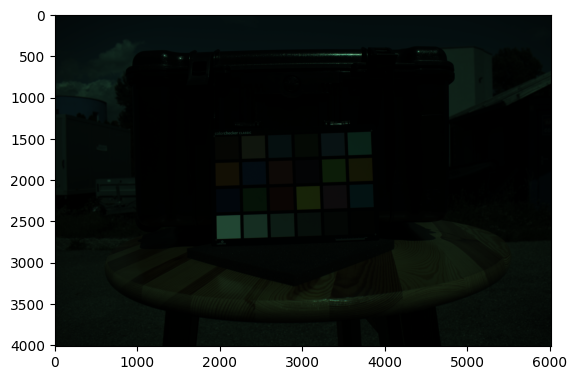

In [323]:
file_raw_0027o = ["data", "NikonD5600", "Outdoor", "OUT38", "INDIGO_2022-05-26_NikonD5600_0027.NEF"]
path_raw_0027o = os.path.join(*file_raw_0027o)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 26], [14, 15, 00]], "ColourChecker": "CCC", "Illuminant": OUT38, "Observer":2}
image_0027o = RawImage(path_raw_0027o, metadata, method="postprocess")

image_0027o.show(method="matplotlib")

RAW RGB data extraction

In [324]:
has_colourchecker, corners, size_rect = image_0027o.automatic_colourchecker_extraction(checker_name="CCC", opencv_descriptor="SIFT")

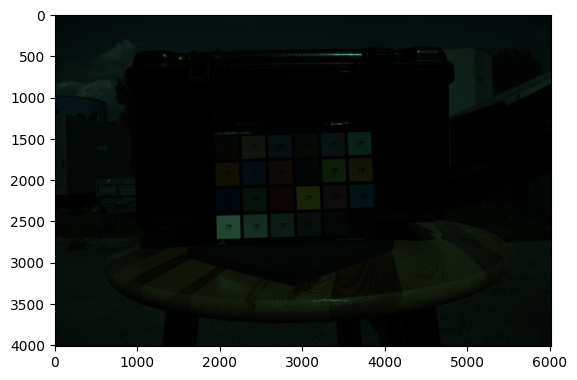

In [325]:
image_0027o.show_colourchecker(checker_name="CCC", show_image=True, method="matplotlib")

In [326]:
CCC_RGB_OUT38 = image_0027o.get_ColourCheckerRGB("CCC").as_pandas_dataframe()

In [327]:
data_ccc_out38 = pd.merge(CCC_XYZ_OUT38, CCC_RGB_OUT38, on="patch_id")
data_ccc_out38.insert(0, "ColourChecker", "CCC")
data_ccc_out38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant OUT-38.,12.369534,11.020969,6.523938,MeasuredIlluminant object: Illuminant OUT-38.,326.907372,433.638941,252.633270
1,CCC,A2,MeasuredIlluminant object: Illuminant OUT-38.,39.333099,35.619342,22.849698,MeasuredIlluminant object: Illuminant OUT-38.,1020.068053,1391.943289,852.931947
2,CCC,A3,MeasuredIlluminant object: Illuminant OUT-38.,18.254646,19.353197,31.651975,MeasuredIlluminant object: Illuminant OUT-38.,349.684310,990.247637,995.217391
3,CCC,A4,MeasuredIlluminant object: Illuminant OUT-38.,11.508979,14.068016,6.585266,MeasuredIlluminant object: Illuminant OUT-38.,262.157372,612.091682,285.316163
4,CCC,A5,MeasuredIlluminant object: Illuminant OUT-38.,26.003395,24.310787,40.753356,MeasuredIlluminant object: Illuminant OUT-38.,562.900756,1209.754253,1250.833648
5,CCC,A6,MeasuredIlluminant object: Illuminant OUT-38.,32.225671,43.617186,41.545436,MeasuredIlluminant object: Illuminant OUT-38.,616.227788,2105.094991,1478.327977
6,CCC,B1,MeasuredIlluminant object: Illuminant OUT-38.,40.977732,32.096532,6.122255,MeasuredIlluminant object: Illuminant OUT-38.,1184.061437,1002.174858,293.737713
7,CCC,B2,MeasuredIlluminant object: Illuminant OUT-38.,13.600697,12.006271,36.093387,MeasuredIlluminant object: Illuminant OUT-38.,245.862004,768.676749,1103.122873
8,CCC,B3,MeasuredIlluminant object: Illuminant OUT-38.,30.263797,20.064841,12.397939,MeasuredIlluminant object: Illuminant OUT-38.,882.534972,631.457467,426.905482
9,CCC,B4,MeasuredIlluminant object: Illuminant OUT-38.,9.154945,6.766146,13.402739,MeasuredIlluminant object: Illuminant OUT-38.,209.551040,310.623819,370.958412


In [328]:
data_out38.append(data_ccc_out38)

### WPP

White - D1

In [329]:
patch_max = find_patch_max_value(data_ccc_out38)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [330]:
data_ccc_out38 = apply_wpp(data_ccc_out38, "D1")
data_ccc_out38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,CCC,A1,MeasuredIlluminant object: Illuminant OUT-38.,0.139754,0.119620,0.075666,MeasuredIlluminant object: Illuminant OUT-38.,0.151904,0.096638,0.077461
1,CCC,A2,MeasuredIlluminant object: Illuminant OUT-38.,0.444394,0.386607,0.265015,MeasuredIlluminant object: Illuminant OUT-38.,0.473995,0.310199,0.261523
2,CCC,A3,MeasuredIlluminant object: Illuminant OUT-38.,0.206245,0.210057,0.367105,MeasuredIlluminant object: Illuminant OUT-38.,0.162488,0.220680,0.305150
3,CCC,A4,MeasuredIlluminant object: Illuminant OUT-38.,0.130031,0.152692,0.076377,MeasuredIlluminant object: Illuminant OUT-38.,0.121817,0.136407,0.087483
4,CCC,A5,MeasuredIlluminant object: Illuminant OUT-38.,0.293792,0.263866,0.472665,MeasuredIlluminant object: Illuminant OUT-38.,0.261563,0.269597,0.383526
5,CCC,A6,MeasuredIlluminant object: Illuminant OUT-38.,0.364092,0.473415,0.481851,MeasuredIlluminant object: Illuminant OUT-38.,0.286342,0.469127,0.453279
6,CCC,B1,MeasuredIlluminant object: Illuminant OUT-38.,0.462975,0.348371,0.071007,MeasuredIlluminant object: Illuminant OUT-38.,0.550197,0.223338,0.090065
7,CCC,B2,MeasuredIlluminant object: Illuminant OUT-38.,0.153664,0.130314,0.418617,MeasuredIlluminant object: Illuminant OUT-38.,0.114245,0.171302,0.338235
8,CCC,B3,MeasuredIlluminant object: Illuminant OUT-38.,0.341927,0.217781,0.143793,MeasuredIlluminant object: Illuminant OUT-38.,0.410087,0.140722,0.130896
9,CCC,B4,MeasuredIlluminant object: Illuminant OUT-38.,0.103435,0.073439,0.155447,MeasuredIlluminant object: Illuminant OUT-38.,0.097372,0.069223,0.113742


In [331]:
data_ccc_out38.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.322453,0.307607,0.272468,0.318157,0.273457,0.255246
std,0.229086,0.231937,0.233124,0.241777,0.217889,0.219524
min,0.037148,0.037043,0.038933,0.036811,0.036186,0.036495
25%,0.150186,0.142180,0.097203,0.119924,0.126472,0.099223
50%,0.272083,0.222341,0.190531,0.273953,0.222009,0.184890
75%,0.418301,0.426635,0.419191,0.426064,0.330145,0.346770
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [332]:
data_wpp_out38.append(data_ccc_out38)

### XRCCPP

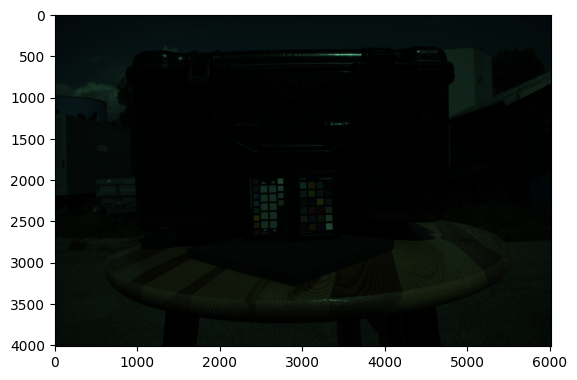

In [333]:
file_raw_0031o = ["data", "NikonD5600", "Outdoor", "OUT38", "INDIGO_2022-05-26_NikonD5600_0031.NEF"]
path_raw_0031o = os.path.join(*file_raw_0031o)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 26], [14, 15, 00]], "ColourChecker": "XRCCPP", "Illuminant": OUT38, "Observer":2}
image_0031o = RawImage(path_raw_0031o, metadata, method="postprocess")

image_0031o.show(method="matplotlib")

RAW RGB data extraction

In [334]:
has_colourchecker, corners, size_rect = image_0031o.automatic_colourchecker_extraction(checker_name="XRCCPP_24", opencv_descriptor="SIFT")

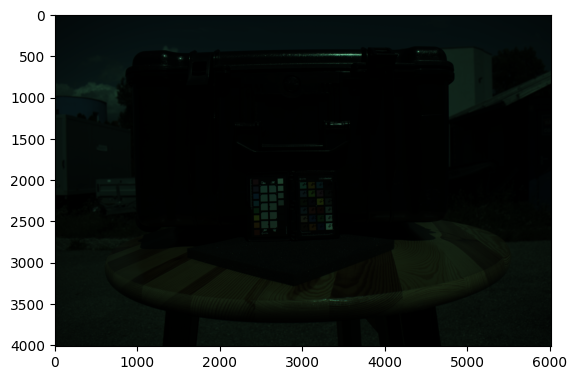

In [335]:
image_0031o.show_colourchecker(checker_name="XRCCPP", show_image=True, method="matplotlib")

In [336]:
XRCCPP_RGB_OUT38 = image_0031o.get_ColourCheckerRGB("XRCCPP").as_pandas_dataframe()

In [337]:
data_xrccpp_out38 = pd.merge(XRCCPP_XYZ_OUT38, XRCCPP_RGB_OUT38, on="patch_id")
data_xrccpp_out38.insert(0, "ColourChecker", "XRCCPP")
data_xrccpp_out38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant OUT-38.,11.891077,10.661176,6.390290,MeasuredIlluminant object: Illuminant OUT-38.,325.086735,444.255102,261.826531
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant OUT-38.,37.583495,33.737426,21.502524,MeasuredIlluminant object: Illuminant OUT-38.,1090.836735,1481.204082,933.857143
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant OUT-38.,16.155317,17.097936,27.811143,MeasuredIlluminant object: Illuminant OUT-38.,388.755102,1085.000000,1095.163265
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant OUT-38.,10.556210,12.861564,6.283393,MeasuredIlluminant object: Illuminant OUT-38.,279.142857,653.816327,303.112245
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant OUT-38.,22.403080,21.154695,34.993859,MeasuredIlluminant object: Illuminant OUT-38.,604.428571,1334.693878,1372.530612
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant OUT-38.,30.284882,41.298538,39.811491,MeasuredIlluminant object: Illuminant OUT-38.,681.938776,2366.530612,1677.418367
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant OUT-38.,38.245198,30.128705,5.931726,MeasuredIlluminant object: Illuminant OUT-38.,1170.326531,1014.887755,307.500000
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant OUT-38.,13.271713,11.802434,34.482086,MeasuredIlluminant object: Illuminant OUT-38.,262.918367,825.989796,1181.918367
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant OUT-38.,28.873330,19.122059,11.921118,MeasuredIlluminant object: Illuminant OUT-38.,922.102041,638.632653,440.540816
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant OUT-38.,8.760790,6.556860,12.706182,MeasuredIlluminant object: Illuminant OUT-38.,240.224490,363.061224,434.469388


In [338]:
data_out38.append(data_xrccpp_out38)

### WPP

White - D1

In [339]:
patch_max = find_patch_max_value(data_xrccpp_out38)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['D1', 'D1', 'D1']
['D1', 'D1', 'D1']


In [340]:
data_xrccpp_out38 = apply_wpp(data_xrccpp_out38, "D1")
data_xrccpp_out38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,XRCCPP,A1,MeasuredIlluminant object: Illuminant OUT-38.,0.153994,0.132413,0.086227,MeasuredIlluminant object: Illuminant OUT-38.,0.155967,0.101780,0.082890
1,XRCCPP,A2,MeasuredIlluminant object: Illuminant OUT-38.,0.486722,0.419023,0.290144,MeasuredIlluminant object: Illuminant OUT-38.,0.523350,0.339348,0.295643
2,XRCCPP,A3,MeasuredIlluminant object: Illuminant OUT-38.,0.209218,0.212359,0.375269,MeasuredIlluminant object: Illuminant OUT-38.,0.186513,0.248577,0.346709
3,XRCCPP,A4,MeasuredIlluminant object: Illuminant OUT-38.,0.136707,0.159742,0.084785,MeasuredIlluminant object: Illuminant OUT-38.,0.133924,0.149791,0.095960
4,XRCCPP,A5,MeasuredIlluminant object: Illuminant OUT-38.,0.290129,0.262744,0.472189,MeasuredIlluminant object: Illuminant OUT-38.,0.289986,0.305783,0.434519
5,XRCCPP,A6,MeasuredIlluminant object: Illuminant OUT-38.,0.392202,0.512933,0.537196,MeasuredIlluminant object: Illuminant OUT-38.,0.327173,0.542180,0.531041
6,XRCCPP,B1,MeasuredIlluminant object: Illuminant OUT-38.,0.495291,0.374202,0.080040,MeasuredIlluminant object: Illuminant OUT-38.,0.561486,0.232514,0.097349
7,XRCCPP,B2,MeasuredIlluminant object: Illuminant OUT-38.,0.171874,0.146588,0.465284,MeasuredIlluminant object: Illuminant OUT-38.,0.126140,0.189237,0.374175
8,XRCCPP,B3,MeasuredIlluminant object: Illuminant OUT-38.,0.373922,0.237498,0.160857,MeasuredIlluminant object: Illuminant OUT-38.,0.442396,0.146313,0.139467
9,XRCCPP,B4,MeasuredIlluminant object: Illuminant OUT-38.,0.113456,0.081437,0.171451,MeasuredIlluminant object: Illuminant OUT-38.,0.115252,0.083178,0.137545


In [341]:
data_xrccpp_out38.describe()

,X,Y,Z,R,G,B
count,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000
mean,0.335633,0.319868,0.286329,0.348029,0.299399,0.281297
std,0.231853,0.234386,0.238768,0.252164,0.225082,0.225348
min,0.041648,0.041565,0.045548,0.043057,0.042510,0.043973
25%,0.167404,0.151937,0.102467,0.133942,0.137491,0.126488
50%,0.277822,0.236056,0.208155,0.308580,0.240545,0.213950
75%,0.437909,0.441306,0.446331,0.466431,0.384309,0.387772
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [342]:
data_wpp_out38.append(data_xrccpp_out38)

### SCK100

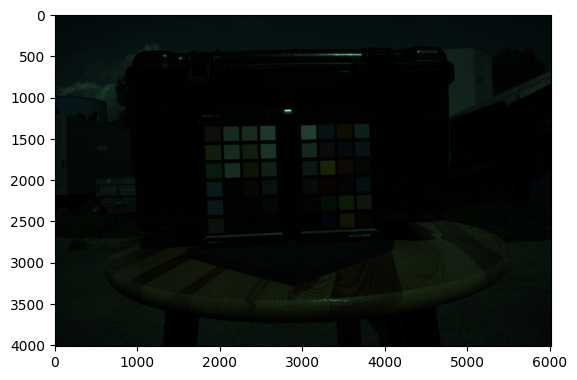

In [343]:
file_raw_0029o = ["data", "NikonD5600", "Outdoor", "OUT38", "INDIGO_2022-05-26_NikonD5600_0029.NEF"]
path_raw_0029o = os.path.join(*file_raw_0029o)

metadata = {"Camera": "Nikon D5600", "Date": [[2022, 5, 26], [14, 15, 00]], "ColourChecker": "SCK100", "Illuminant": OUT38, "Observer":2}
image_0029o = RawImage(path_raw_0029o, metadata, method="postprocess")

image_0029o.show(method="matplotlib")

RAW RGB data extraction

In [344]:
has_colourchecker, corners, size_rect = image_0029o.automatic_colourchecker_extraction(checker_name="SCK100_48", opencv_descriptor="SIFT")

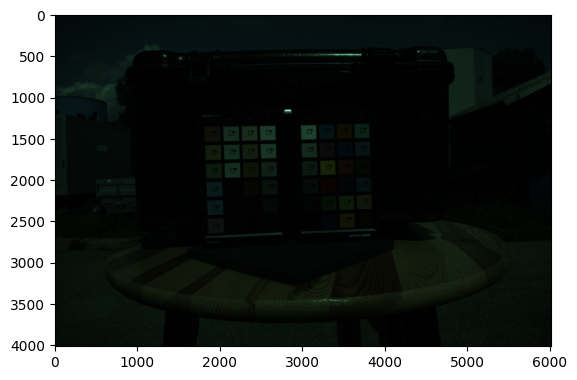

In [345]:
image_0029o.show_colourchecker(checker_name="SCK100", show_image=True, method="matplotlib")

In [346]:
SCK100_RGB_OUT38 = image_0029o.get_ColourCheckerRGB("SCK100").as_pandas_dataframe()

In [347]:
data_sck100_out38 = pd.merge(SCK100_XYZ_OUT38, SCK100_RGB_OUT38, on="patch_id")
data_sck100_out38.insert(0, "ColourChecker", "SCK100")
data_sck100_out38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant OUT-38.,36.589483,29.002199,18.884403,MeasuredIlluminant object: Illuminant OUT-38.,962.998521,1011.403846,635.886095
1,SCK100,A2,MeasuredIlluminant object: Illuminant OUT-38.,47.100036,48.091830,15.446829,MeasuredIlluminant object: Illuminant OUT-38.,1180.715976,1841.721893,678.108728
2,SCK100,A3,MeasuredIlluminant object: Illuminant OUT-38.,27.222282,35.837295,20.504365,MeasuredIlluminant object: Illuminant OUT-38.,622.871672,1740.960799,894.332101
3,SCK100,A4,MeasuredIlluminant object: Illuminant OUT-38.,24.772245,30.764313,44.381060,MeasuredIlluminant object: Illuminant OUT-38.,477.312870,1716.603550,1556.602071
4,SCK100,A5,MeasuredIlluminant object: Illuminant OUT-38.,26.699007,28.003448,48.533309,MeasuredIlluminant object: Illuminant OUT-38.,540.440089,1525.369822,1582.976331
5,SCK100,A6,MeasuredIlluminant object: Illuminant OUT-38.,34.604982,27.362907,30.370301,MeasuredIlluminant object: Illuminant OUT-38.,907.349852,1075.562870,933.831361
6,SCK100,B1,MeasuredIlluminant object: Illuminant OUT-38.,59.245651,60.108604,55.791131,MeasuredIlluminant object: Illuminant OUT-38.,1349.738166,2670.075444,1944.861686
7,SCK100,B2,MeasuredIlluminant object: Illuminant OUT-38.,56.271981,59.996549,54.735306,MeasuredIlluminant object: Illuminant OUT-38.,1276.204142,2755.961538,1946.897559
8,SCK100,B3,MeasuredIlluminant object: Illuminant OUT-38.,58.511341,60.196261,60.520247,MeasuredIlluminant object: Illuminant OUT-38.,1366.260355,2822.365385,2133.233728
9,SCK100,B4,MeasuredIlluminant object: Illuminant OUT-38.,6.035048,5.836987,5.285348,MeasuredIlluminant object: Illuminant OUT-38.,120.292899,199.785503,144.244822


In [348]:
data_out38.append(data_sck100_out38)

### WPP

White - E1

In [349]:
patch_max = find_patch_max_value(data_sck100_out38)
print(patch_max["XYZ"]["patch_id"])
print(patch_max["RGB"]["patch_id"])

['E1', 'E1', 'E1']
['E1', 'E1', 'E1']


In [350]:
data_sck100_out38 = apply_wpp(data_sck100_out38, "E1")
data_sck100_out38

,ColourChecker,patch_id,illuminant_x,X,Y,Z,illuminant_y,R,G,B
0,SCK100,A1,MeasuredIlluminant object: Illuminant OUT-38.,0.423715,0.323524,0.224013,MeasuredIlluminant object: Illuminant OUT-38.,0.482309,0.245327,0.213099
1,SCK100,A2,MeasuredIlluminant object: Illuminant OUT-38.,0.545430,0.536472,0.183235,MeasuredIlluminant object: Illuminant OUT-38.,0.591351,0.446729,0.227248
2,SCK100,A3,MeasuredIlluminant object: Illuminant OUT-38.,0.315241,0.399771,0.243230,MeasuredIlluminant object: Illuminant OUT-38.,0.311960,0.422289,0.299709
3,SCK100,A4,MeasuredIlluminant object: Illuminant OUT-38.,0.286869,0.343181,0.526463,MeasuredIlluminant object: Illuminant OUT-38.,0.239058,0.416381,0.521649
4,SCK100,A5,MeasuredIlluminant object: Illuminant OUT-38.,0.309181,0.312383,0.575718,MeasuredIlluminant object: Illuminant OUT-38.,0.270675,0.369995,0.530488
5,SCK100,A6,MeasuredIlluminant object: Illuminant OUT-38.,0.400734,0.305237,0.360263,MeasuredIlluminant object: Illuminant OUT-38.,0.454438,0.260889,0.312946
6,SCK100,B1,MeasuredIlluminant object: Illuminant OUT-38.,0.686079,0.670521,0.661813,MeasuredIlluminant object: Illuminant OUT-38.,0.676005,0.647655,0.651763
7,SCK100,B2,MeasuredIlluminant object: Illuminant OUT-38.,0.651643,0.669271,0.649288,MeasuredIlluminant object: Illuminant OUT-38.,0.639176,0.668488,0.652446
8,SCK100,B3,MeasuredIlluminant object: Illuminant OUT-38.,0.677576,0.671499,0.717911,MeasuredIlluminant object: Illuminant OUT-38.,0.684280,0.684595,0.714891
9,SCK100,B4,MeasuredIlluminant object: Illuminant OUT-38.,0.069887,0.065112,0.062697,MeasuredIlluminant object: Illuminant OUT-38.,0.060248,0.048460,0.048339


In [351]:
data_sck100_out38.describe()

,X,Y,Z,R,G,B
count,48.000000,48.000000,48.000000,48.000000,48.000000,48.000000
mean,0.352295,0.340599,0.304916,0.355051,0.315122,0.295670
std,0.248913,0.248738,0.250364,0.266226,0.248635,0.251662
min,0.047090,0.047131,0.048739,0.018762,0.018654,0.019412
25%,0.142515,0.137983,0.083301,0.122316,0.103704,0.077111
50%,0.312211,0.295110,0.233621,0.311802,0.266217,0.220173
75%,0.515768,0.490815,0.459350,0.550901,0.449838,0.438215
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [352]:
data_wpp_out38.append(data_sck100_out38)

## Merge data

In [353]:
data_pd_out38 = pd.concat(data_out38, ignore_index=True)

data_pd_out38 = data_pd_out38.drop(columns="illuminant_y")
data_pd_out38 = data_pd_out38.rename(columns={"illuminant_x":"illuminant"})
data_pd_out38["illuminant"] = "OUT-38" # as str to avoid error
data_pd_out38

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,OUT-38,17.019386,10.871192,14.000805,419.207483,260.759637,323.977324
1,CCDSG,B3,OUT-38,39.099460,32.775758,44.825191,963.408163,1444.553288,1436.700680
2,CCDSG,B4,OUT-38,15.293600,9.750916,24.760794,299.311791,320.168934,601.224490
3,CCDSG,B5,OUT-38,18.983367,21.458387,53.076720,285.736961,1379.052154,1795.023810
4,CCDSG,B6,OUT-38,24.444401,31.933887,50.187256,443.570295,1921.020408,1854.829932
...,...,...,...,...,...,...,...,...,...
187,SCK100,H2,OUT-38,25.121599,23.837313,39.637589,540.468195,1202.048077,1258.322485
188,SCK100,H3,OUT-38,10.529568,13.067079,6.374851,219.065089,530.659763,222.353550
189,SCK100,H4,OUT-38,17.586503,18.875761,30.838330,333.934911,972.063609,963.831361
190,SCK100,H5,OUT-38,38.344772,34.811550,22.347540,1049.634615,1381.890533,820.476331


In [354]:
data_pd_wpp_out38 = pd.concat(data_wpp_out38, ignore_index=True)

data_pd_wpp_out38 = data_pd_wpp_out38.drop(columns="illuminant_y")
data_pd_wpp_out38 = data_pd_wpp_out38.rename(columns={"illuminant_x":"illuminant"})
data_pd_wpp_out38["illuminant"] = "SPD38" # as str to avoid error
data_pd_wpp_out38

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,SPD38,0.194845,0.119592,0.164366,0.195639,0.058829,0.101226
1,CCDSG,B3,SPD38,0.447627,0.360561,0.526236,0.449610,0.325900,0.448893
2,CCDSG,B4,SPD38,0.175087,0.107268,0.290685,0.139685,0.072232,0.187851
3,CCDSG,B5,SPD38,0.217329,0.236061,0.623106,0.133350,0.311122,0.560850
4,CCDSG,B6,SPD38,0.279850,0.351300,0.589185,0.207009,0.433393,0.579537
...,...,...,...,...,...,...,...,...,...
187,SCK100,H2,SPD38,0.290914,0.265909,0.470194,0.270689,0.291570,0.421690
188,SCK100,H3,SPD38,0.121935,0.145765,0.075621,0.109717,0.128717,0.074515
189,SCK100,H4,SPD38,0.203656,0.210562,0.365814,0.167248,0.235784,0.323000
190,SCK100,H5,SPD38,0.444042,0.388328,0.265094,0.525700,0.335192,0.274959


## Export data as CSV

Merge all data

In [355]:
data_ODS = pd.concat([data_pd_jnd65, data_pd_jna, data_pd_jnf, data_pd_jnd50, data_pd_in30, data_pd_in29, data_pd_out38], ignore_index=True)

XYZ in range (0,1)

In [356]:
data_ODS["X"] = data_ODS["X"]/100
data_ODS["Y"] = data_ODS["Y"]/100
data_ODS["Z"] = data_ODS["Z"]/100

RAW RBB in range (0,1)

In [357]:
from coolpi.image.raw_operations import get_bits_image

In [358]:
bits = get_bits_image([data_ODS["R"],data_ODS["G"],data_ODS["B"]])

In [359]:
bits

14

In [360]:
import math

In [361]:
data_ODS["R"] = data_ODS["R"]/(math.pow(2,bits)-1)
data_ODS["G"] = data_ODS["G"]/(math.pow(2,bits)-1)
data_ODS["B"] = data_ODS["B"]/(math.pow(2,bits)-1)

In [362]:
data_ODS.describe()

,X,Y,Z,R,G,B
count,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000
mean,0.318525,0.303143,0.182608,0.064431,0.097695,0.055118
std,0.215542,0.207890,0.176985,0.051075,0.080233,0.057952
min,0.031142,0.033224,0.010777,0.001523,0.002883,0.001213
25%,0.133517,0.131109,0.057482,0.021596,0.034882,0.016959
50%,0.284703,0.255467,0.113288,0.053637,0.080352,0.035187
75%,0.446161,0.419601,0.250322,0.096735,0.133096,0.072733
max,1.030676,0.921478,1.040461,0.252151,0.565646,0.464173


In [363]:
path_csv = os.path.join("res", "csv", "ND-ODS.csv")
data_ODS.to_csv(path_csv, sep=";")

Merge all data

In [364]:
data_WPP = pd.concat([data_pd_wpp_jnd65, data_pd_wpp_jna, data_pd_wpp_jnf, data_pd_wpp_jnd50, data_pd_wpp_in30, data_pd_wpp_in29, data_pd_wpp_out38], ignore_index=True)

In [365]:
data_WPP

,ColourChecker,patch_id,illuminant,X,Y,Z,R,G,B
0,CCDSG,B2,JN-D65,0.192153,0.118824,0.161651,0.215988,0.069184,0.114175
1,CCDSG,B3,JN-D65,0.450698,0.362052,0.523813,0.475675,0.356060,0.483055
2,CCDSG,B4,JN-D65,0.177136,0.107950,0.287000,0.139831,0.079842,0.194480
3,CCDSG,B5,JN-D65,0.233731,0.246097,0.625016,0.132157,0.312693,0.540737
4,CCDSG,B6,JN-D65,0.292570,0.360806,0.590597,0.191563,0.401417,0.526337
...,...,...,...,...,...,...,...,...,...
1339,SCK100,H2,SPD38,0.290914,0.265909,0.470194,0.270689,0.291570,0.421690
1340,SCK100,H3,SPD38,0.121935,0.145765,0.075621,0.109717,0.128717,0.074515
1341,SCK100,H4,SPD38,0.203656,0.210562,0.365814,0.167248,0.235784,0.323000
1342,SCK100,H5,SPD38,0.444042,0.388328,0.265094,0.525700,0.335192,0.274959


In [366]:
path_csv = os.path.join("res", "csv", "ND_WPPDS.csv")
data_WPP.to_csv(path_csv, sep=";")